# Import and preparation

In [112]:
import os

In [113]:
import sys


In [114]:
import pandas as pd

In [115]:
import matplotlib.pyplot as plt

In [116]:
import seaborn as sns

In [117]:
import scipy.stats as stat

In [118]:
current_directory = os.getcwd()
print(current_directory)


/home/borela/fontes/ind-ir/code


In [119]:
from util import util_evaluation

In [120]:
import numpy as np

In [121]:
import importlib


In [149]:
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [123]:
DATASET_NAME = 'juris_tcu_index'

In [150]:
util_evaluation.consolidate_result(DATASET_NAME)

df_experiment.shape[0] 149
df_experiment_result.shape[0] 30821
df_experiment_result.shape (30821, 21)
df_query.shape[0] 16045
df_qrel.shape[0] 94809
df_search_data.shape[0] 94809


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


Generated file with 30821 records


In [151]:
df_result = util_evaluation.return_consolidate_result(DATASET_NAME)

In [152]:
# retirando busca em toda a base
df_result = df_result[df_result['COUNT_QUERY_RUN']!=16045] 

In [153]:
df_result.shape

(14776, 33)

In [157]:
len(df_result['QUERY_ID'].unique()), len(df_result['TIME'].unique())

(197, 148)

In [156]:
df_result.groupby(['QUERY_ID'])['TIME'].agg( ['count','nunique'])

,count,nunique
QUERY_ID,,
36,148,148
1650,148,148
1926,76,76
4273,148,148
5707,76,76
...,...,...
112527,76,76
121437,76,76
142377,76,76


In [158]:
groups = df_result.groupby('QUERY_ID')['TIME'].nunique()
query_ids_with_148_times = groups[groups == 148].index.tolist()


In [163]:
df_groups = pd.DataFrame(groups).reset_index()

In [164]:
df_groups

,QUERY_ID,TIME
0,36,148
1,1650,148
2,1926,76
3,4273,148
4,5707,76
...,...,...
192,112527,76
193,121437,76
194,142377,76
195,144640,76


In [166]:
df_groups.sort_values('TIME', ascending=False)

,QUERY_ID,TIME
0,36,148
3,4273,148
1,1650,148
74,27073,76
90,30267,76
...,...,...
82,28953,72
84,29523,72
86,29612,72
32,16285,64


In [159]:
len(query_ids_with_148_times)

3

In [16]:
df_result.head()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
0,20.4052,21.40,2,300,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 5088, 149...",bm25,300,...,252,6,40,73,56,4,4,1,20.0,monot5
1,14.1932,21.40,2,200,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 14920, 19...",bm25,200,...,252,6,40,73,56,4,4,1,20.0,monot5
2,7.2503,21.40,2,100,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 1948, 120...",bm25,100,...,252,6,40,73,56,4,4,1,20.0,monot5
3,21.3537,49.13,2,300,"[4, 2, 5]",5,NaN,"[2522, 2523, 5221, 1002, 1100292, 2530, 1078, ...",bm25,300,...,252,6,40,73,56,4,4,3,60.0,monot5
4,14.4624,36.01,2,200,"[4, 2]",5,NaN,"[2522, 2523, 5221, 1002, 2530, 1078, 1981, 508...",bm25,200,...,252,6,40,73,56,4,4,2,40.0,monot5


In [17]:
list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category = ['RETRIEVER_TYPE', 'TOPK_RETRIEVER', 'TOPK_RANKER',
       'CRITERIA', 'RANKER_TYPE', #'RANKER_MODEL_NAME',
       # about query
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG', 
       ]


In [18]:
dict_metrics = {}
for metrica in list_metric:
    dict_metrics[metrica] = ['count', 'mean', 'median']
print(dict_metrics)


{'RANK1': ['count', 'mean', 'median'], 'NDCG': ['count', 'mean', 'median'], 'PERCENT_DOCTO_RELEVANT_FOUND': ['count', 'mean', 'median']}


In [19]:
raise Exception("Define next evaluation")

Exception: Define next evaluation

Some observations

        TOPK_RANKER: does not alter ndcg and time_spent for diferente values of TOPK_RETRIEVER(it depends on TOPK_RETRIEVER)
        TOPK_RANKER: impacts ndcg, rank1 and list_returned (if TOPK_RANKER is less than TOPK_RETRIEVER)

        for criteria area (topk_retriever always bring all)
                it do not depends on retriever type, onle of ranker

# All data

## Separate found x not found

In [70]:
df_not_found = df_result[df_result['RANK1']==0]

In [71]:
df_not_found.shape

(794, 31)

In [72]:
df_result = df_result[df_result['RANK1']>0]

In [73]:
df_result.shape

(11482, 31)

In [74]:
del df_not_found['RANK1']

## Some consolidated data

In [ ]:
df_result.groupby(['RETRIEVER_TYPE','RANKER_TYPE', 'CRITERIA']).agg(dict_metrics).dropna()

RANK1                   NDCG  \
                                       count      mean median count   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                                   
bm25           minilm      total        1078  8.205937    2.0  1078   
                           total_gte_5  1083  6.986150    2.0  1083   
               monott5     total         700  3.507143    1.0   700   
                           total_gte_5   700  3.025714    1.0   700   
sts            minilm      total        1052  8.588403    2.0  1052   
                           total_gte_5  1063  7.428975    2.0  1063   
               monott5     total         688  3.760174    1.0   688   
                           total_gte_5   692  3.333815    1.0   692   

                                                          \
                                             mean median   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                        
bm25           minilm      total        24.892588  27.49   
                           total_gte_5  25.547599  27.49   
               monott5     total        39.337014  40.26   
                           total_gte_5  39.810414  39.96   
sts            minilm      total        23.463470  21.40   
                           total_gte_5  24.639915  25.29   
               monott5     total        35.494055  35.38   
                           total_gte_5  36.411575  39.04   

                                       PERCENT_DOCTO_RELEVANT_FOUND  \
                                                              count   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                                   
bm25           minilm      total                               1078   
                           total_gte_5                         1083   
               monott5     total                                700   
                           total_gte_5                          700   
sts            minilm      total                               1052   
                           total_gte_5                         1063   
               monott5     total                                688   
                           total_gte_5                          692   

                                                          
                                             mean median  
RETRIEVER_TYPE RANKER_TYPE CRITERIA                       
bm25           minilm      total        46.130074  50.00  
                           total_gte_5  48.614340  50.00  
               monott5     total        57.966686  57.14  
                           total_gte_5  61.557000  62.50  
sts            minilm      total        41.339715  40.00  
                           total_gte_5  44.743396  44.44  
               monott5     total        50.890727  50.00  
                           total_gte_5  56.450014  55.56

In [ ]:
df_result.dropna().groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE', 'TOPK_RETRIEVER', 'TOPK_RANKER']).agg(dict_metrics).dropna()

RANK1  \
                                                                  count   
CRITERIA    RETRIEVER_TYPE RANKER_TYPE TOPK_RETRIEVER TOPK_RANKER         
total       sts            minilm      100            50              6   
                                                      100             6   
                                                      200             6   
                                       200            50              6   
                                                      100             6   
                                                      200             6   
                                       300            50              6   
                                                      100             6   
                                                      200             6   
                                       400            50              6   
                                                      200             6   
                           monott5     100            50              6   
                                                      100             6   
                                       200            50              6   
                                                      100             6   
                                       300            50              6   
                                                      100             6   
                                       400            50              6   
total_gte_5 sts            minilm      100            50              6   
                                                      100             6   
                                                      200             6   
                                       200            50              6   
                                                      100             6   
                                                      200             6   
                                       300            50              6   
                                                      100             6   
                                                      200             6   
                                       400            50              6   
                                                      200             6   
                           monott5     100            50              6   
                                                      100             6   
                                       200            50              6   
                                                      100             6   
                                       300            50              6   
                                                      100             6   
                                       400            50              6   

                                                                             \
                                                                       mean   
CRITERIA    RETRIEVER_TYPE RANKER_TYPE TOPK_RETRIEVER TOPK_RANKER             
total       sts            minilm      100            50           6.333333   
                                                      100          6.333333   
                                                      200          6.333333   
                                       200            50           1.833333   
                                                      100          1.833333   
                                                      200          1.833333   
                                       300            50           2.666667   
                                                      100          2.666667   
                                                      200          2.666667   
                                       400            50           3.166667   
                                                      200          3.166667   
                           monott5

In [ ]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

COUNT_DOCTO_RELEVANT                 
                                                      count      mean median
CRITERIA    RETRIEVER_TYPE RANKER_TYPE                                      
total       bm25           minilm                        22  7.818182    7.5
            sts            minilm                        48  6.166667    6.0
                           monott5                       12  5.000000    5.0
total_gte_5 bm25           minilm                        17  7.823529    9.0
            sts            minilm                        37  6.513514    7.0
                           monott5                        8  5.500000    5.0

## Found x Not found

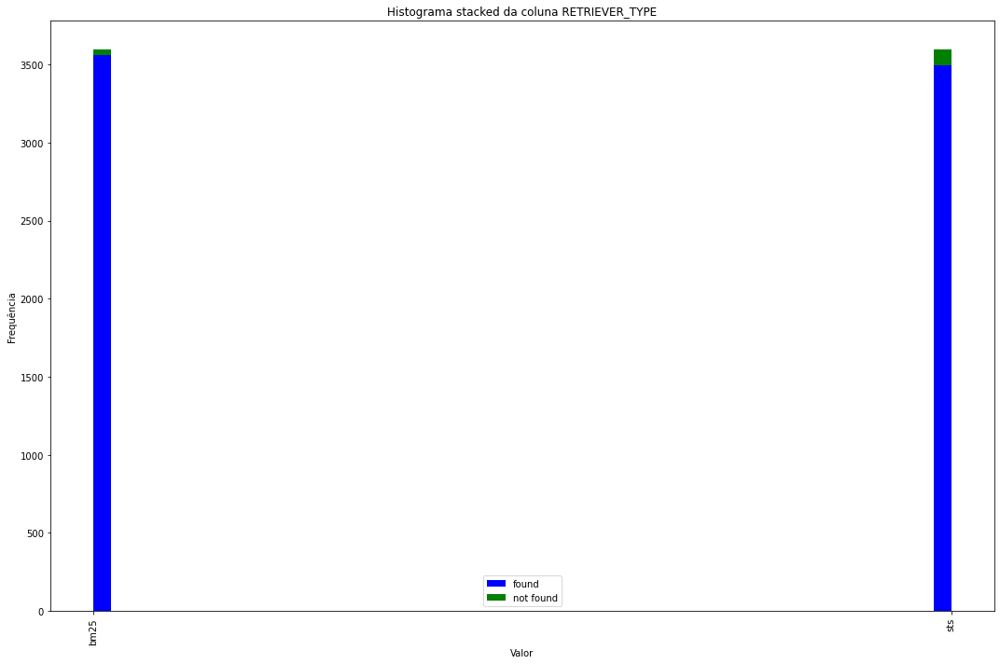

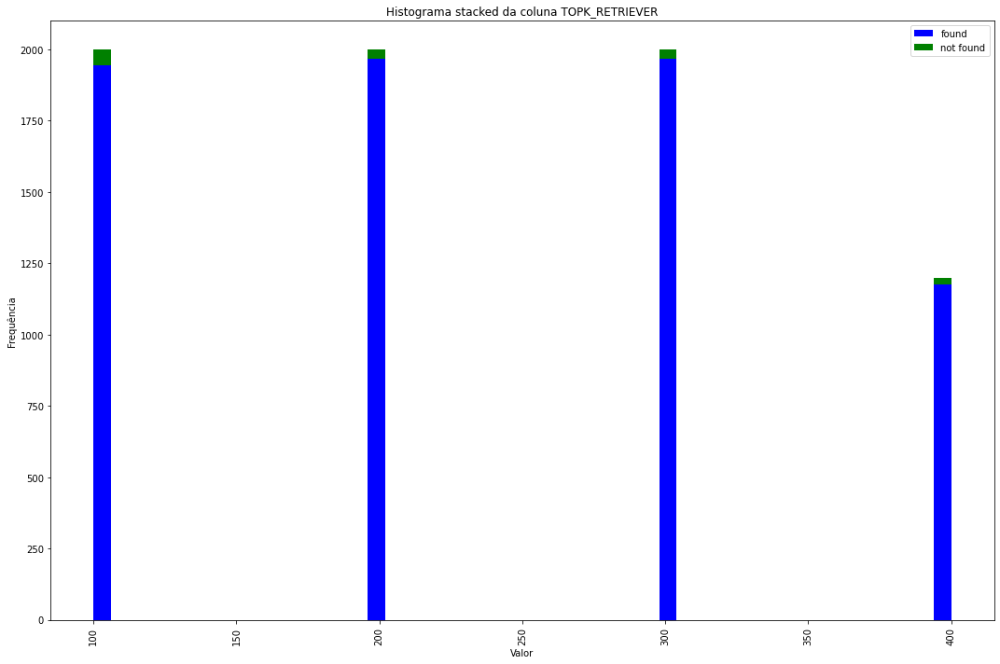

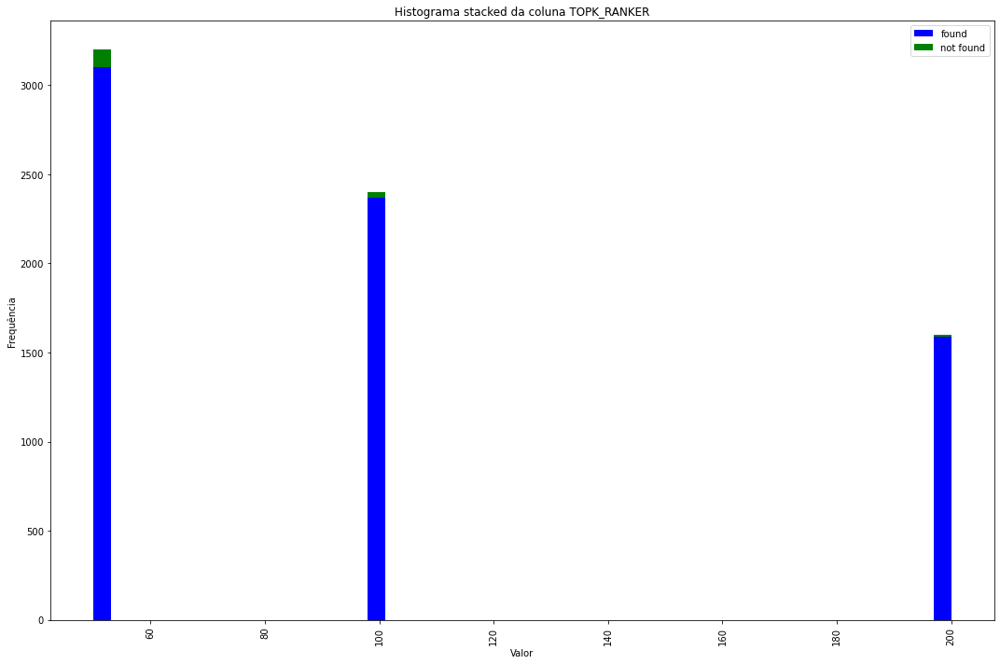

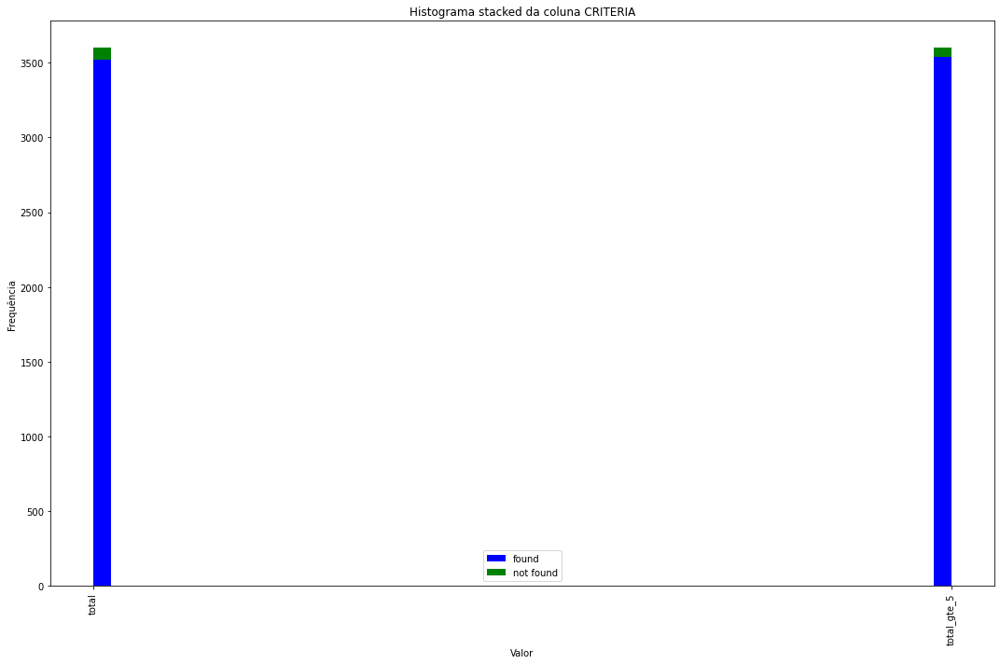

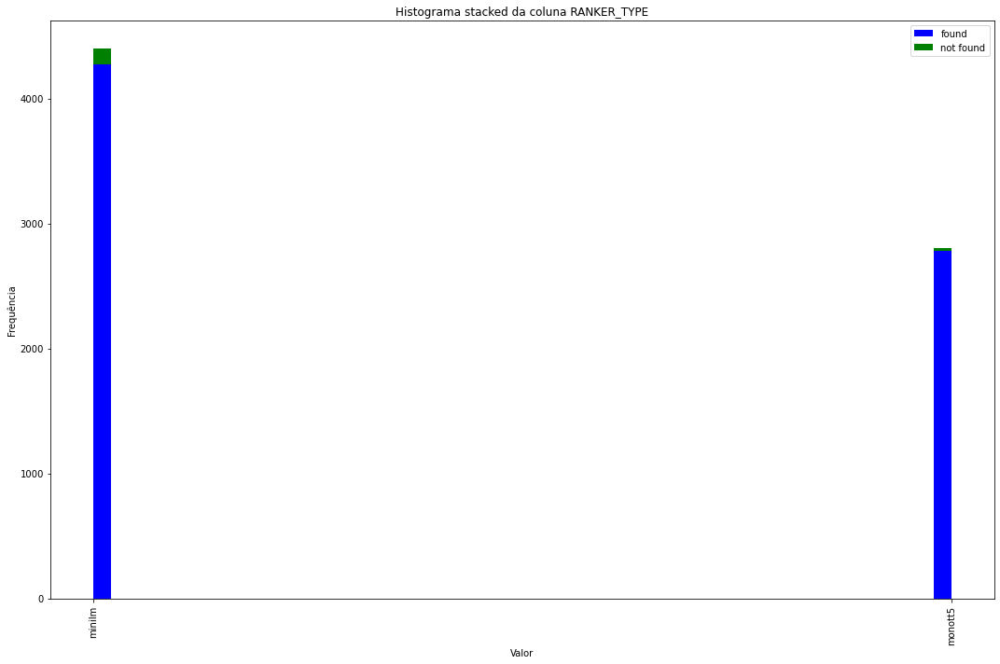

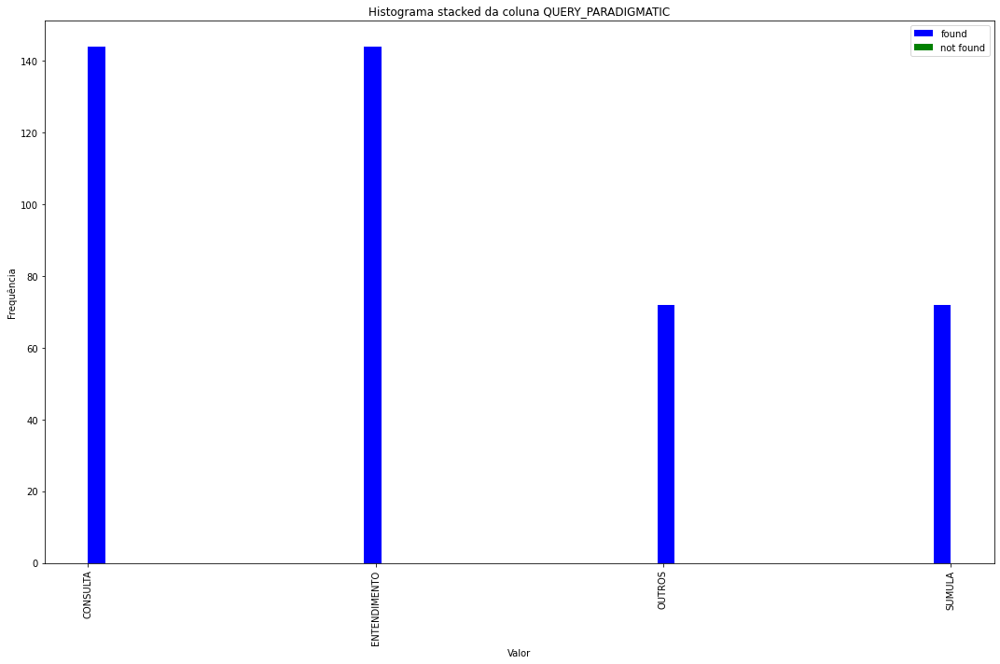

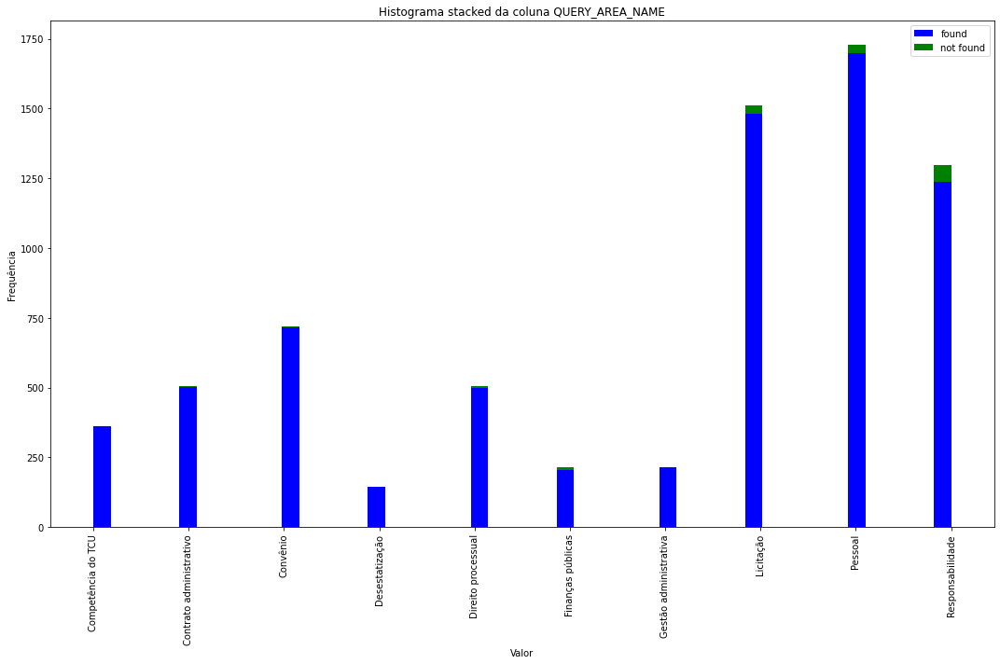

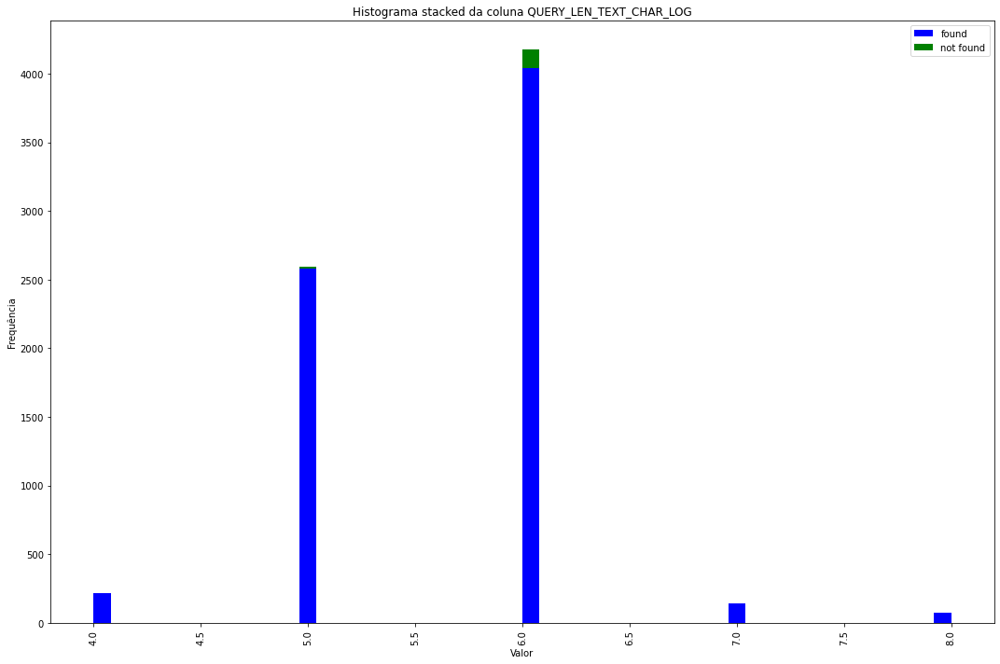

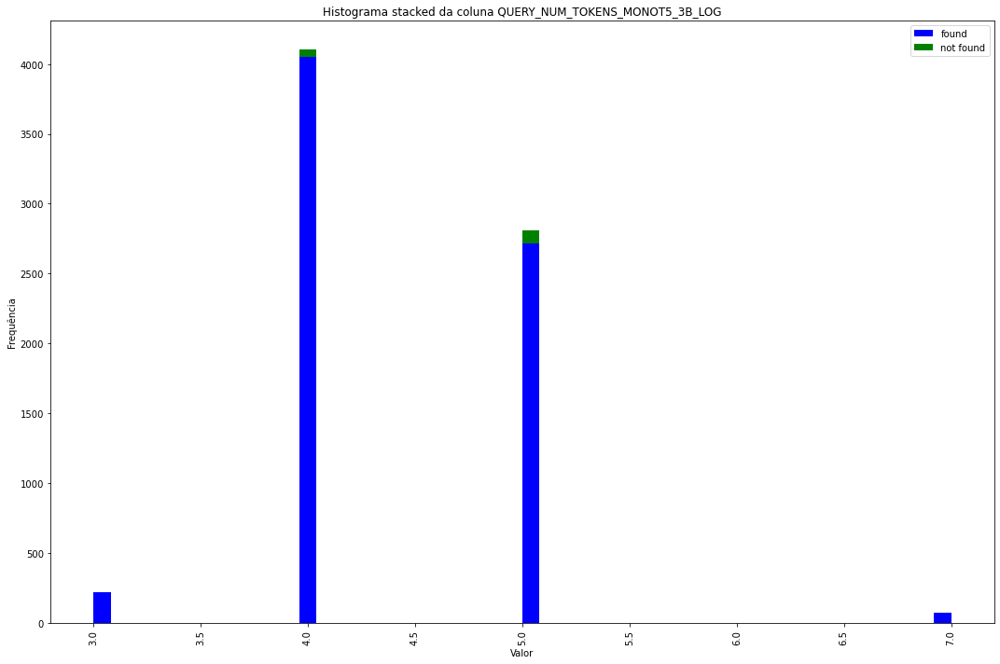

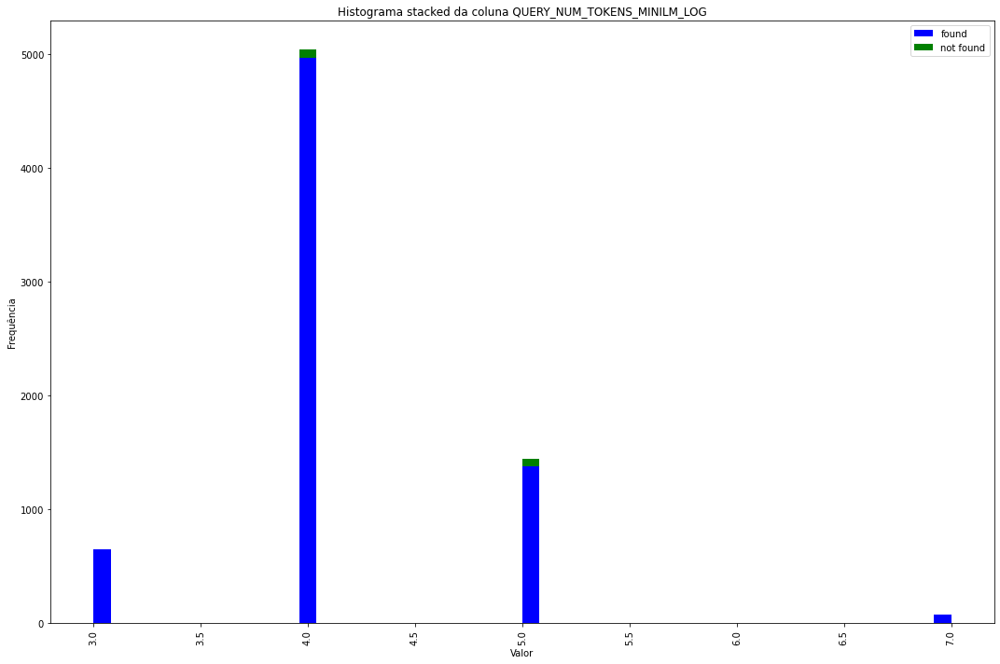

In [ ]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


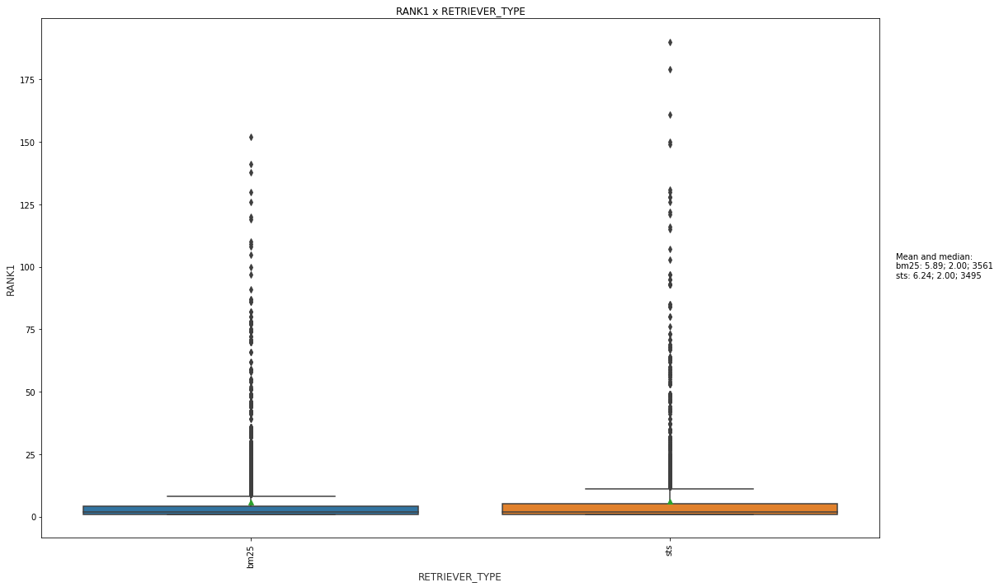

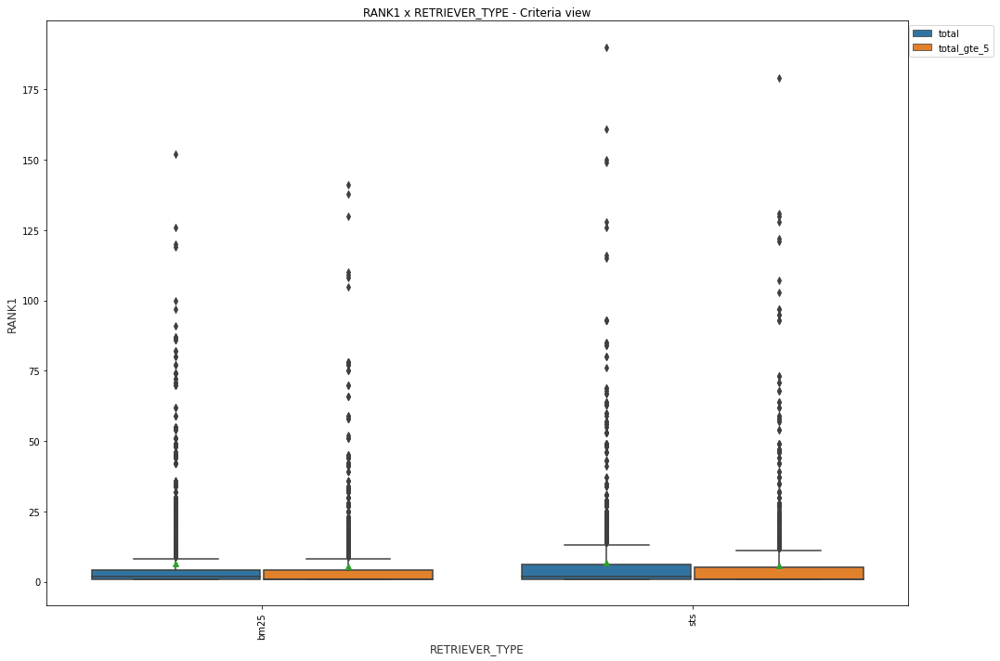

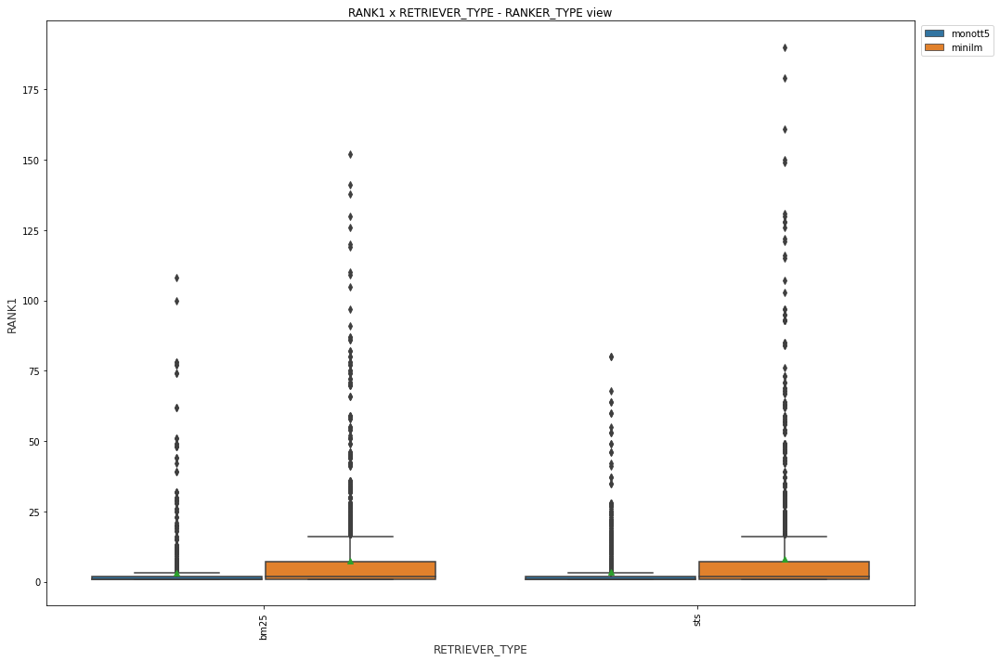

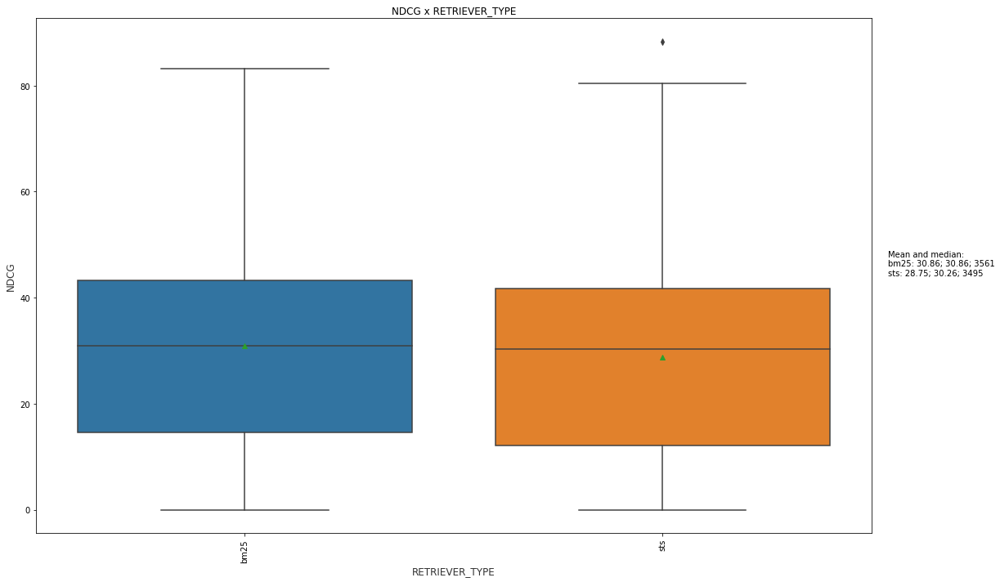

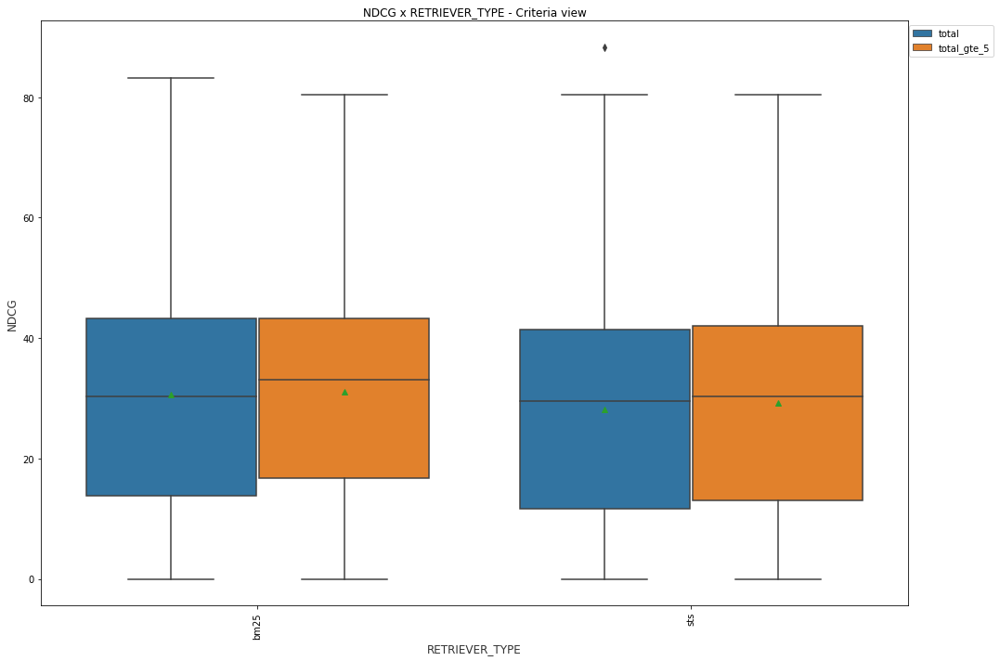

...

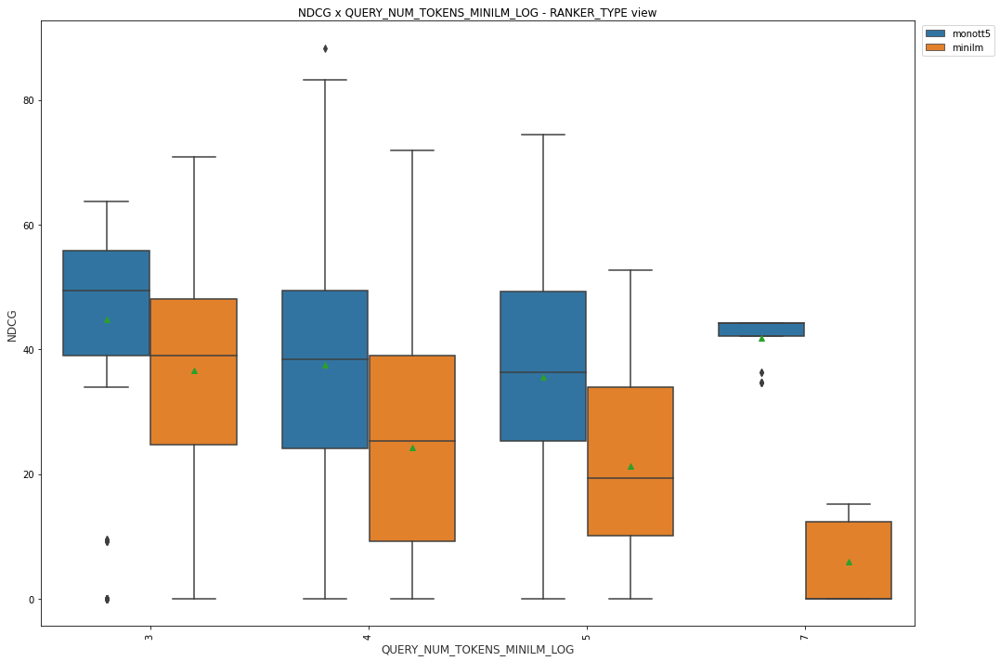

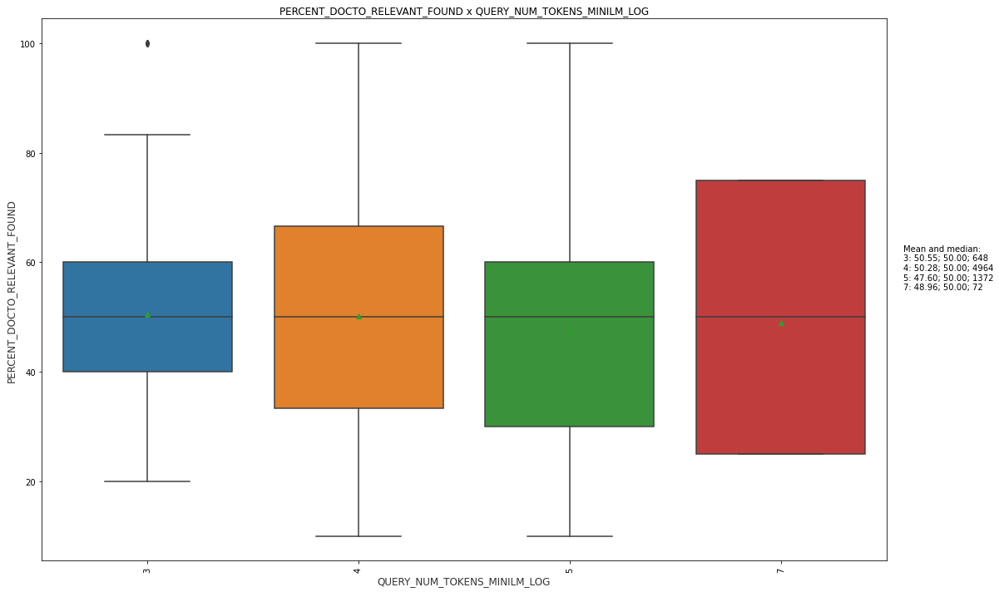

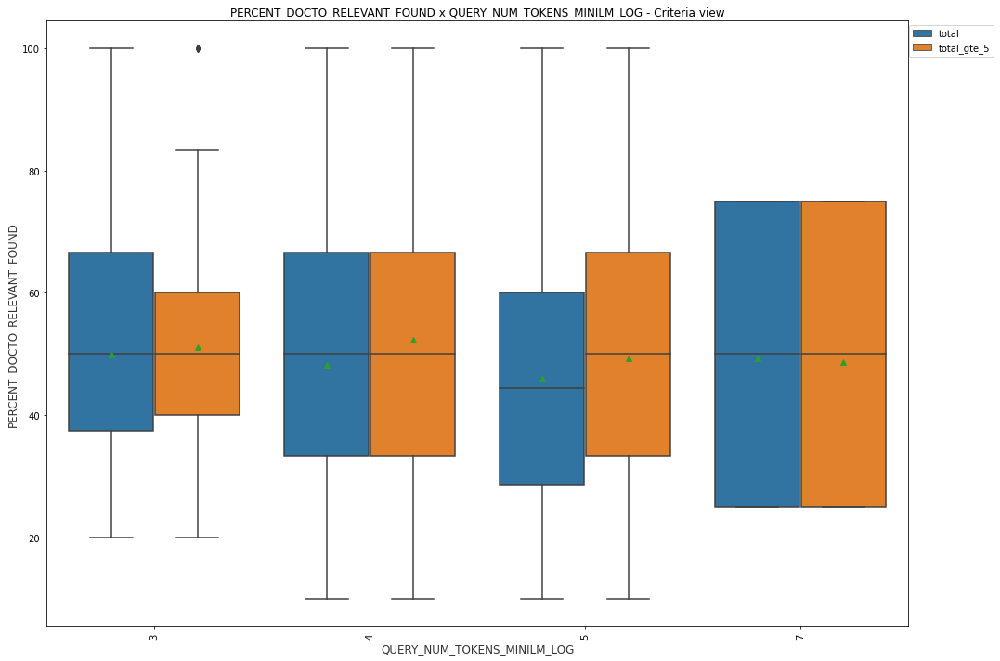

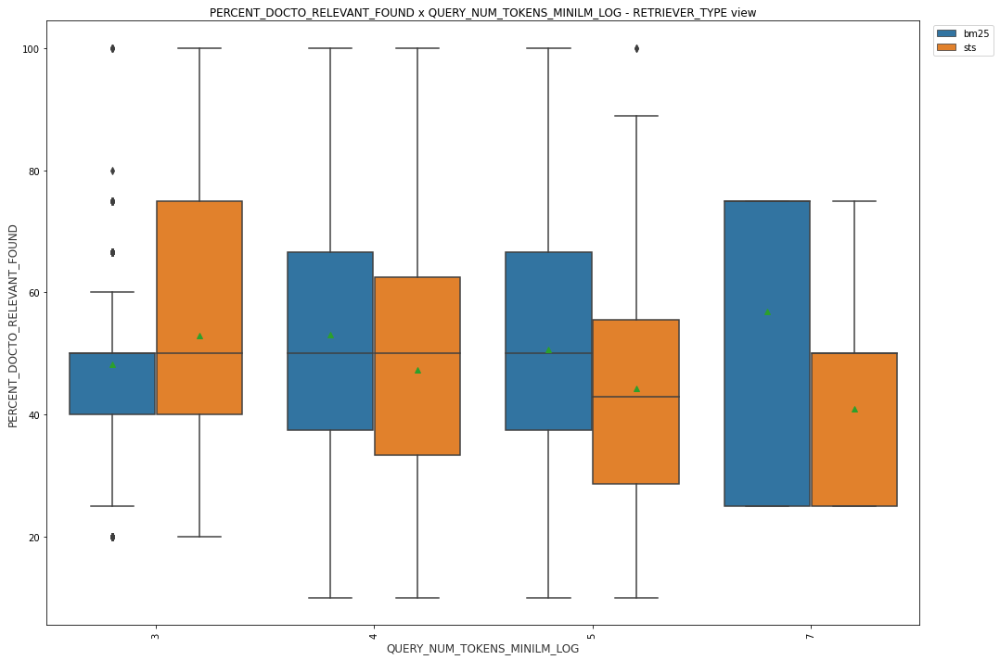

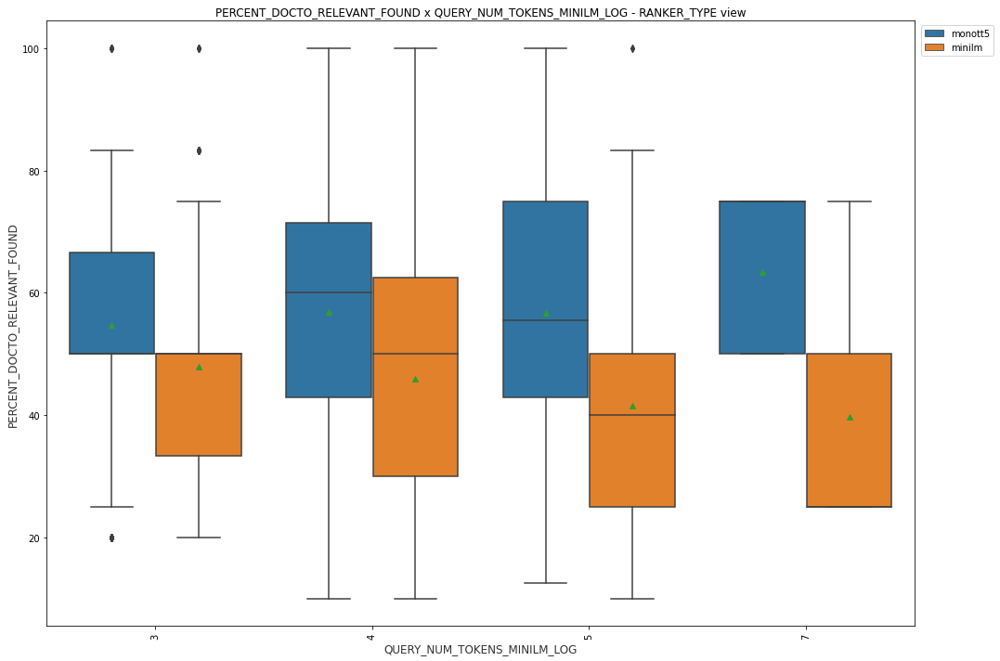

In [ ]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

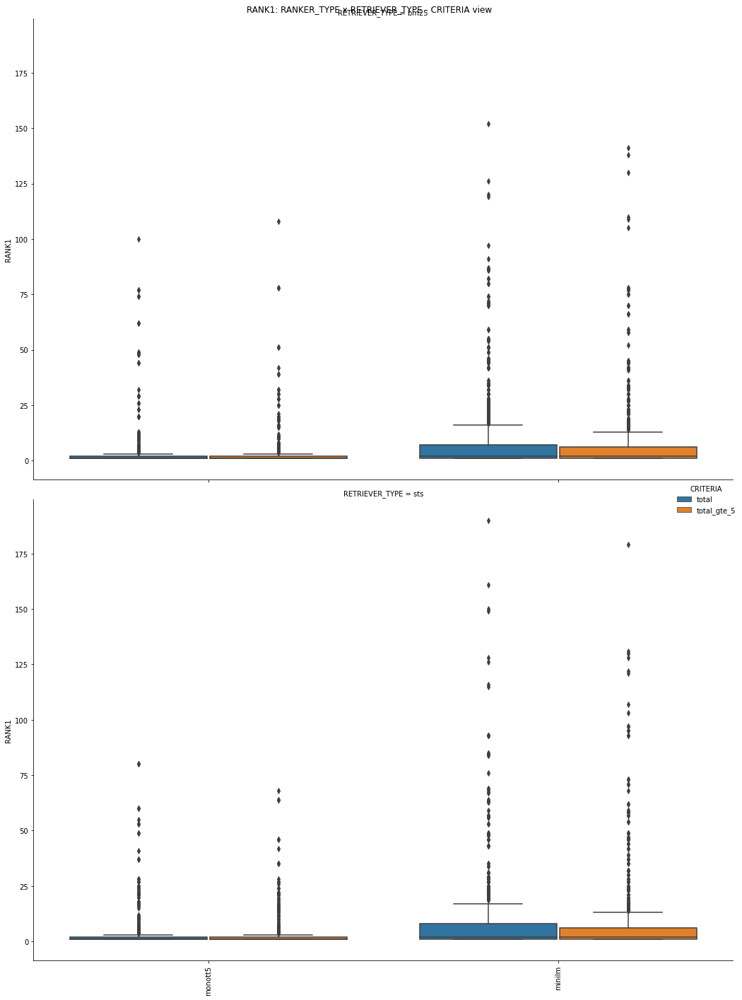

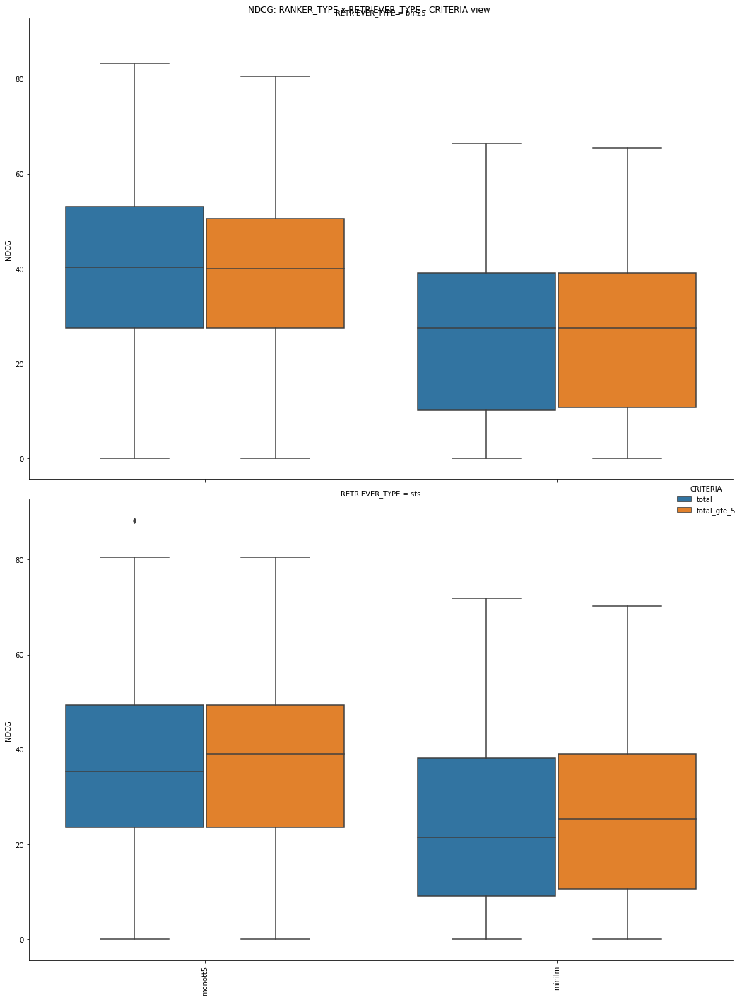

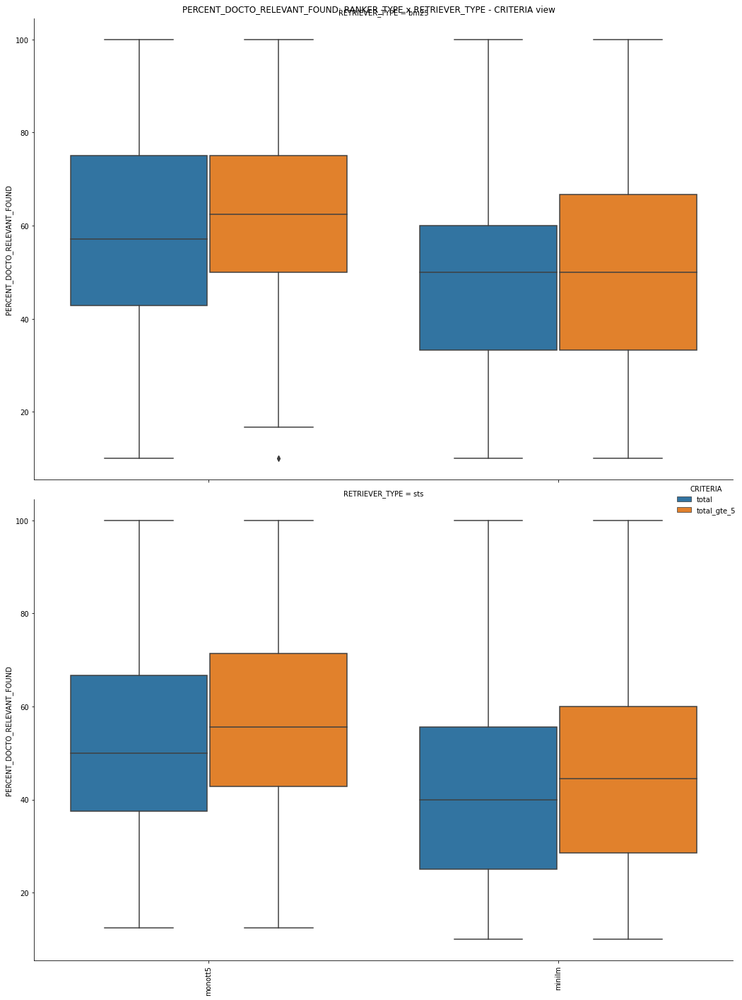

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

STS encontrou mais (percent_found)
BM25 alcançou ndcg melhor entre os 12 primeiros


In [ ]:
df_result.corr()

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
COUNT_DOCTO_RELEVANT,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.109893,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.004916,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,-0.039241,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,0.001812,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.009382,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,0.003800,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,-0.000556,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,1.000000,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
QUERY_ID_DOCTO,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,0.158068,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


## Correlation 

In [ ]:
df_result.corr()

,ID_QUERY,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,ID_DOCTO,LEN_TEXT_CHAR,LEN_TEXT_CHAR_LOG,NUM_WORD,NUM_TOKENS_MONOT5_3B,NUM_TOKENS_MINILM,NUM_TOKENS_MONOT5_3B_LOG,NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
ID_QUERY,1.000000,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
COUNT_DOCTO_RELEVANT,-0.109893,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.004916,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.039241,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.001812,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,-0.009382,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,0.003800,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,-0.000556,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ID_DOCTO,0.158068,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


    NDCG    
        COUNT_DOCTO_FOUND
        RANK1
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT(-)
        TOPK_RANKER (-)
        LEN_TEXT_CHAR_LOG (-)

    RANK1 (contribui se leva a um rank1 menor)
        PERCENT_DOCTO_RELEVANT_FOUND
        NDCG
        COUNT_DOCTO_RELEVANT (-)
        TOPK_RANKER (-)

    COUNT_DOCTO_RELEVANT
        COUNT_DOCTO_RELEVANT_FOUND
        LEN_TEXT_CHAR_LOG

    TIME_SPENT
        COUNT_DOCTO_RELEVANT_FOUND
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        TOPK_RANKER (-)

    COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND

    TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


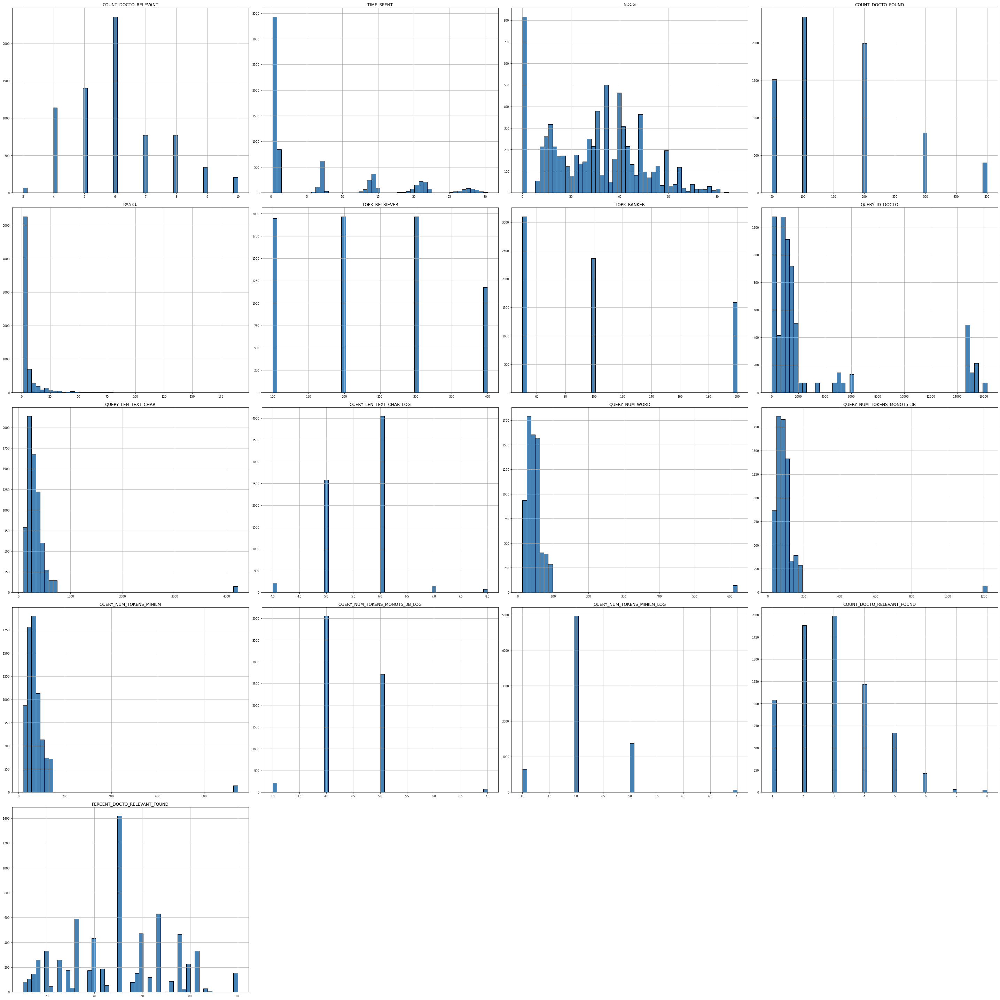

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

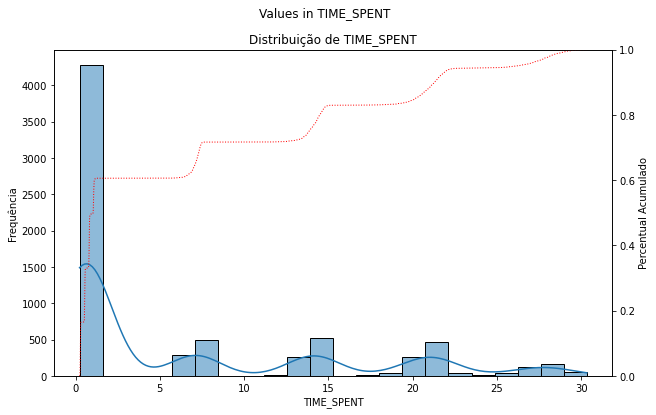

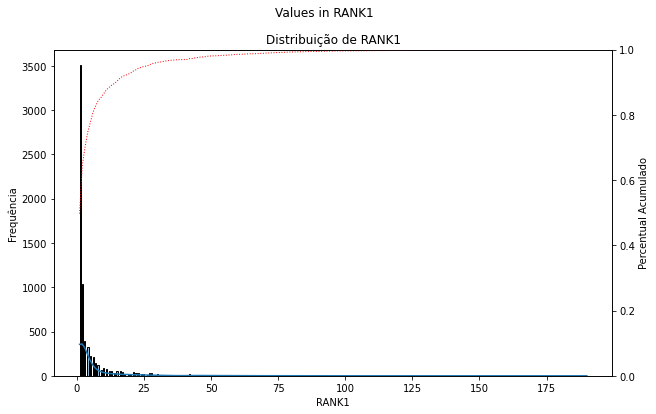

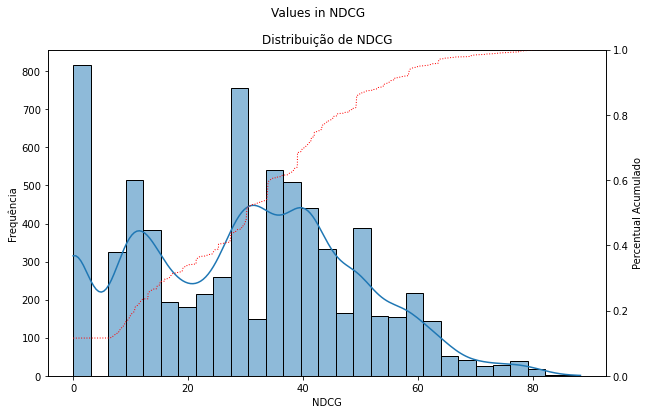

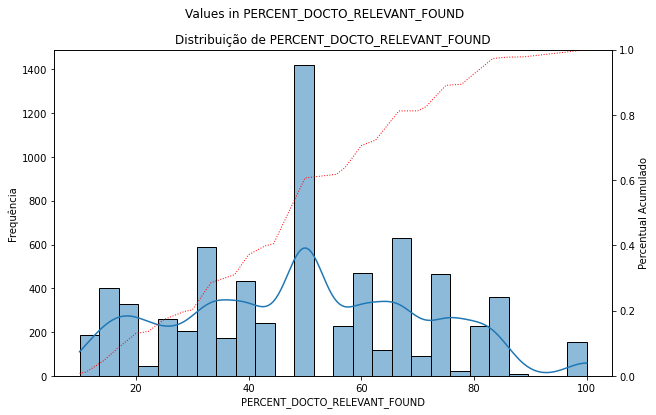

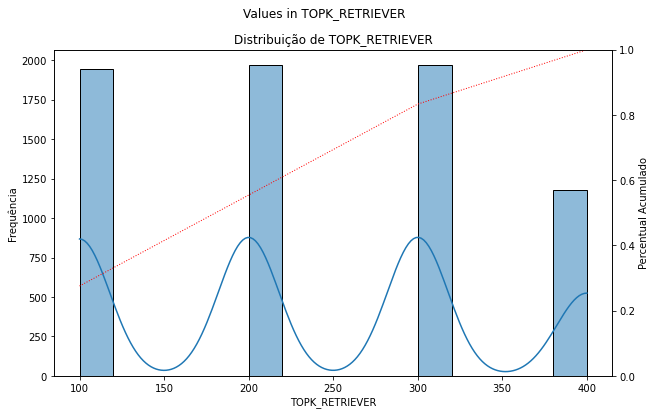

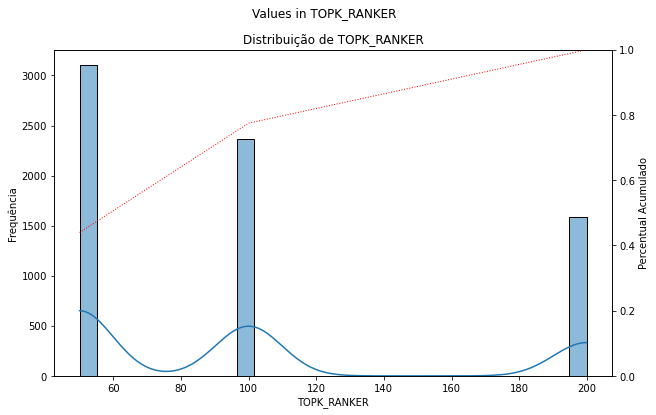

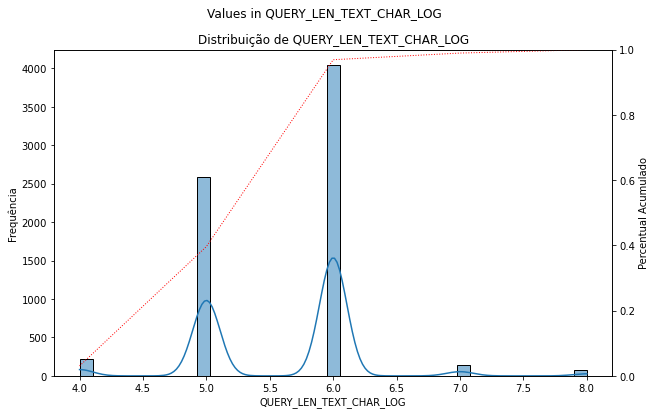

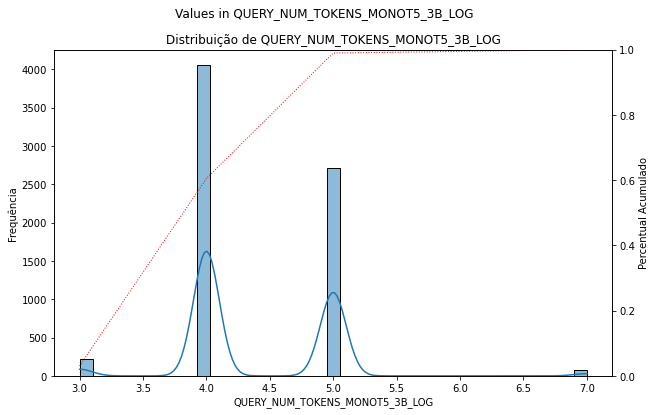

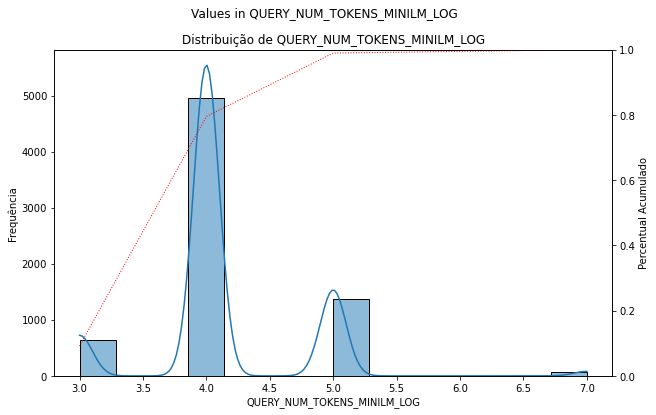

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

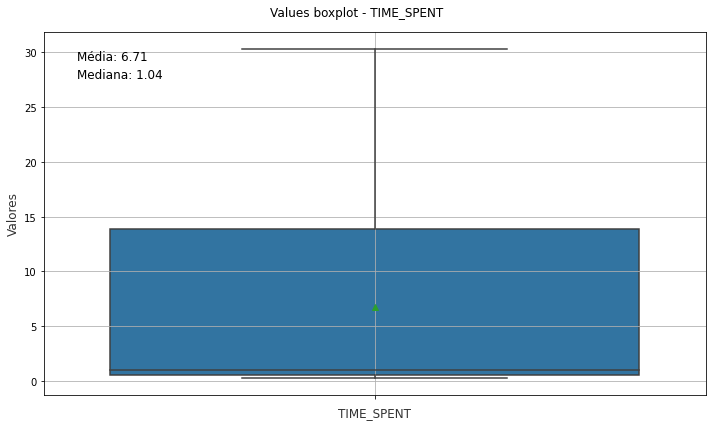

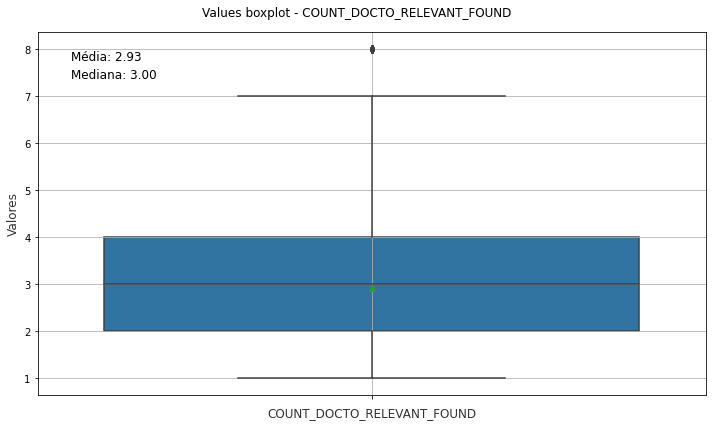

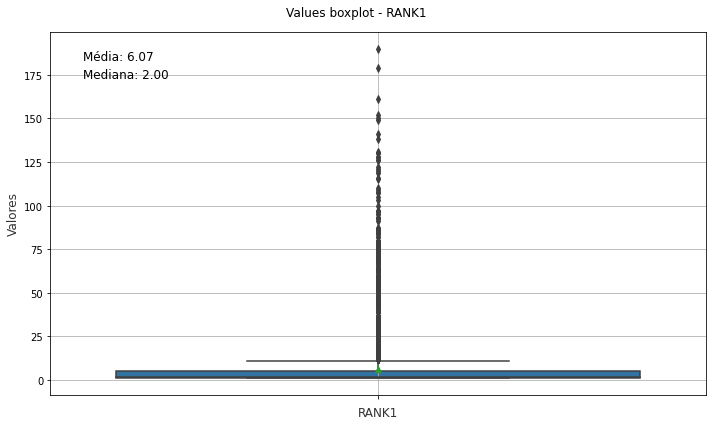

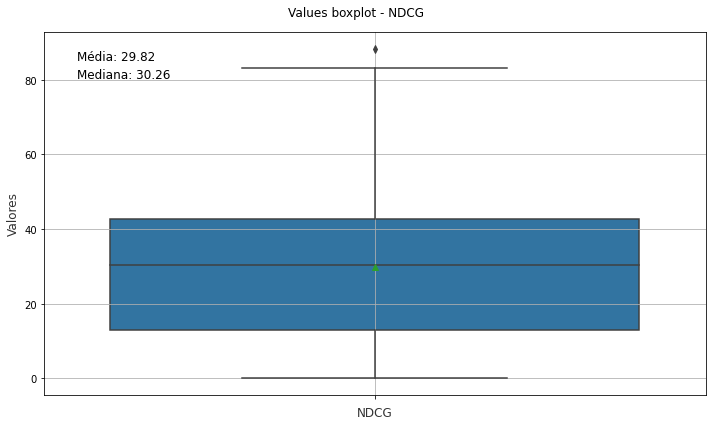

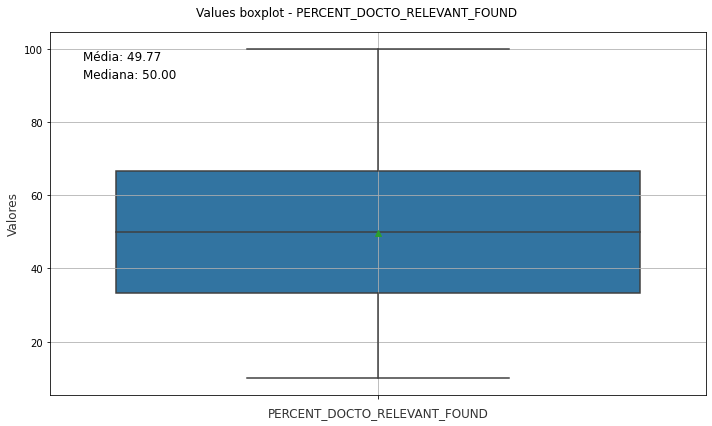

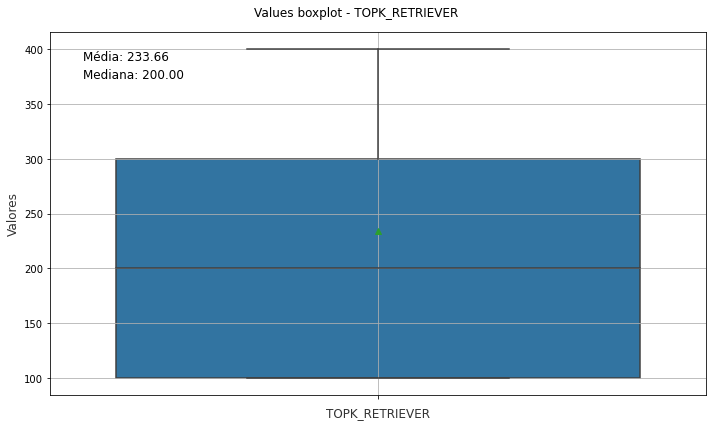

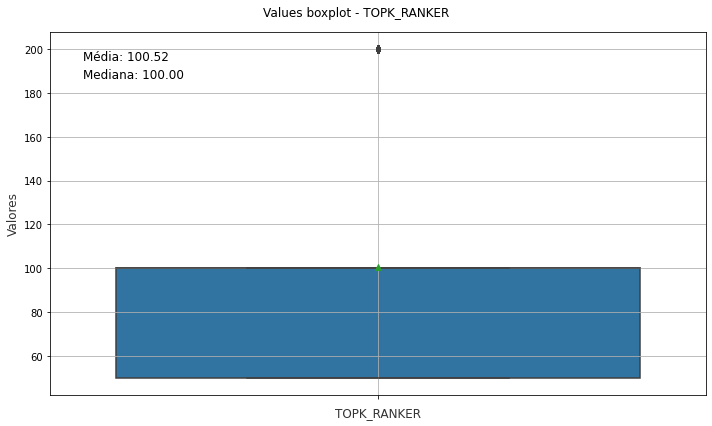

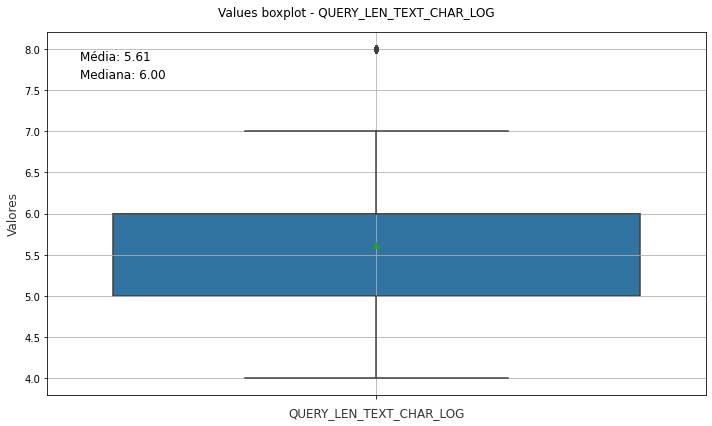

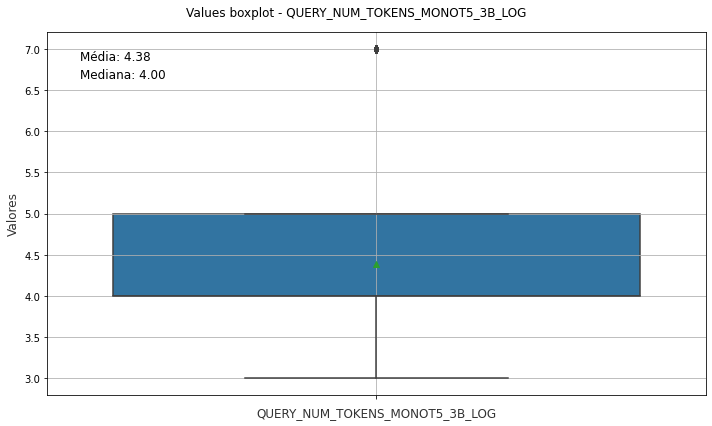

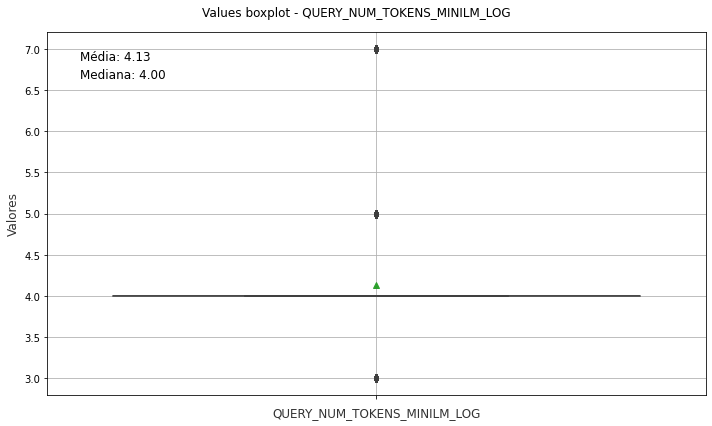

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,LIST_RANK,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
1144,6,24.0912,88.29,400,1,"[2, 4, 1, 6, 3]","[1292, 2556, 16283, 2182, 1291, 657, 3735, 16017, 5246, 15638, 316, 6814, 13...",sts,400,50,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,18371,"{2556: 'SUBTEMA', 2182: 'INDEXACAO_EXTRA', 331: 'AREA', 1292: 'TEMA', 657: '...","{'SUBTEMA': [2556], 'INDEXACAO_EXTRA': [2182, 657, 16283], 'AREA': [331], 'T...",NaN,Contrato administrativo,2556,185,5,25,52,42,4,4,5,83.33,monott5
1643,4,7.3449,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,50,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
1586,4,7.2750,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
4903,4,12.5678,80.48,200,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 1526, 2663, 301, 949, 950, ...",sts,200,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3877,4,21.1123,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1491, 2971, 14851, 41, 1565, 1563, 724,...",bm25,300,50,12,total_gte_5,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
4967,4,6.5354,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1935, 1526, 2663, 301, 949, 950, 14767, 312,...",sts,100,50,12,total_gte_5,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
4904,4,5.9648,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 2663, 301, 950, 14767, 312,...",sts,100,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3816,4,21.5211,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,...",bm25,300,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
3872,4,28.0676,80.48,400,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,..."

In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(370, 30)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


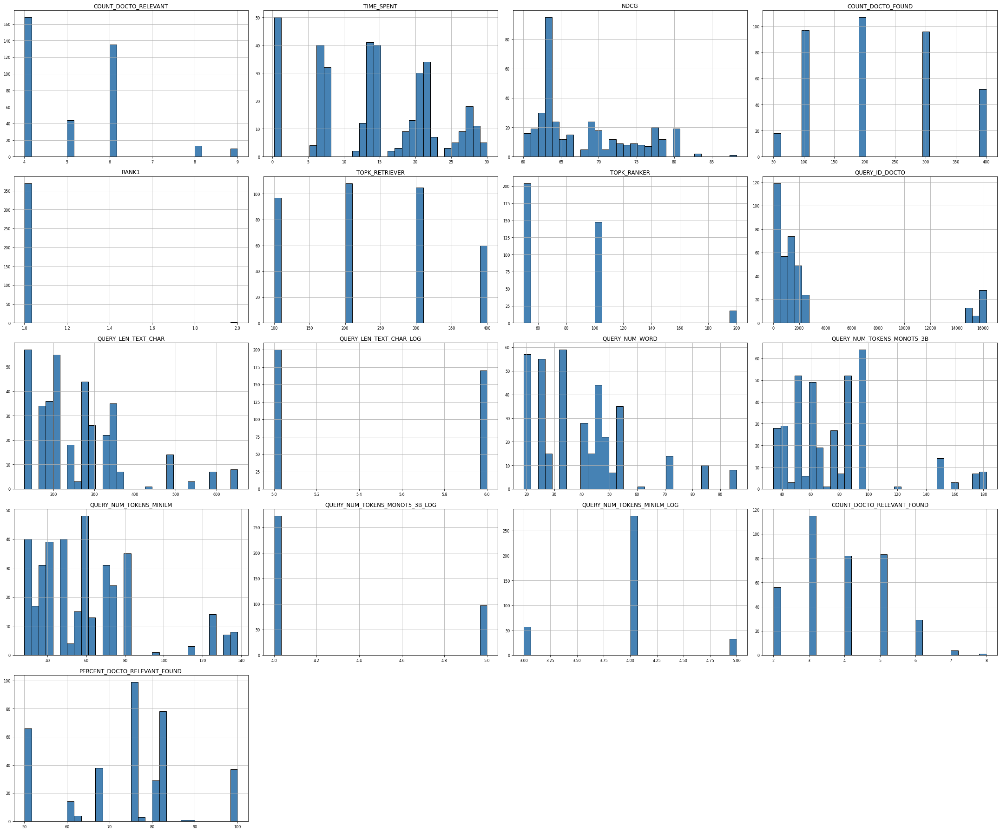

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

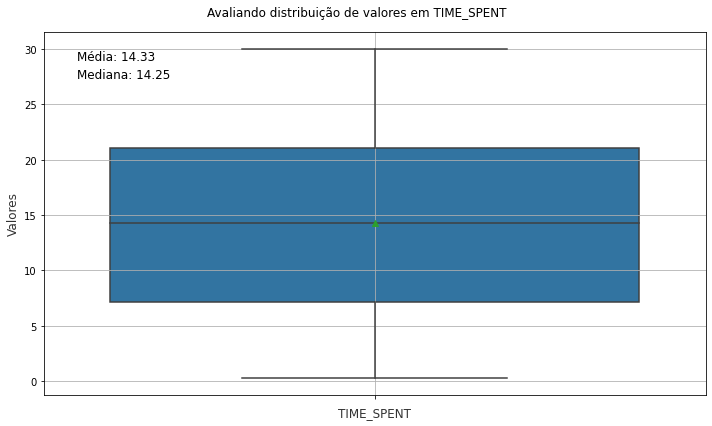

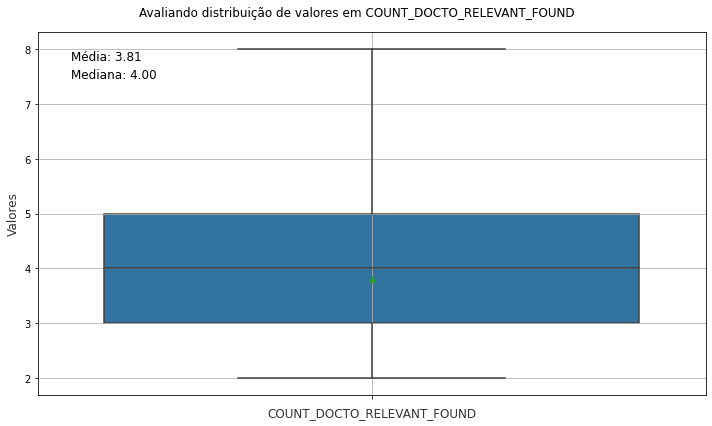

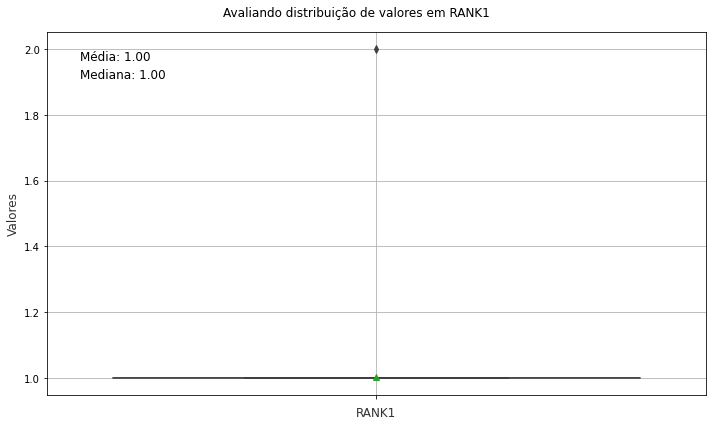

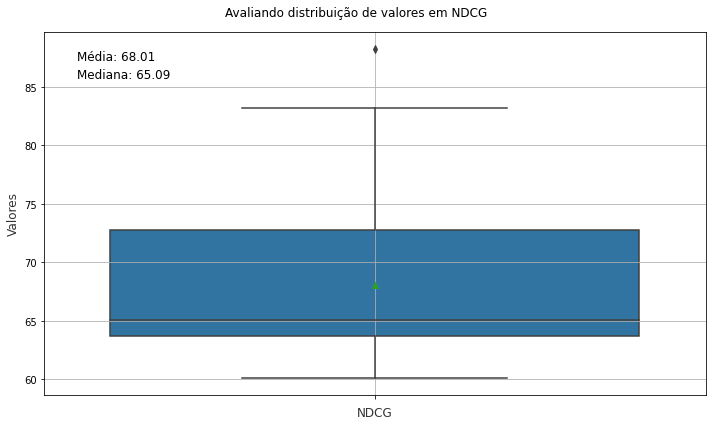

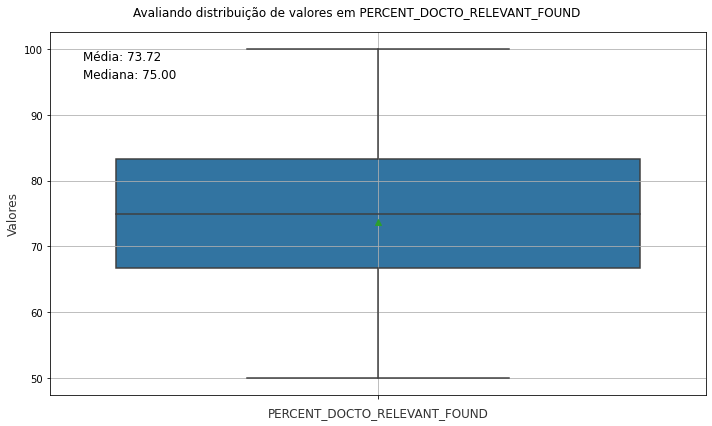

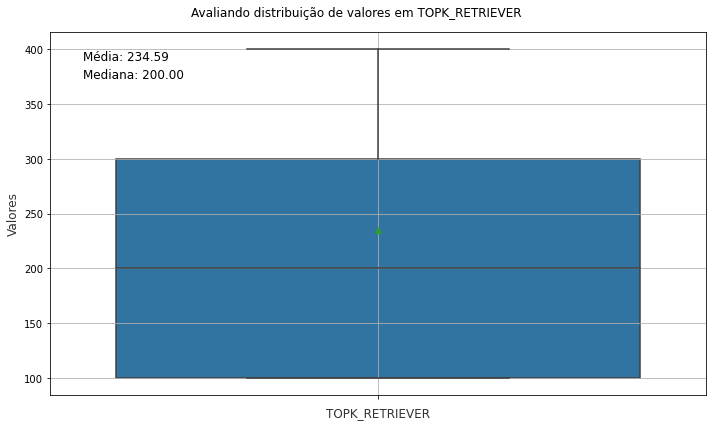

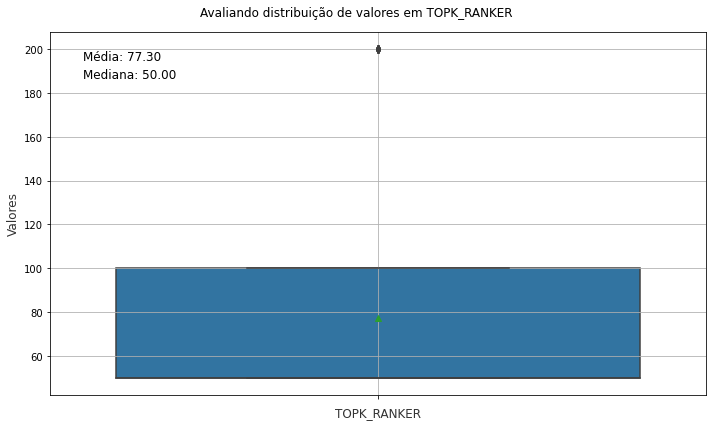

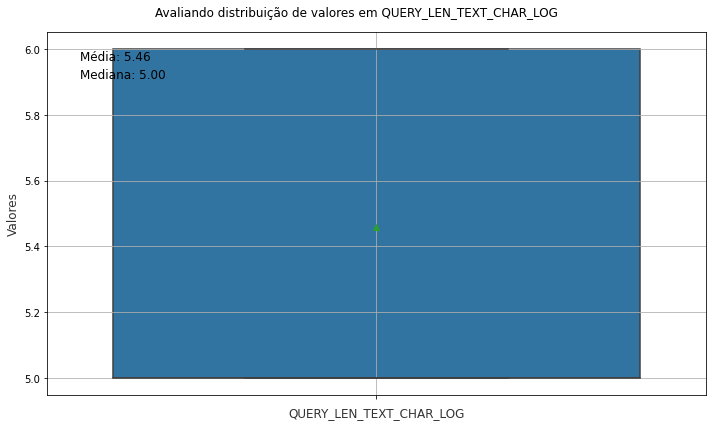

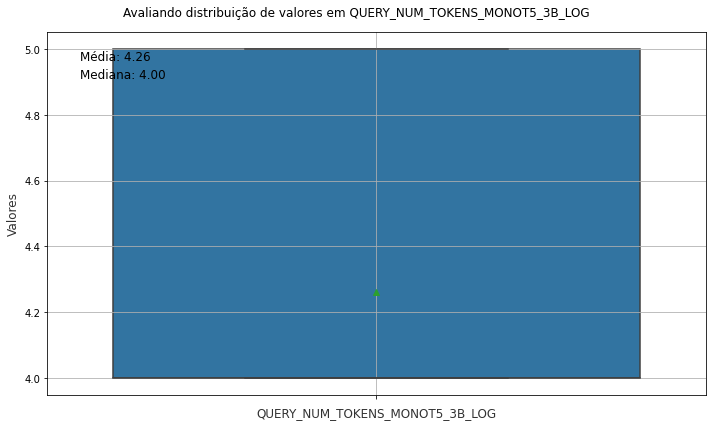

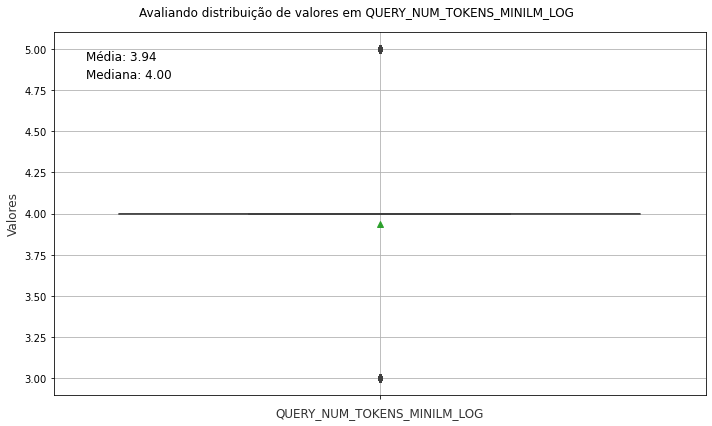

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


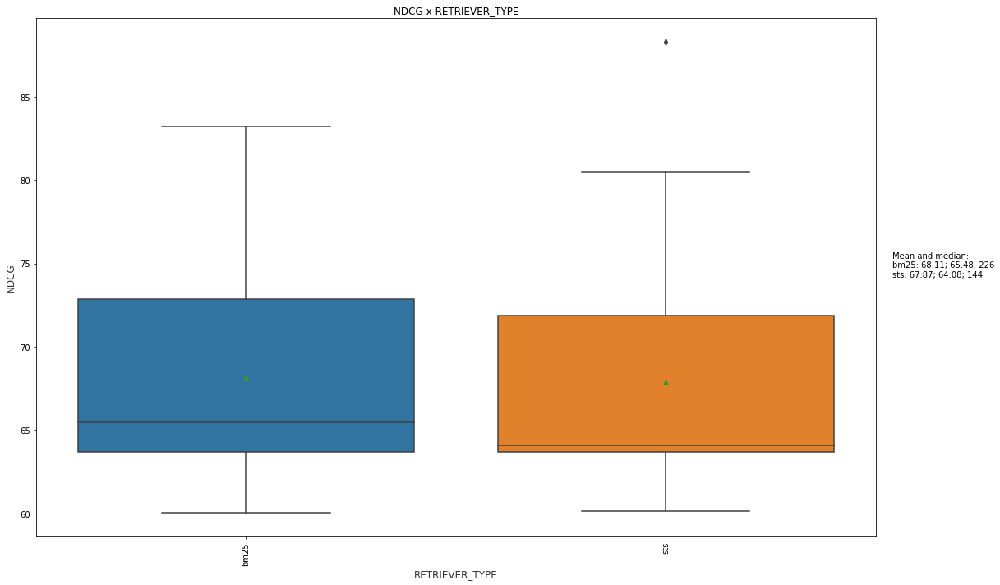

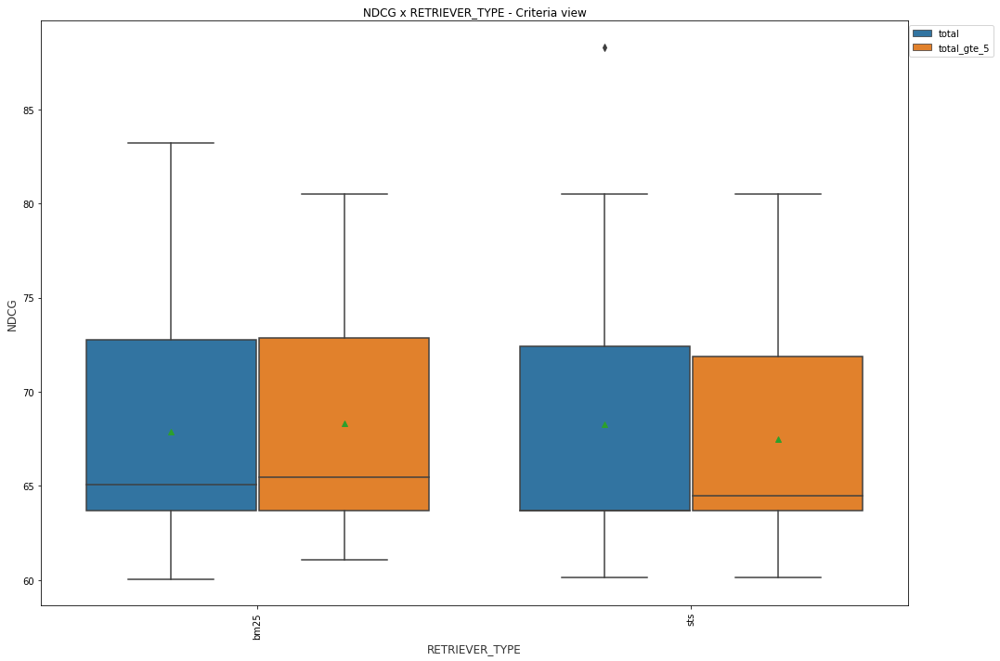

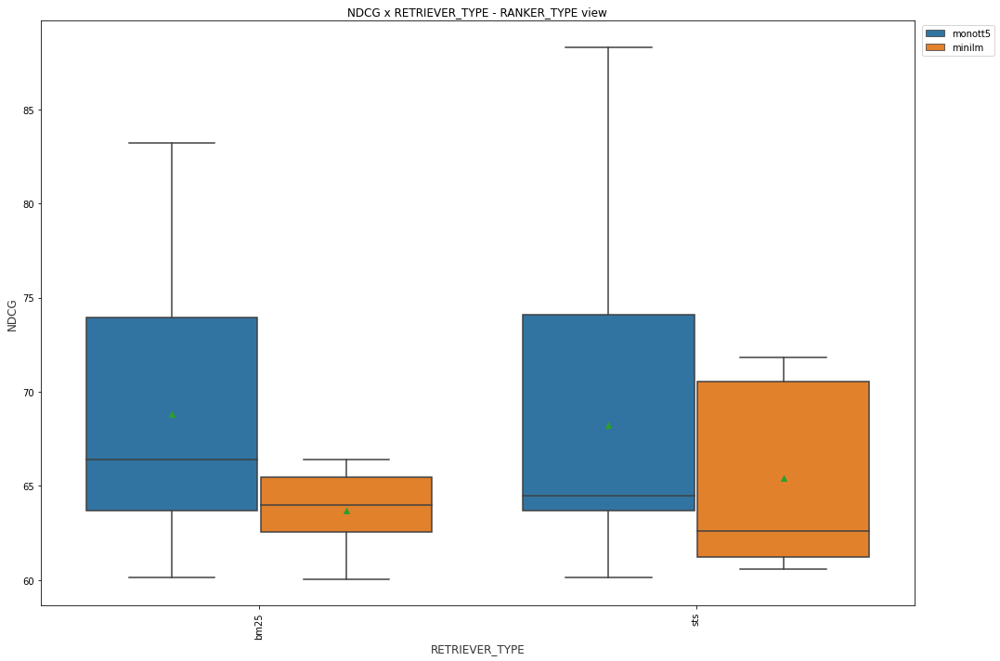

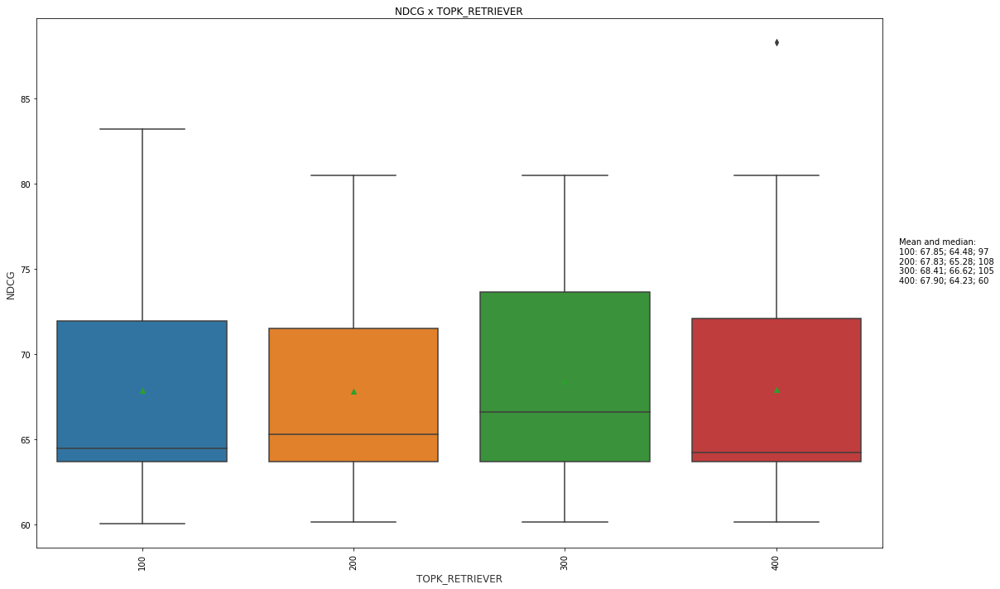

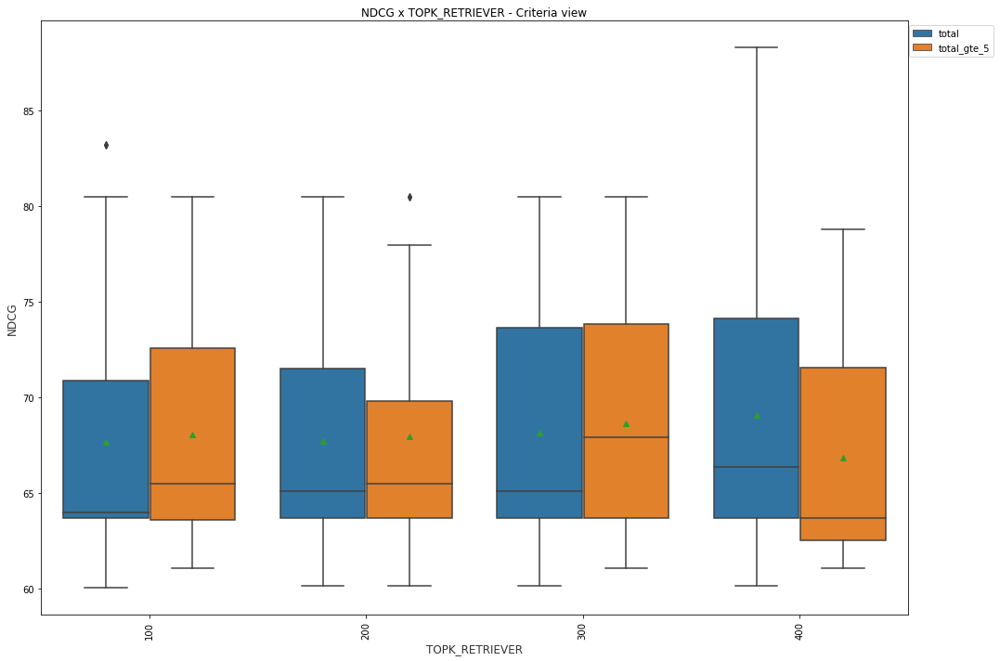

...

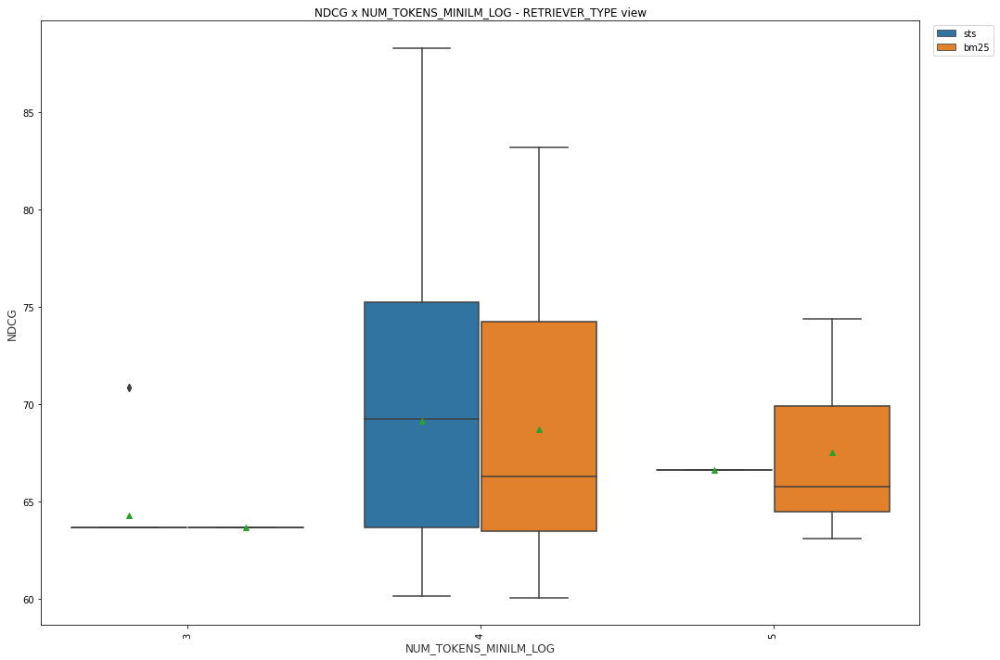

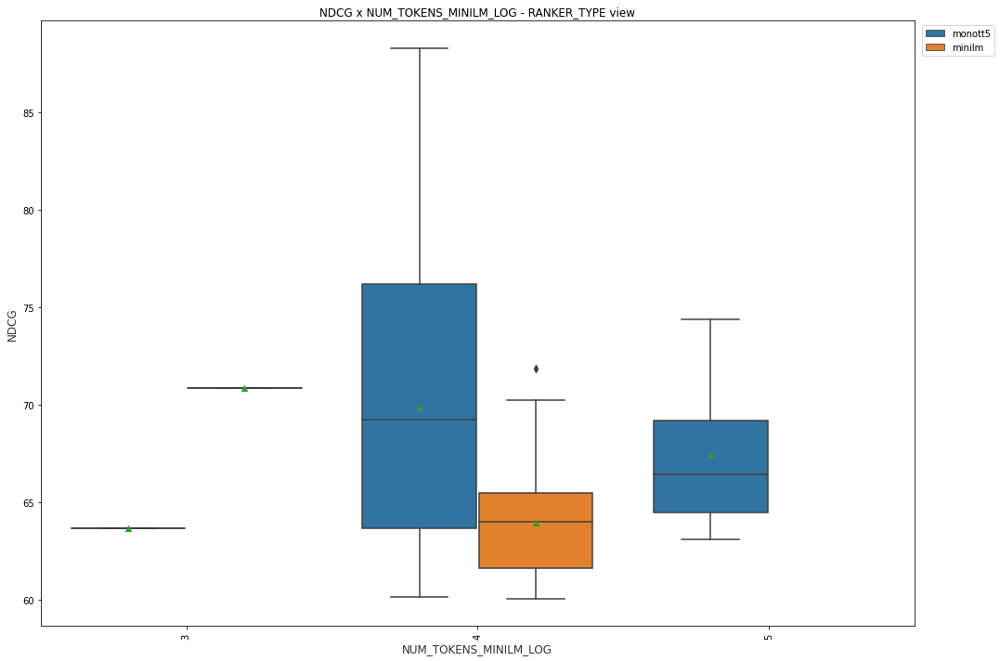

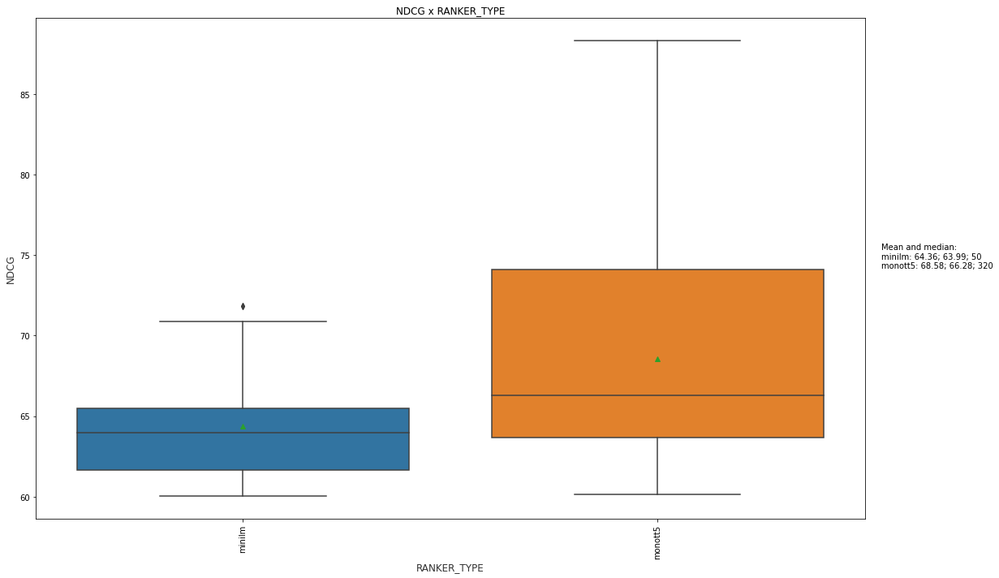

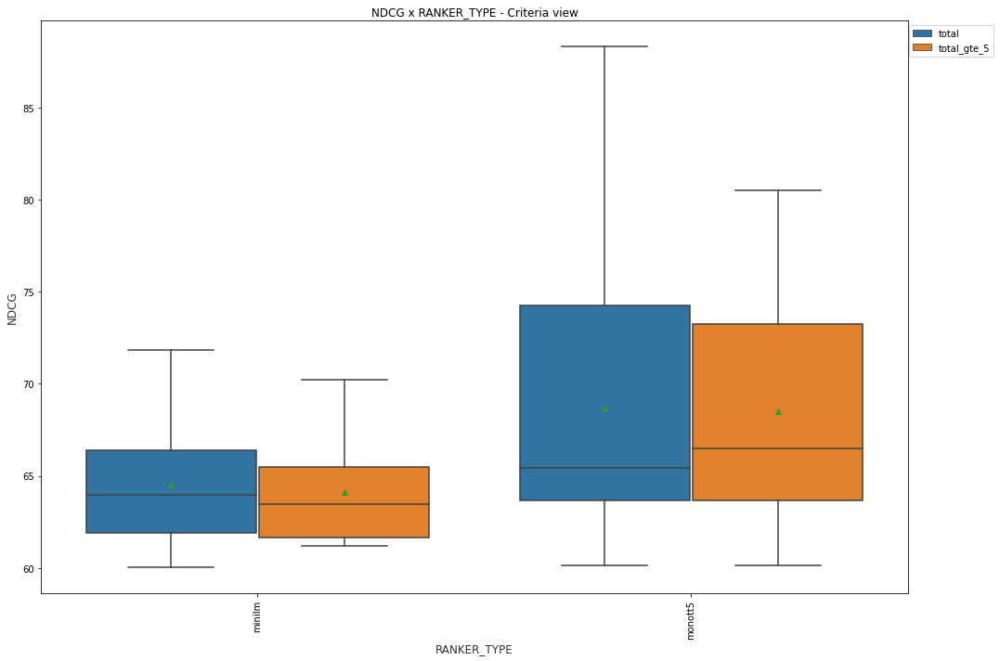

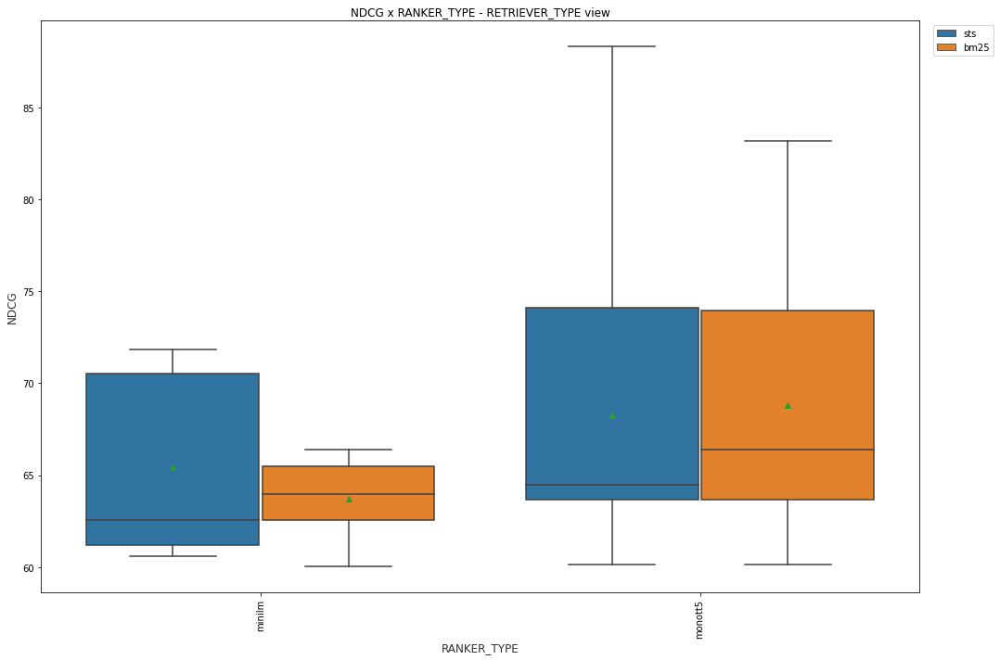

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Selected configuration

In [75]:
df_result.shape

(11482, 31)

In [42]:
# df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') & (df_result['TOPK_RANKER'] == 100)]
df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt')]

In [110]:
# df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RETRIEVER_TYPE']=='bm25') &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]
df_result = df_result[(df_result['TOPK_RETRIEVER'].isin([300,600])) & (df_result['COUNT_DOCTO_FOUND']!=10) & (df_result['RANKER_TYPE'].isin(['monot5', 'none']))] #  &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]

In [101]:
# df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RETRIEVER_TYPE']=='bm25') &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]
df_result = df_result[(df_result['TOPK_RETRIEVER'].isin([300])) & (df_result['RETRIEVER_TYPE']=='join_sts_bm25') & (df_result['COUNT_DOCTO_FOUND']!=10) & (df_result['RANKER_TYPE'].isin(['monot5']))] #  &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]

In [42]:
# df_result = df_result[df_result['RETRIEVER_TYPE']== 'join_sts_bm25']

In [109]:
df_result['RETRIEVER_TYPE'].unique()

array(['bm25', 'sts', 'sts_multihop', 'join_sts_multihop_bm25',
       'join_sts_bm25'], dtype=object)

In [77]:
df_result.shape

(349, 31)

## Separate found x not found

In [89]:
df_not_found = df_result[df_result['RANK1']==0]

In [90]:
df_not_found.shape

(0, 31)

In [91]:
df_result = df_result[df_result['RANK1']>0]

In [92]:
df_result.shape

(349, 31)

In [93]:
del df_not_found['RANK1']

## Some consolidated data

In [94]:
df_result.groupby(['TOPK_RETRIEVER','RANKER_TYPE','RETRIEVER_TYPE','CRITERIA']).agg(dict_metrics)

RANK1                    \
                                                   count       mean median   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                           
300            monot5      join_sts_bm25  extra       83  16.192771    4.0   
                                          subtheme    71  19.380282    4.0   
                                          theme       96  21.031250    2.0   
                                          total       99   4.838384    1.0   

                                                    NDCG                    \
                                                   count       mean median   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                           
300            monot5      join_sts_bm25  extra       83  30.901687  26.41   
                                          subtheme    71  49.540563  43.07   
                                          theme       96  54.473229  63.09   
                                          total       99  37.072323  39.37   

                                                   PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                          count   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                                
300            monot5      join_sts_bm25  extra                              83   
                                          subtheme                           71   
                                          theme                              96   
                                          total                              99   

                                                                        
                                                          mean  median  
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                      
300            monot5      join_sts_bm25  extra      69.592892   66.67  
                                          subtheme  100.000000  100.00  
                                          theme     100.000000  100.00  
                                          total      61.263131   62.50

In [96]:
df_result.groupby(['CRITERIA']).count()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
CRITERIA,,,,,,,,,,,,,,,,,,,,,
extra,83,83,83,83,83,83,83,83,83,83,...,83,83,83,83,83,83,83,83,83,83
subtheme,71,71,71,71,71,71,71,71,71,71,...,71,71,71,71,71,71,71,71,71,71
theme,96,96,96,96,96,96,96,96,96,96,...,96,96,96,96,96,96,96,96,96,96
total,99,99,99,99,99,99,99,99,99,99,...,99,99,99,99,99,99,99,99,99,99


In [86]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                    NDCG             \
                                    count       mean median count       mean   
CRITERIA RANKER_TYPE RETRIEVER_TYPE                                            
extra    monot5      join_sts_bm25     83  16.192771    4.0    83  30.901687   
subtheme monot5      join_sts_bm25     71  19.380282    4.0    71  49.540563   
theme    monot5      join_sts_bm25     96  21.031250    2.0    96  54.473229   
total    monot5      join_sts_bm25     99   4.838384    1.0    99  37.072323   

                                           PERCENT_DOCTO_RELEVANT_FOUND  \
                                    median                        count   
CRITERIA RANKER_TYPE RETRIEVER_TYPE                                       
extra    monot5      join_sts_bm25   26.41                           83   
subtheme monot5      join_sts_bm25   43.07                           71   
theme    monot5      join_sts_bm25   63.09                           96   
total    monot5      join_sts_bm25   39.37                           99   

                                                         
                                           mean  median  
CRITERIA RANKER_TYPE RETRIEVER_TYPE                      
extra    monot5      join_sts_bm25    69.592892   66.67  
subtheme monot5      join_sts_bm25   100.000000  100.00  
theme    monot5      join_sts_bm25   100.000000  100.00  
total    monot5      join_sts_bm25    61.263131   62.50

In [87]:
df_result.groupby([ 'RANKER_TYPE', 'CRITERIA', 'RETRIEVER_TYPE', 'TOPK_RETRIEVER']).agg({'TIME_SPENT':['count', 'mean', 'median'], 'COUNT_DOCTO_FOUND':['count', 'mean', 'median']})

TIME_SPENT             \
                                                        count       mean   
RANKER_TYPE CRITERIA RETRIEVER_TYPE TOPK_RETRIEVER                         
monot5      extra    join_sts_bm25  300                    83  18.230335   
            subtheme join_sts_bm25  300                    71  16.745003   
            theme    join_sts_bm25  300                    96  15.197249   
            total    join_sts_bm25  300                    99  18.276040   

                                                            COUNT_DOCTO_FOUND  \
                                                     median             count   
RANKER_TYPE CRITERIA RETRIEVER_TYPE TOPK_RETRIEVER                              
monot5      extra    join_sts_bm25  300             18.2817                83   
            subtheme join_sts_bm25  300             16.6897                71   
            theme    join_sts_bm25  300             15.1599                96   
            total    join_sts_bm25  300             18.3437                99   

                                                                       
                                                          mean median  
RANKER_TYPE CRITERIA RETRIEVER_TYPE TOPK_RETRIEVER                     
monot5      extra    join_sts_bm25  300             262.566265  263.0  
            subtheme join_sts_bm25  300             242.633803  242.0  
            theme    join_sts_bm25  300             217.677083  217.0  
            total    join_sts_bm25  300             261.959596  263.0

In [56]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                     NDCG             \
                                    count        mean median count       mean   
CRITERIA RANKER_TYPE RETRIEVER_TYPE                                             
extra    monot5      join_sts_bm25    173   25.150289    4.0   173  30.047688   
         none        join_sts_bm25    173   91.745665   58.0   173   9.176647   
subtheme monot5      join_sts_bm25    152   32.750000    6.0   152  45.564145   
         none        join_sts_bm25    152  103.052632   77.0   152  10.865921   
theme    monot5      join_sts_bm25    196   26.683673    3.0   196  52.785663   
         none        join_sts_bm25    196   55.566327   34.5   196  14.764541   
total    monot5      join_sts_bm25    199    7.487437    1.0   199  36.720754   
         none        join_sts_bm25    199   48.211055   22.0   199   8.399397   

                                           PERCENT_DOCTO_RELEVANT_FOUND  \
                                    median                        count   
CRITERIA RANKER_TYPE RETRIEVER_TYPE                                       
extra    monot5      join_sts_bm25   26.41                          173   
         none        join_sts_bm25    0.00                          173   
subtheme monot5      join_sts_bm25   35.62                          152   
         none        join_sts_bm25    0.00                          152   
theme    monot5      join_sts_bm25   50.00                          196   
         none        join_sts_bm25    0.00                          196   
total    monot5      join_sts_bm25   39.04                          199   
         none        join_sts_bm25    0.00                          199   

                                                         
                                           mean  median  
CRITERIA RANKER_TYPE RETRIEVER_TYPE                      
extra    monot5      join_sts_bm25    73.395491   75.00  
         none        join_sts_bm25    73.395491   75.00  
subtheme monot5      join_sts_bm25   100.000000  100.00  
         none        join_sts_bm25   100.000000  100.00  
theme    monot5      join_sts_bm25   100.000000  100.00  
         none        join_sts_bm25   100.000000  100.00  
total    monot5      join_sts_bm25    65.225578   66.67  
         none        join_sts_bm25    65.225578   66.67

In [57]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

Empty DataFrame
Columns: [(COUNT_DOCTO_RELEVANT, count), (COUNT_DOCTO_RELEVANT, mean), (COUNT_DOCTO_RELEVANT, median)]
Index: []

## Found x Not found

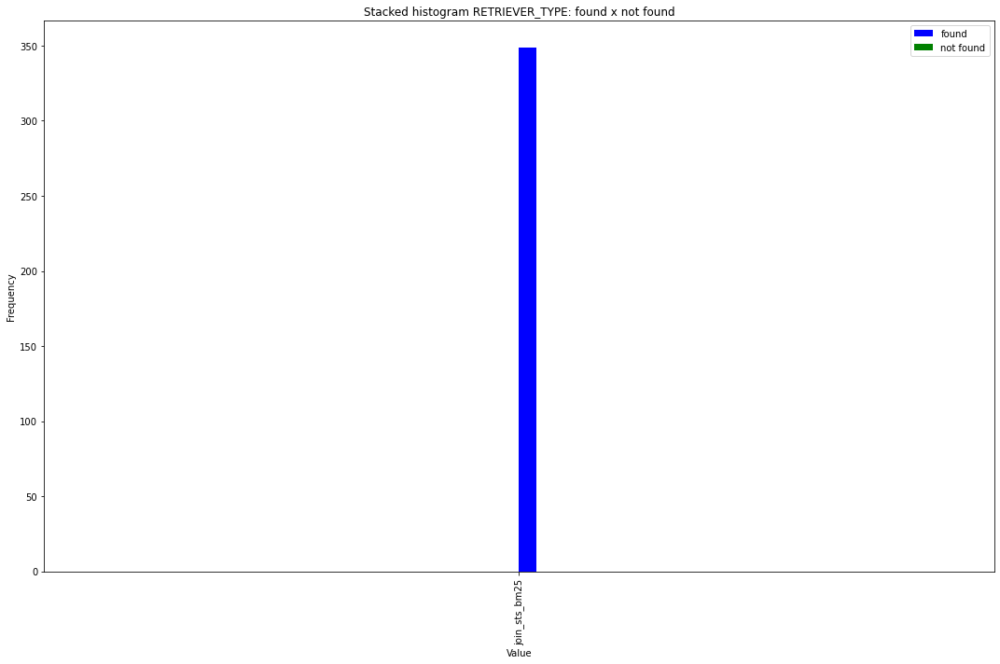

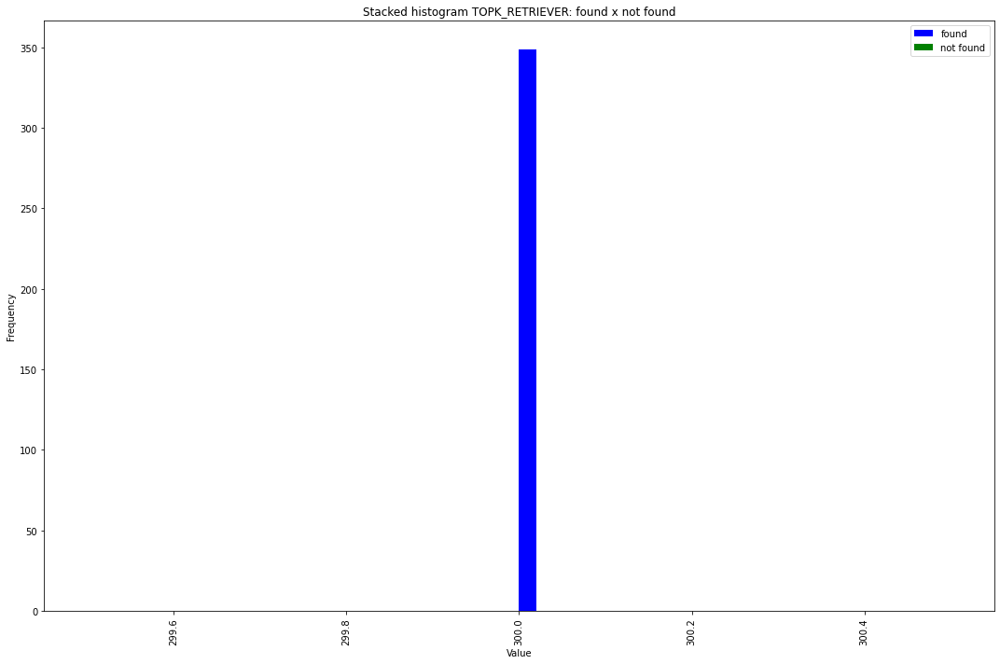

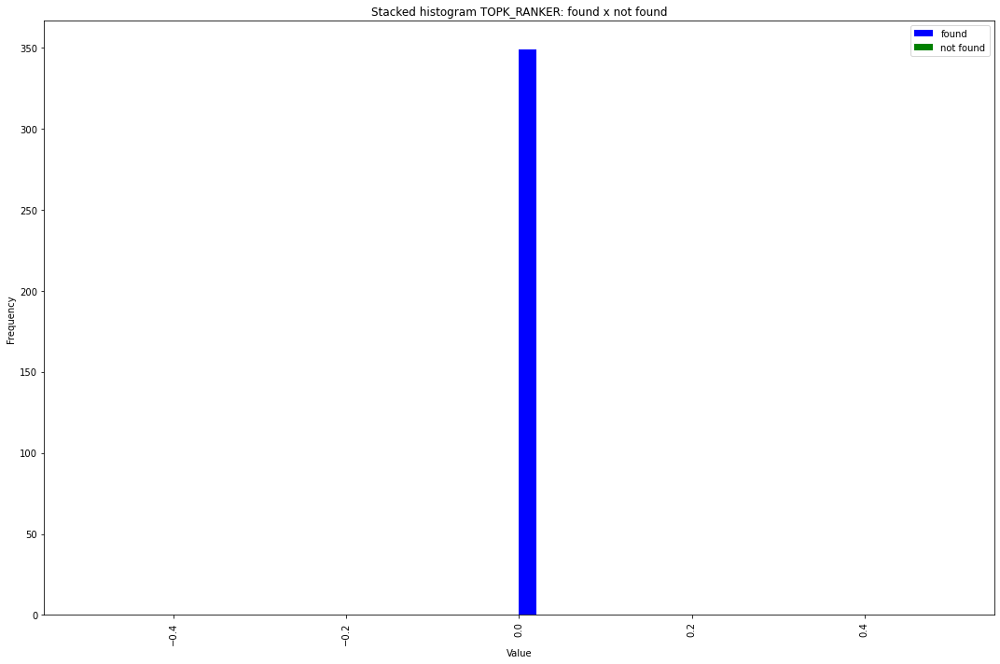

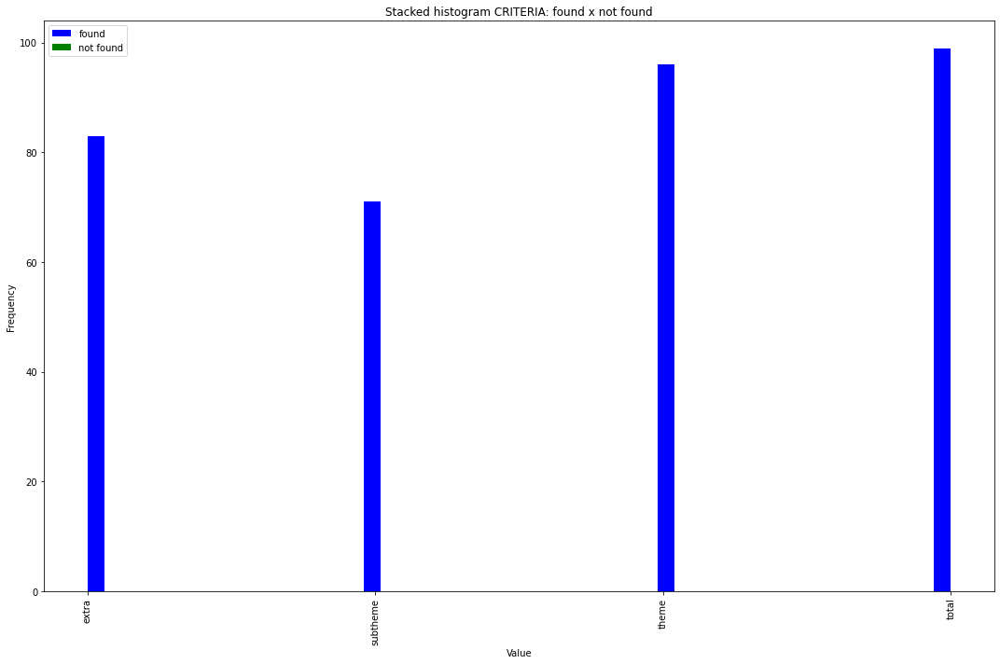

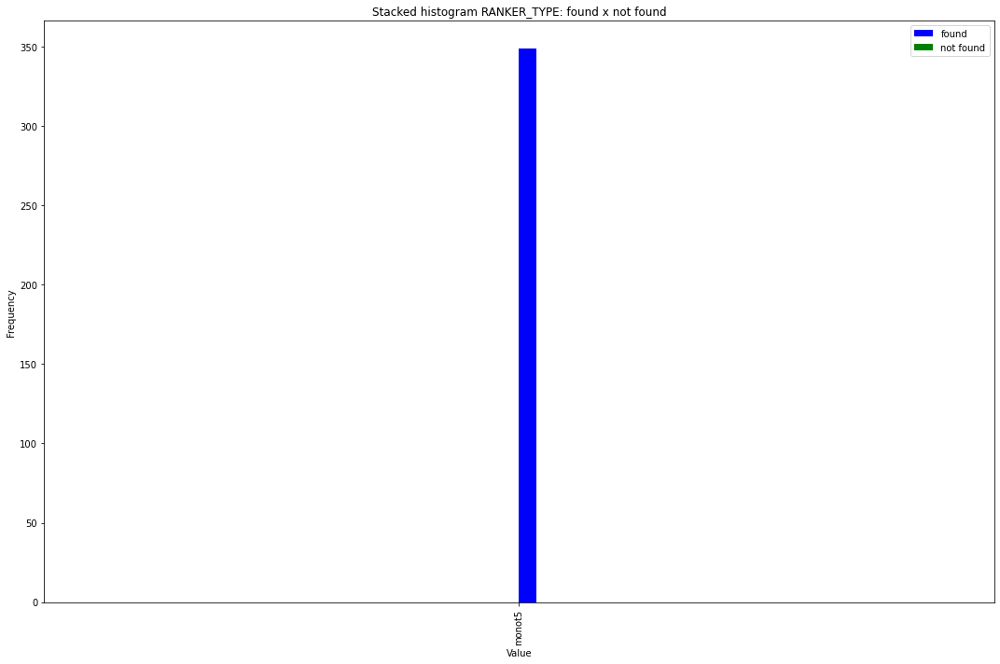

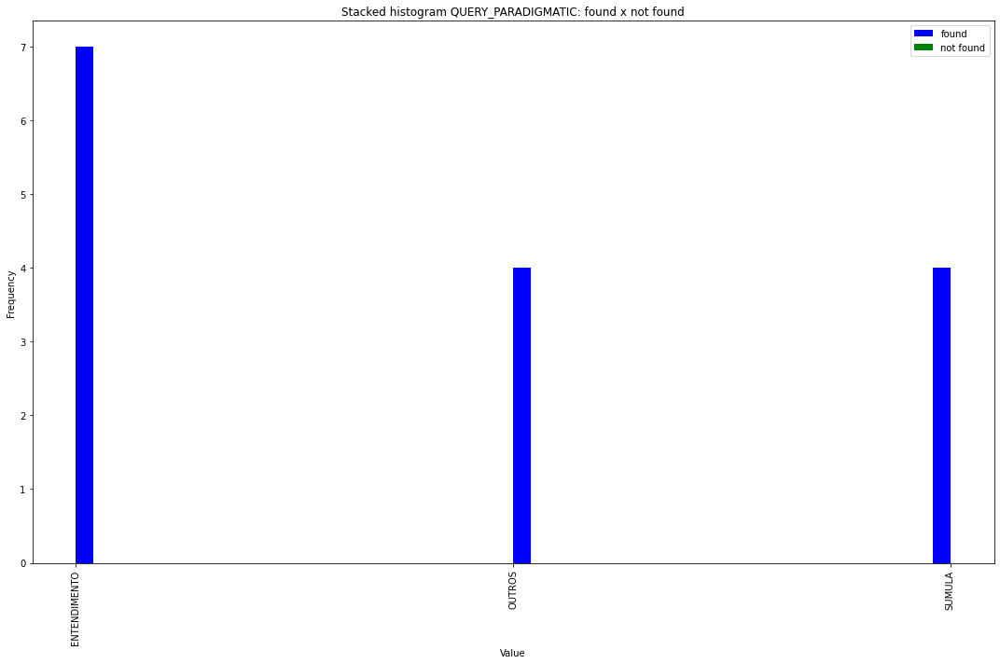

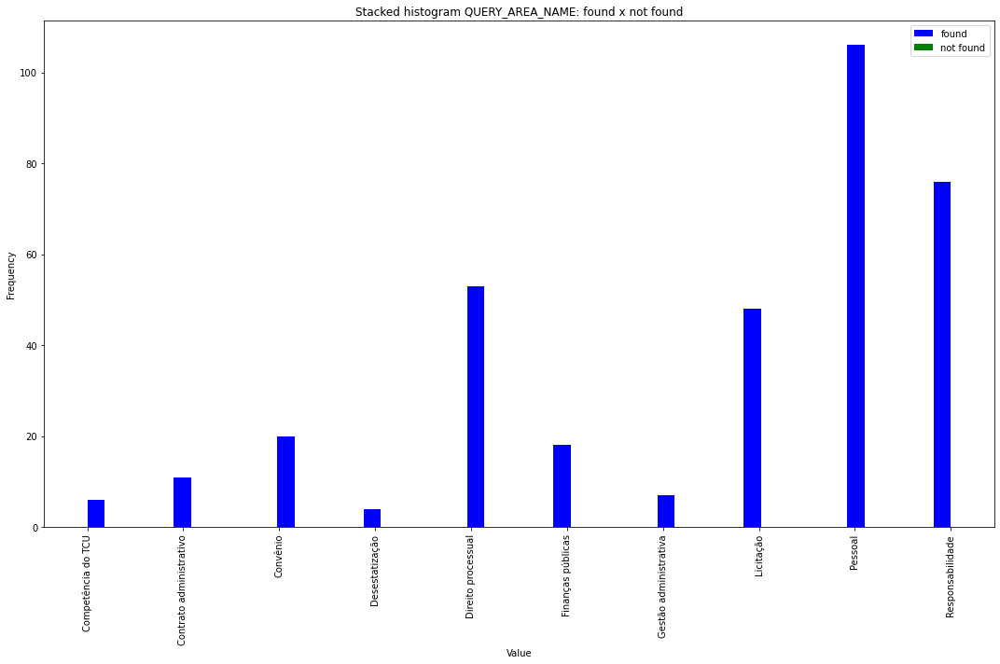

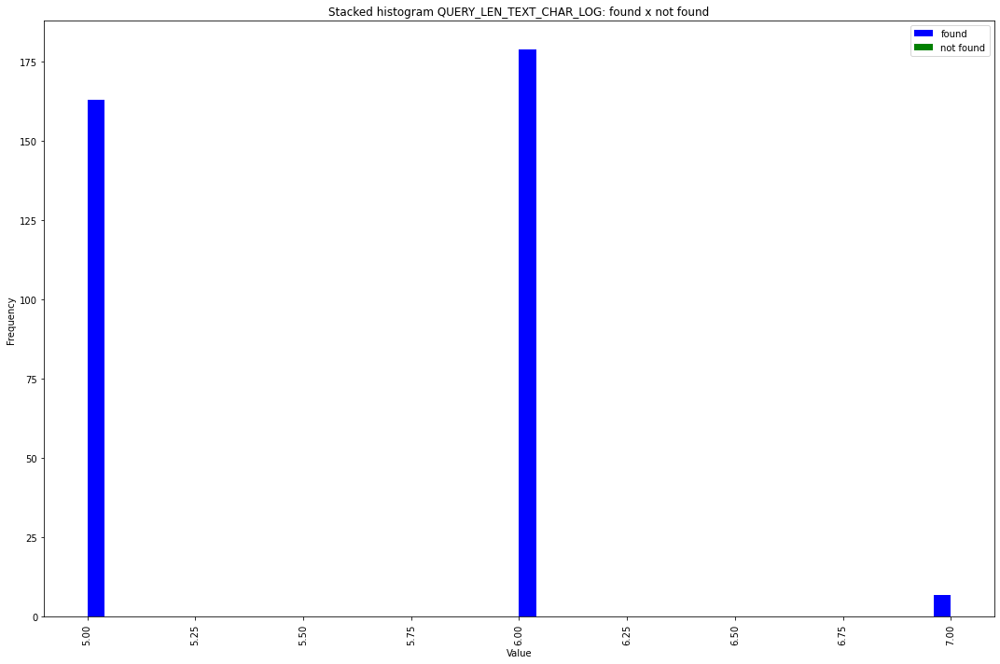

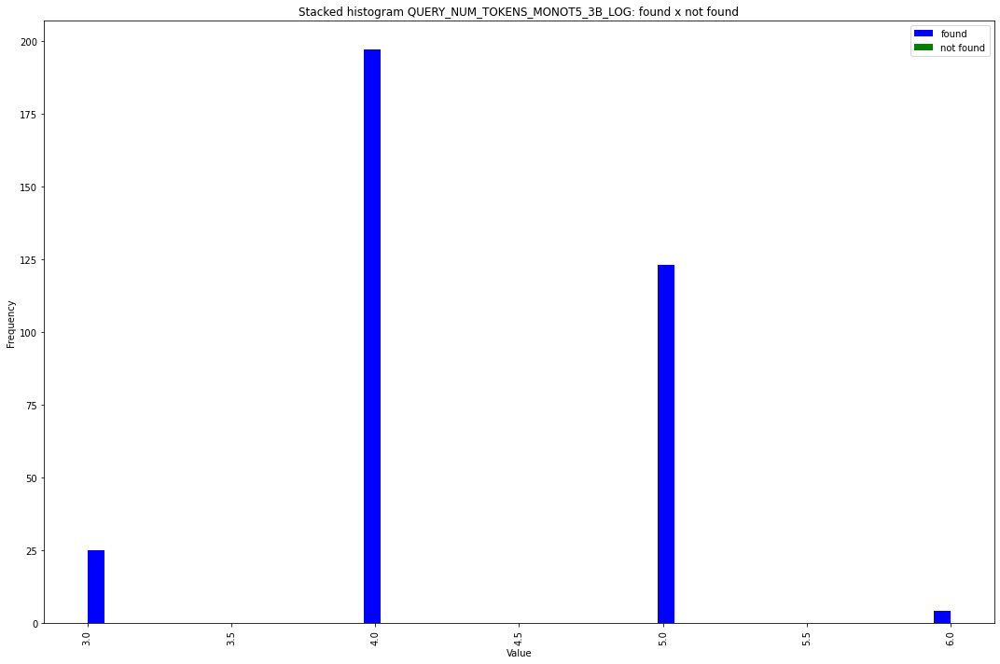

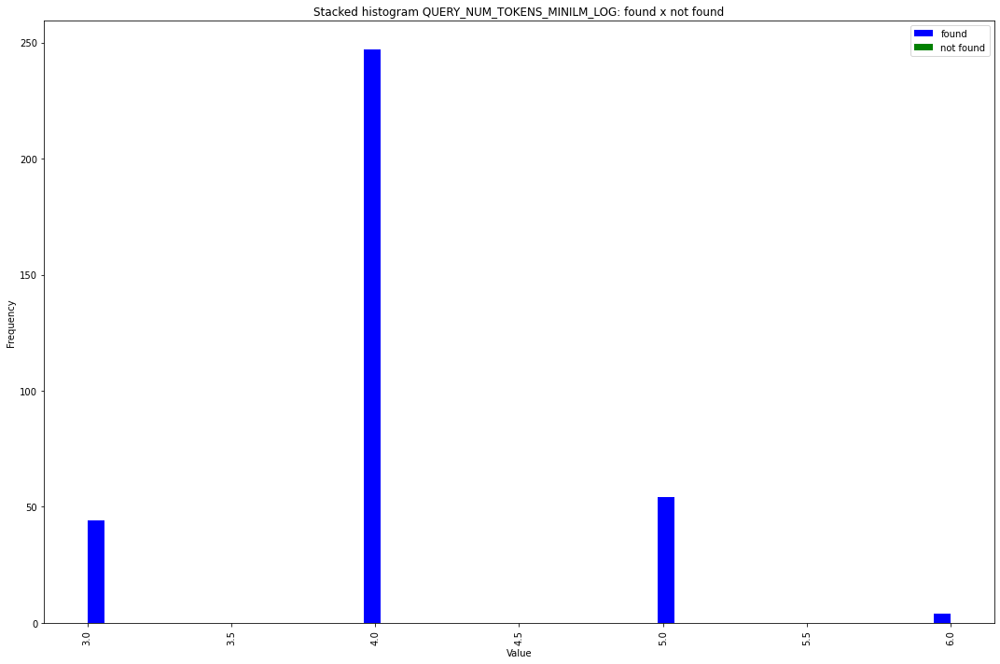

In [88]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

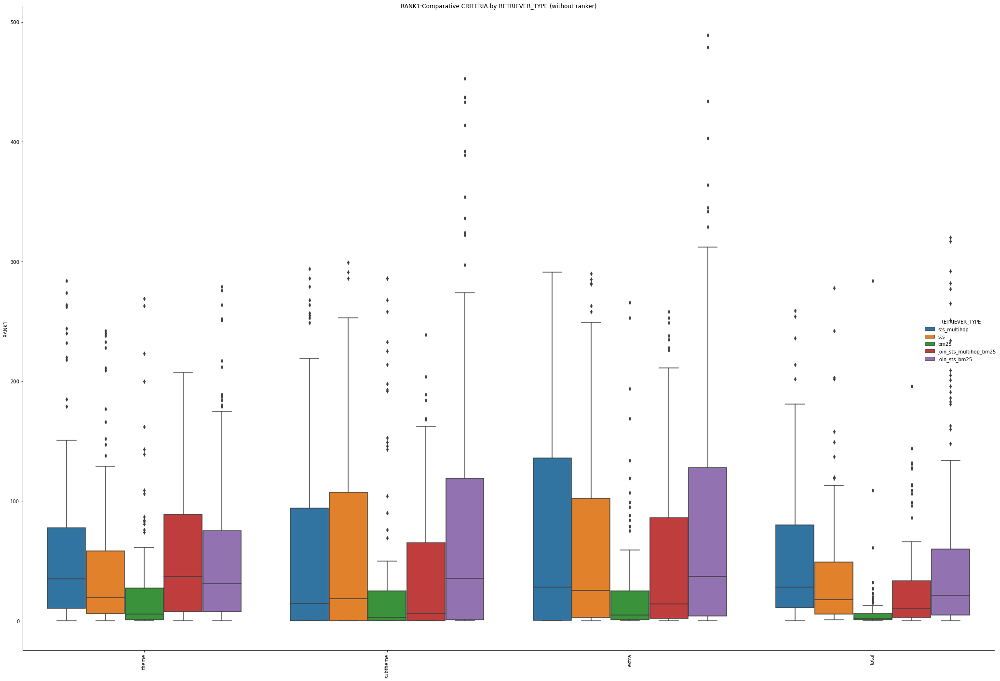

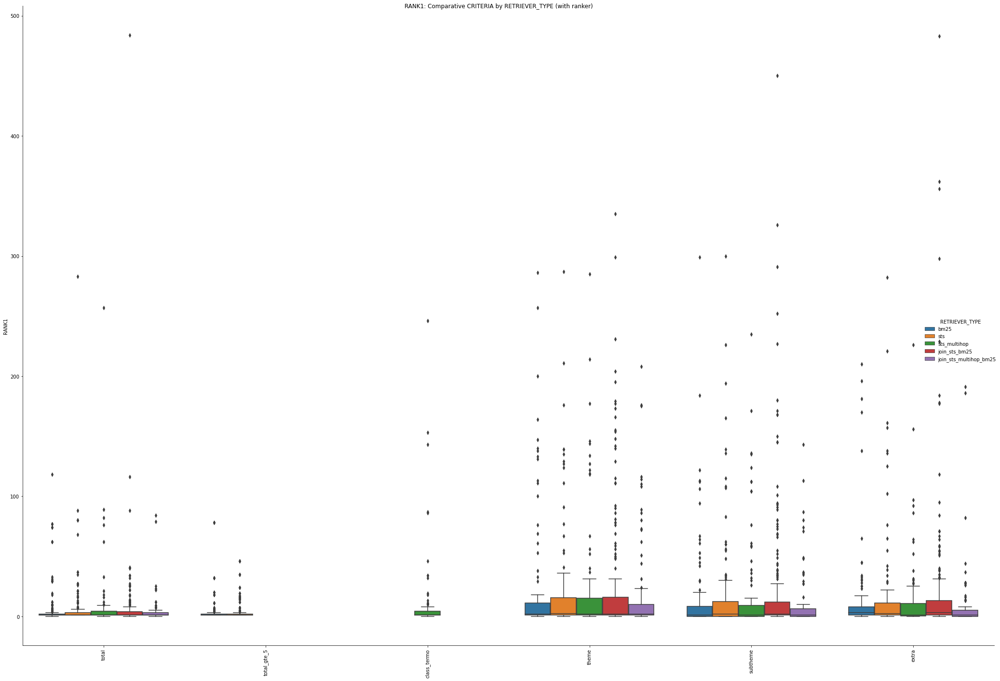

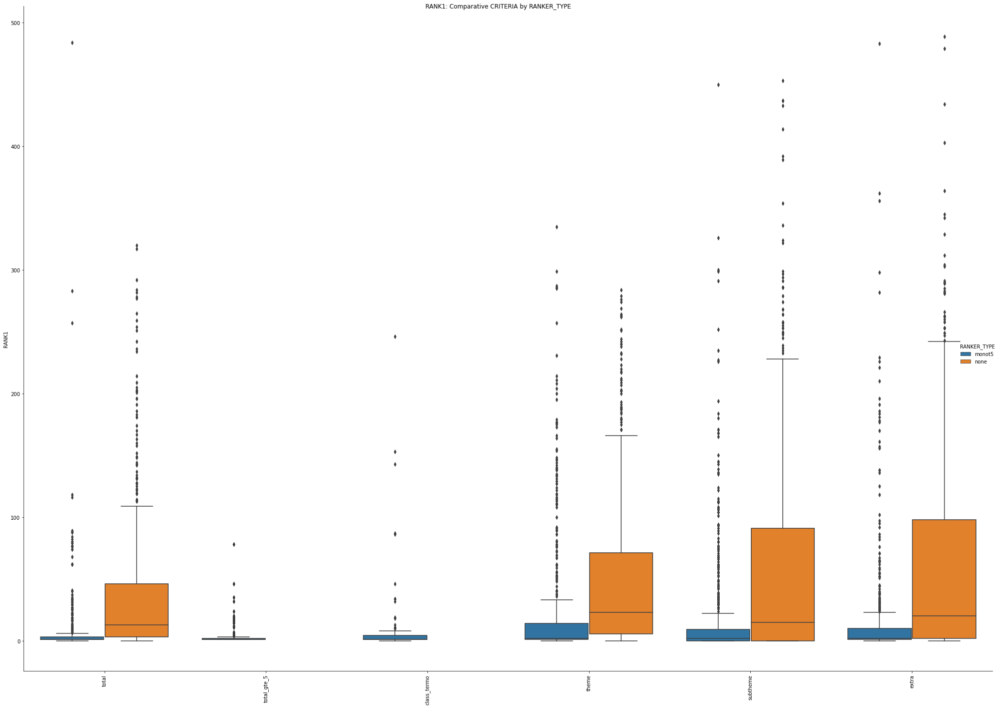

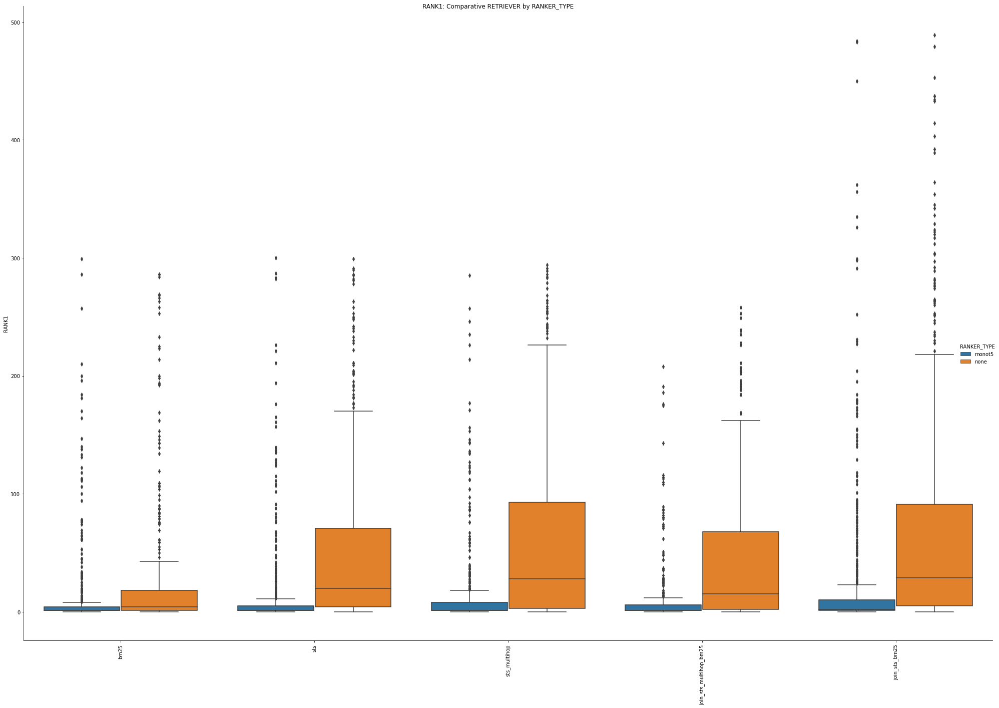

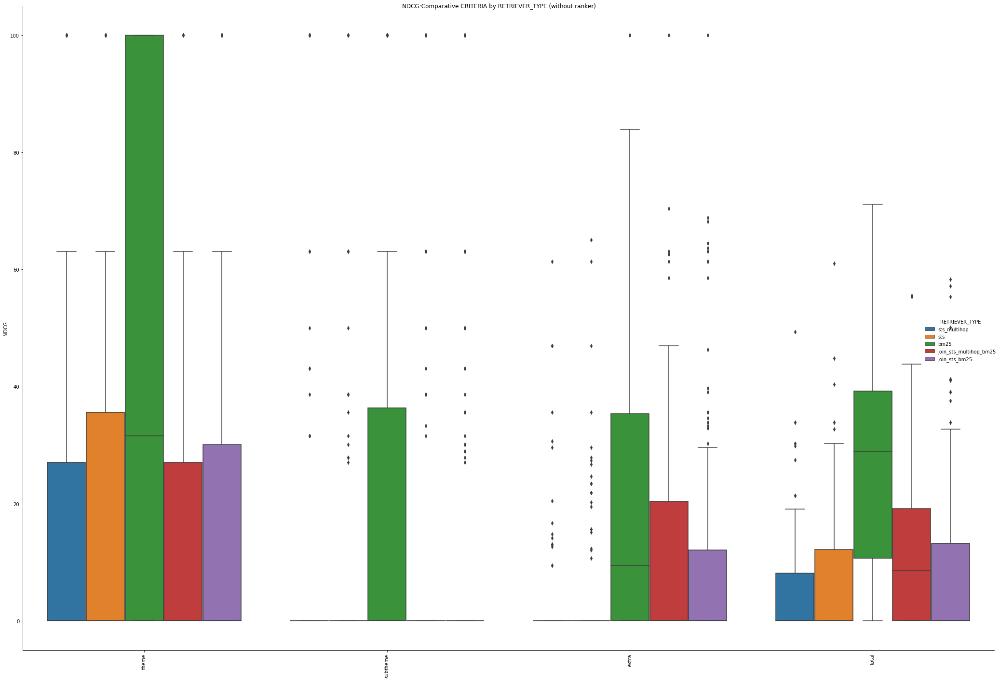

...

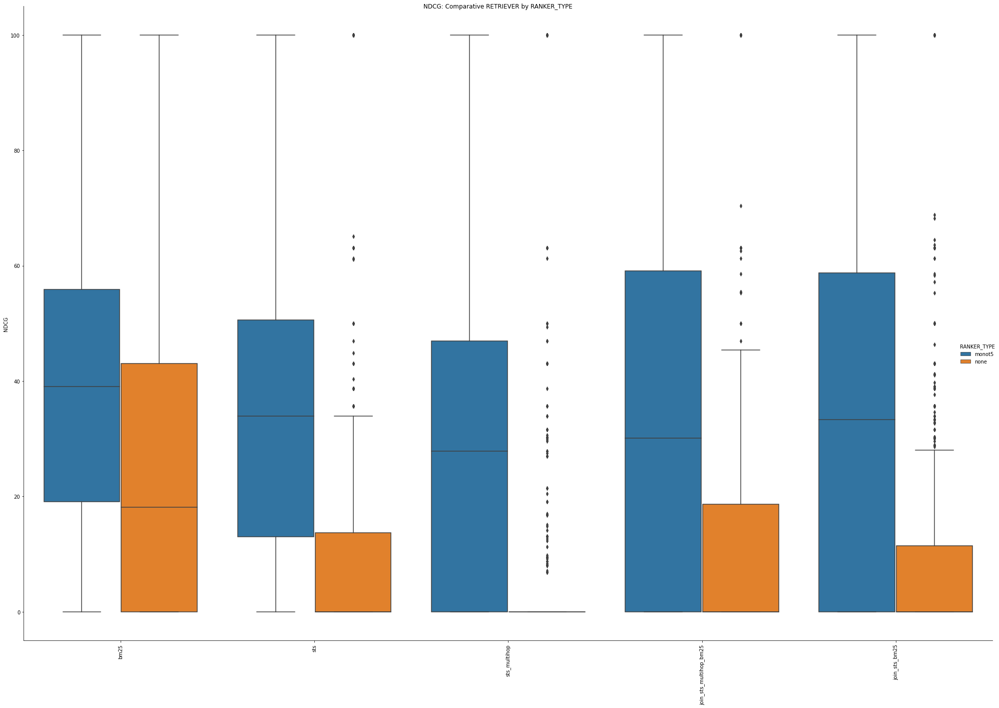

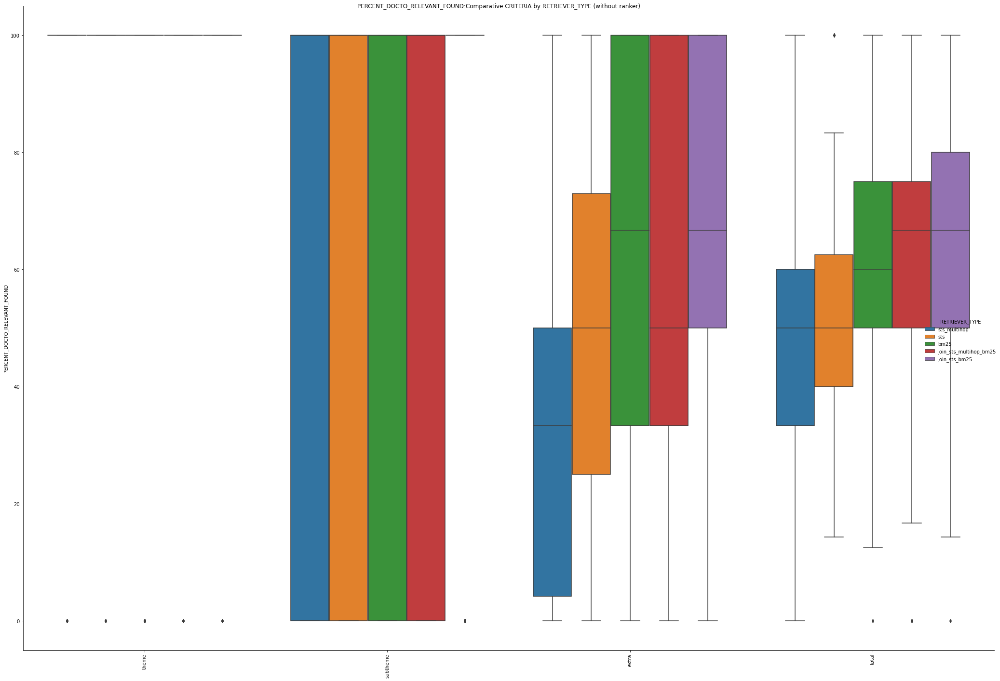

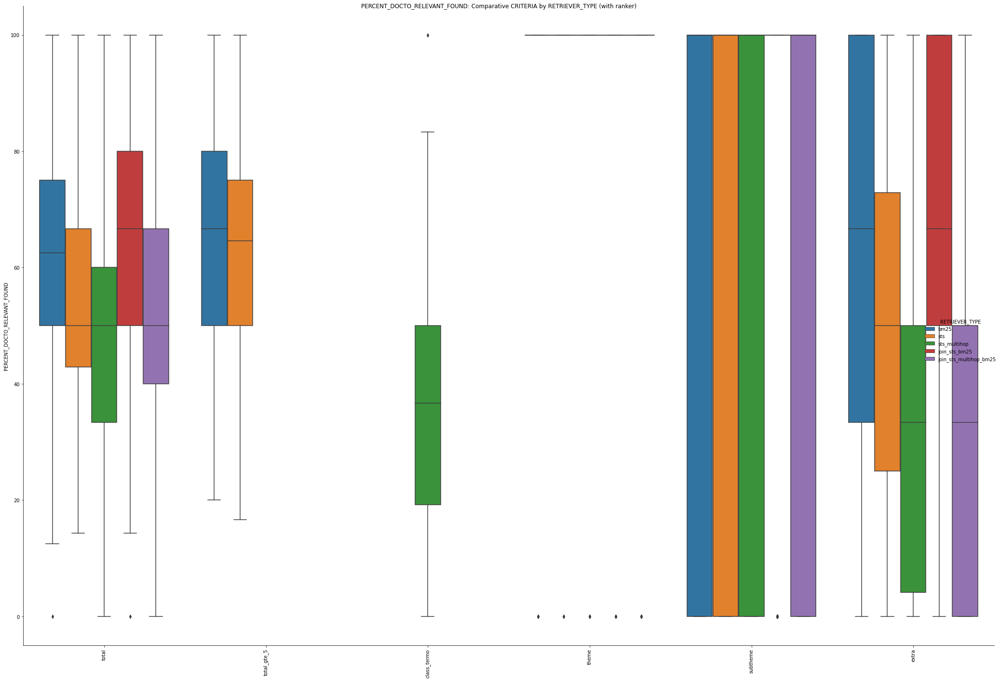

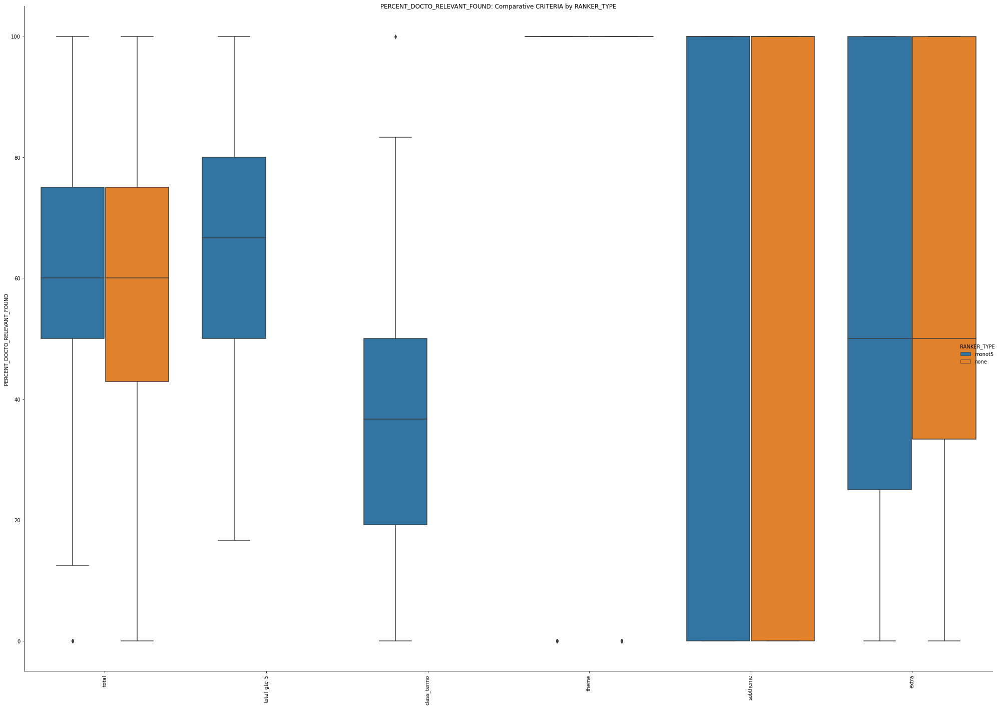

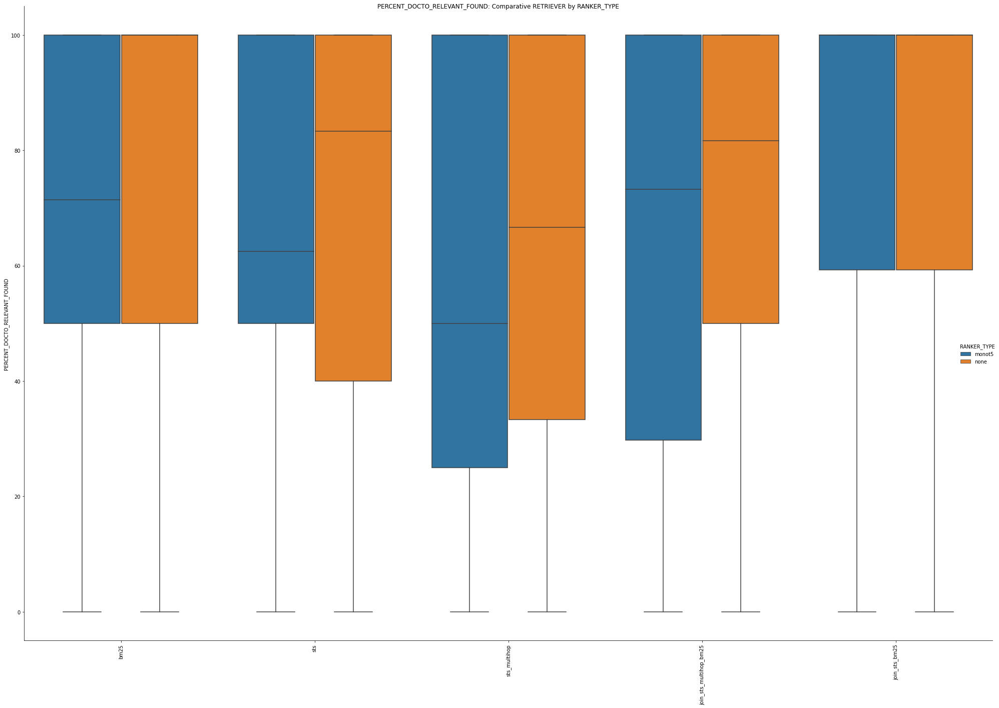

In [111]:
for metric in list_metric:
    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']=='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}:Comparative CRITERIA by RETRIEVER_TYPE (without ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER_TYPE",
                    kind="box", data=df_result[df_result['RANKER_TYPE']!='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RETRIEVER_TYPE (with ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()    

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()      

    g = sns.catplot(x="RETRIEVER_TYPE", sharex=True, y=metric, hue="RANKER_TYPE",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative RETRIEVER by RANKER_TYPE')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()        

        Conclusão:
        usar ranker
        join com bm25: 300 e sts:300  (topk_retriever=600)

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


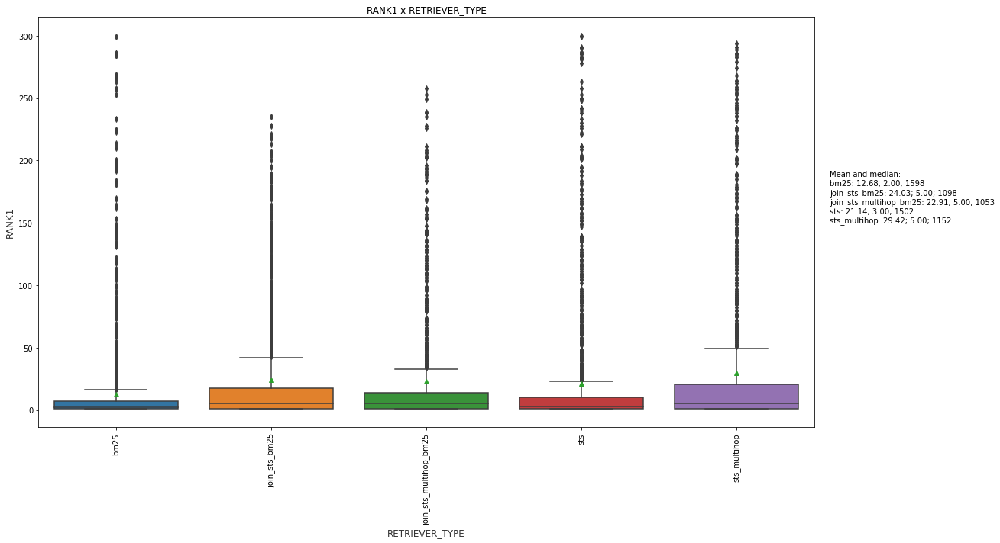

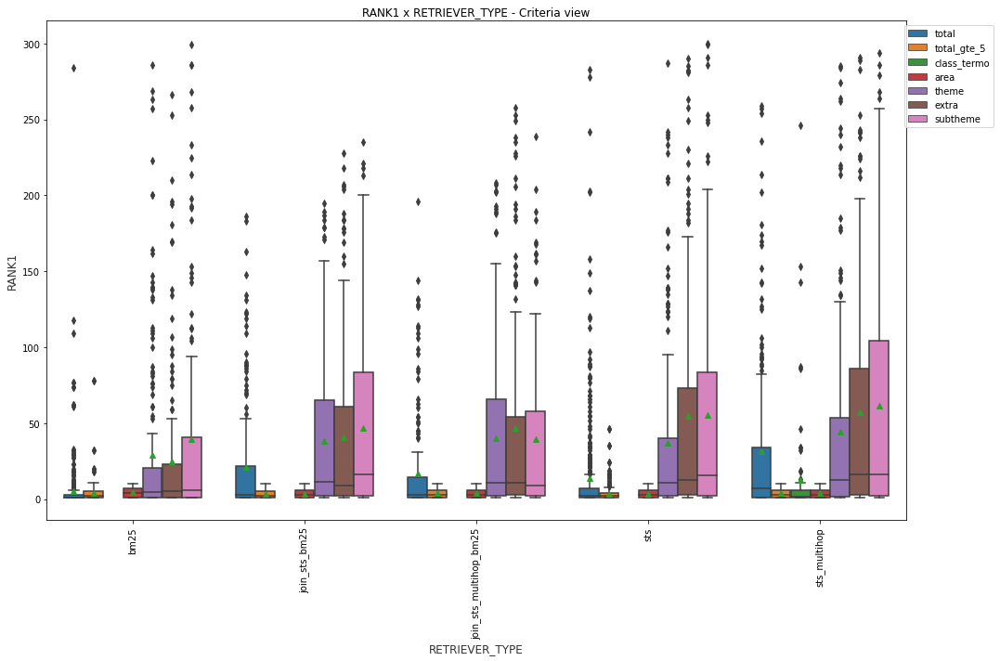

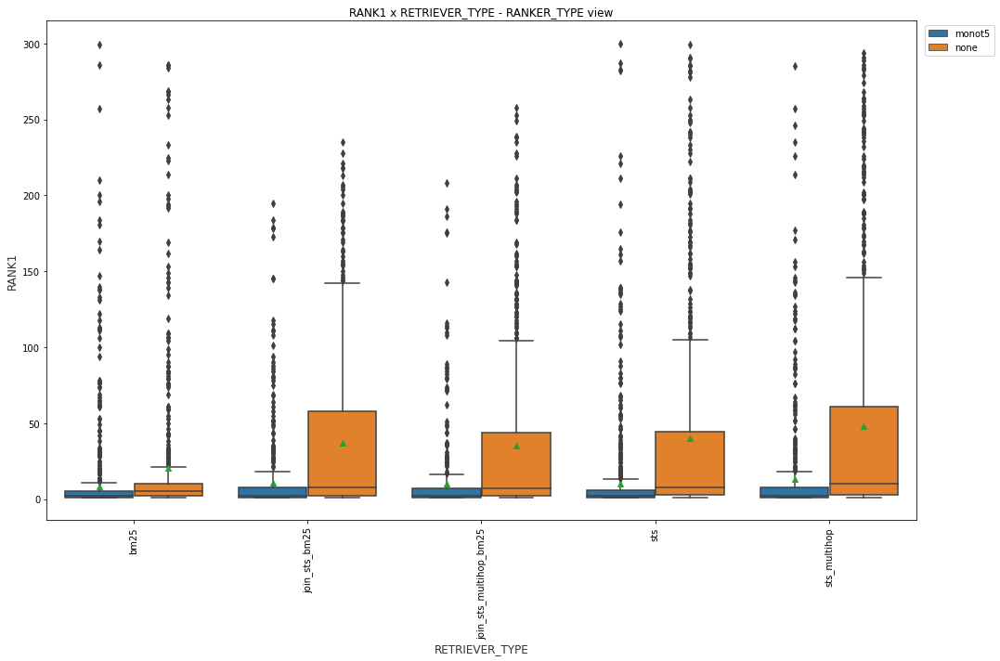

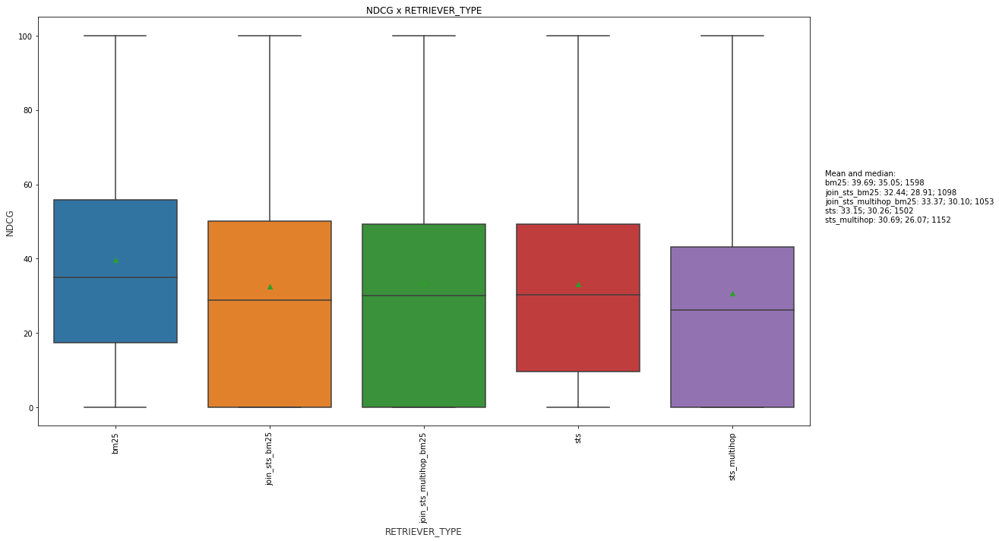

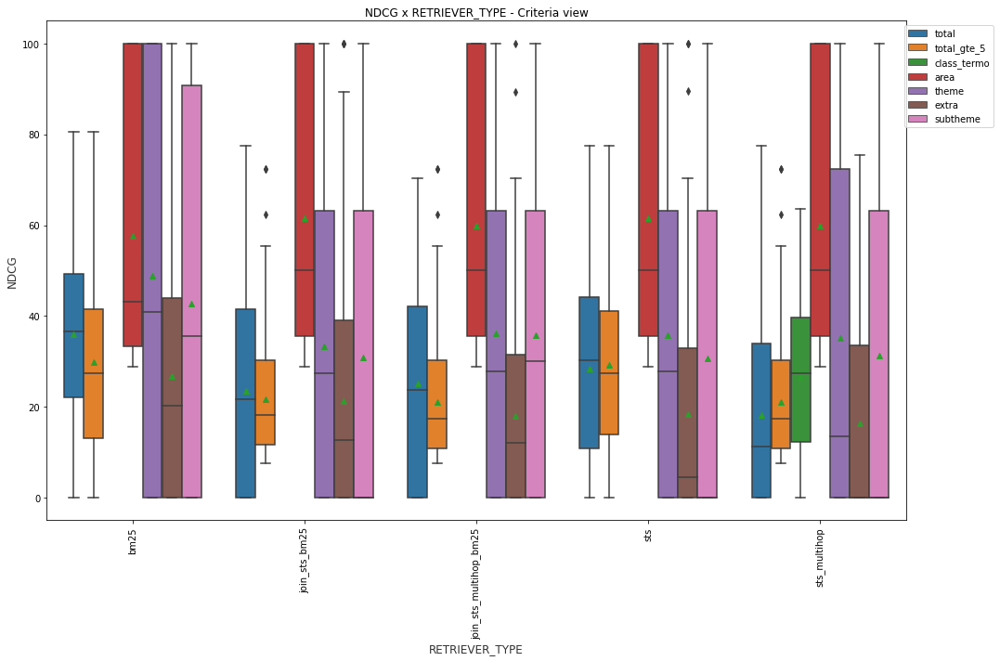

...

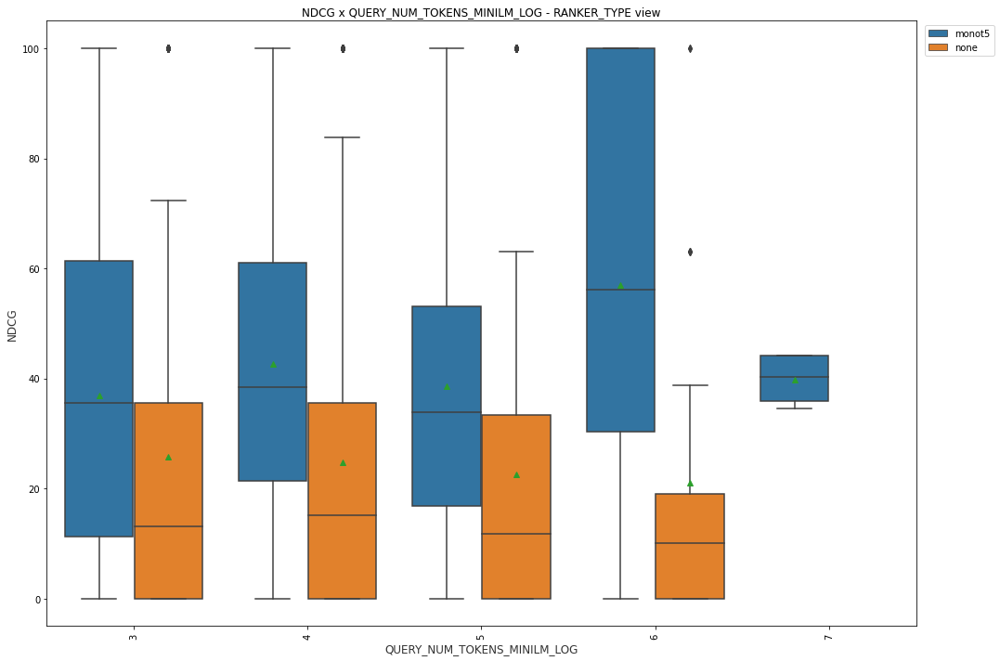

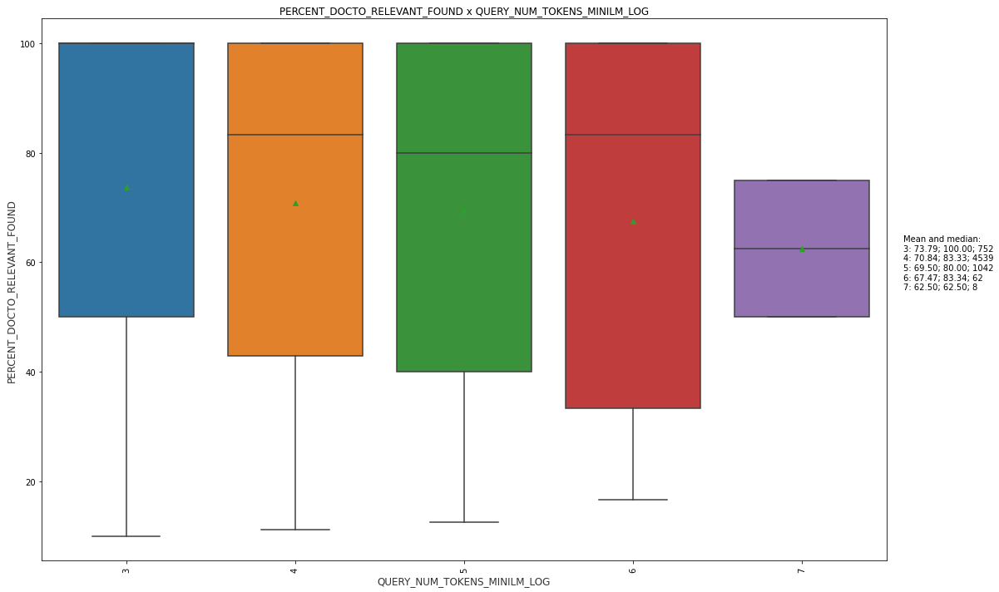

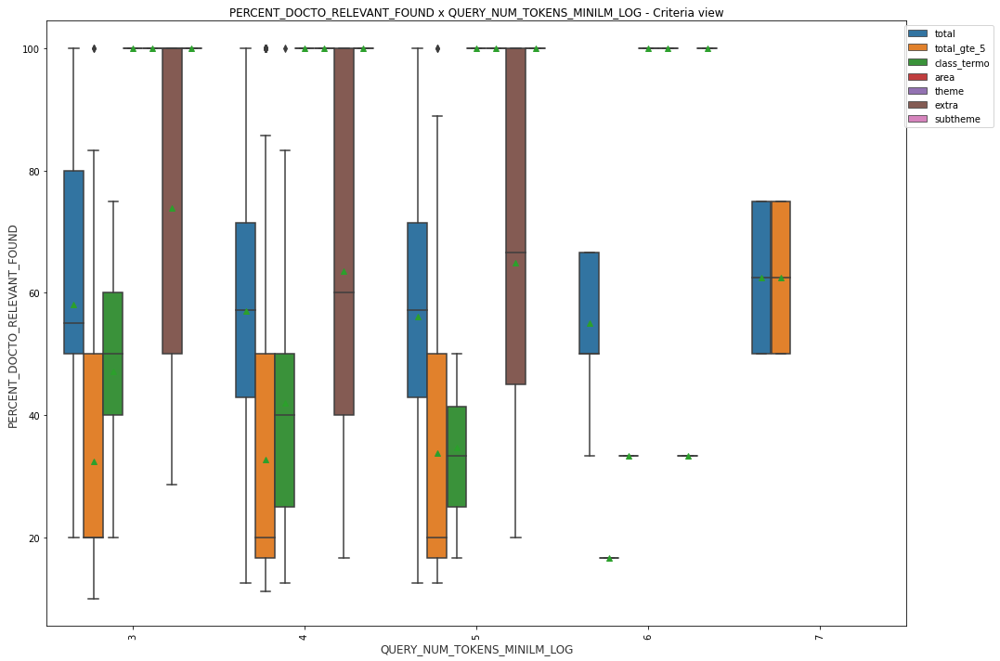

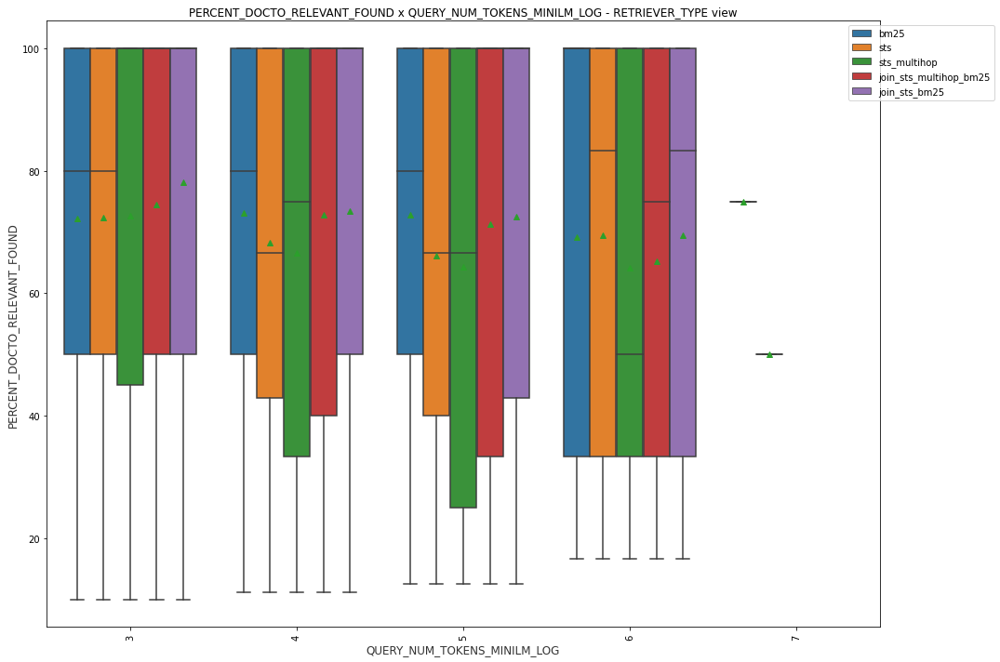

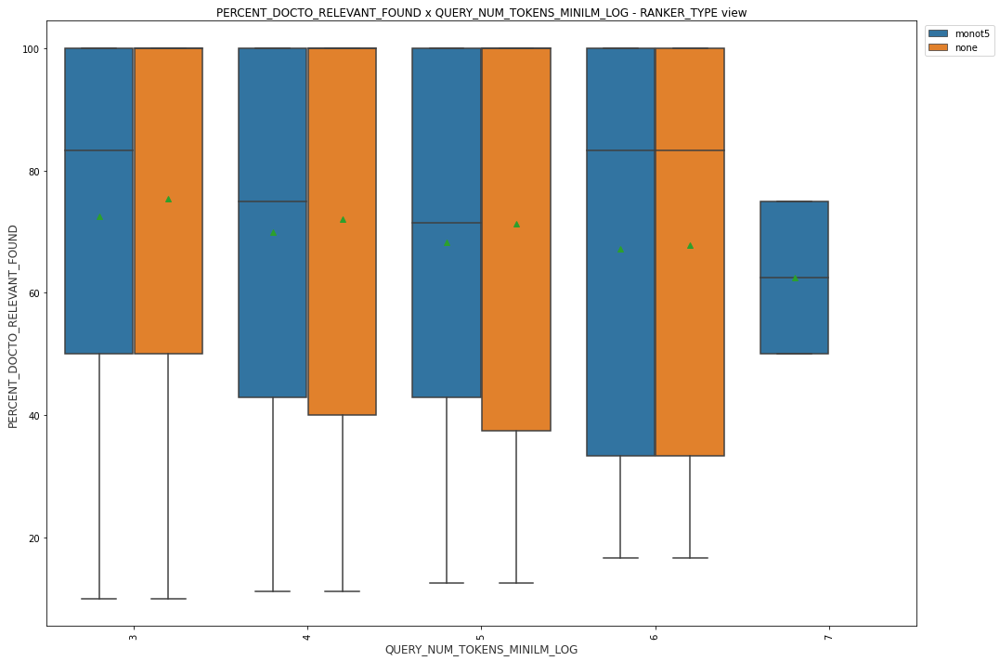

In [44]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

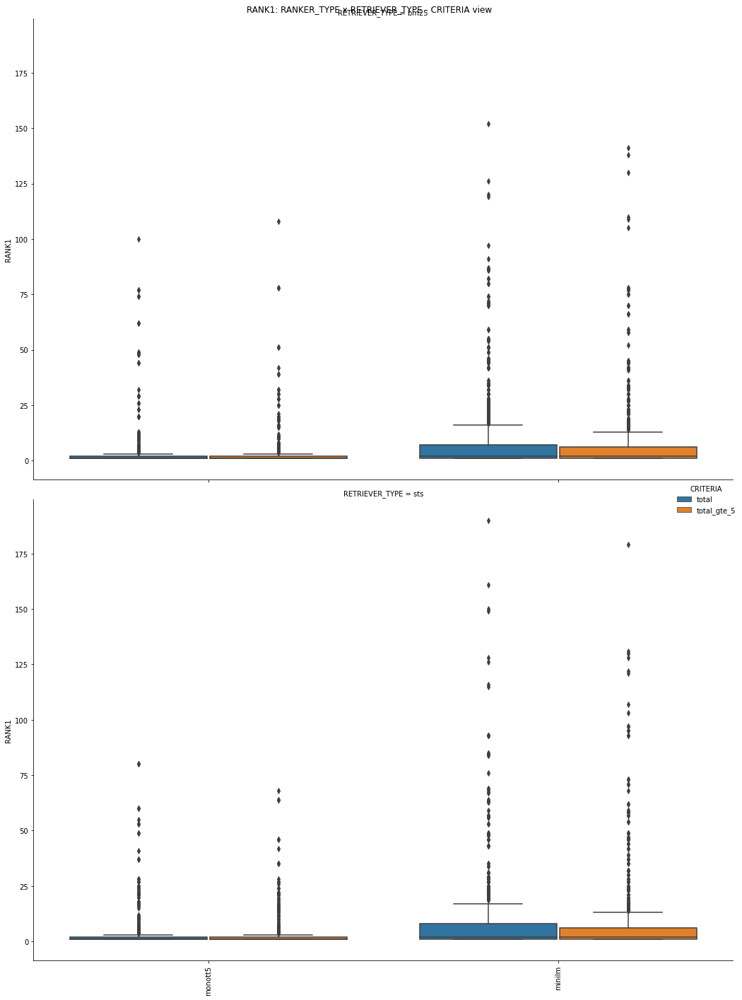

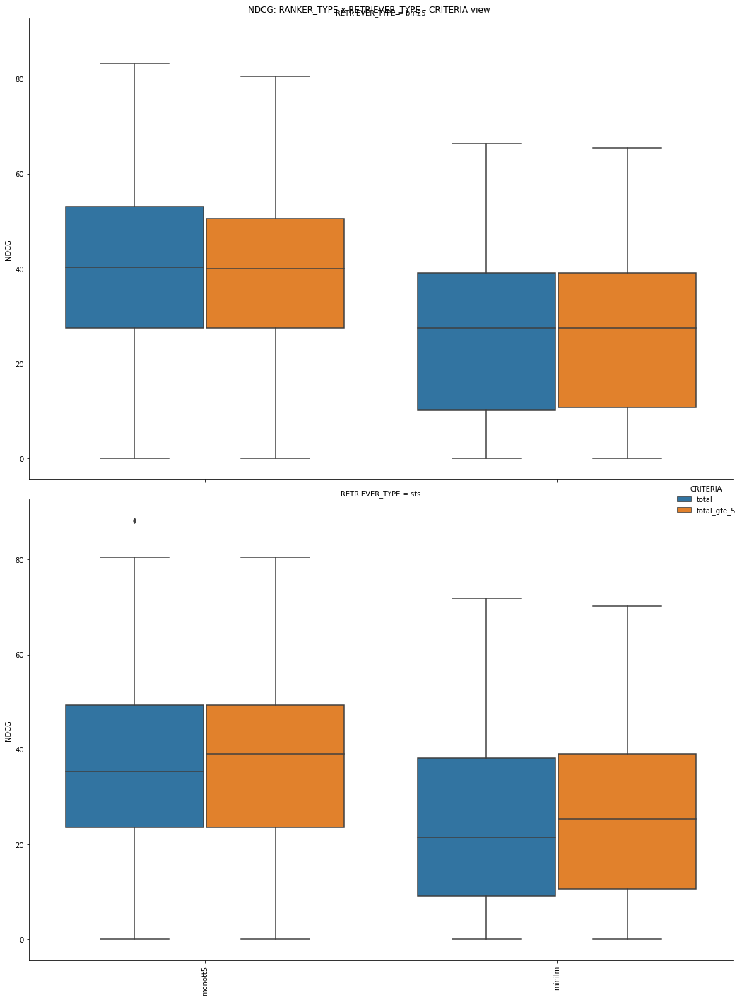

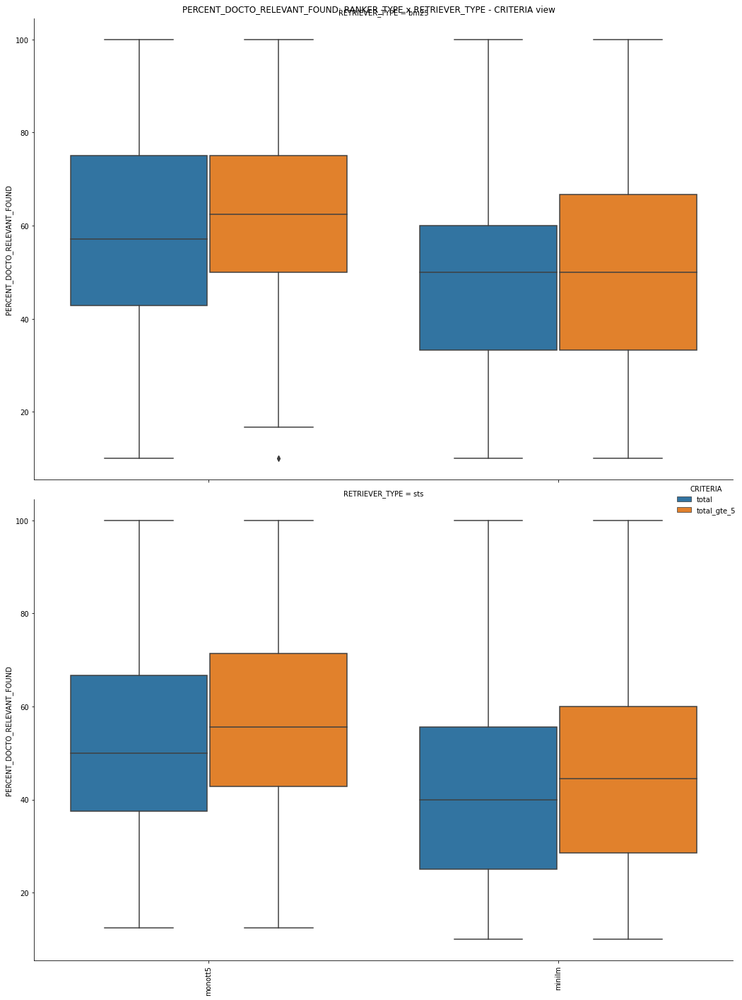

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

## Correlation 

In [50]:
df_result.corr()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,COUNT_DOCTO_RELEVANT,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
TIME_SPENT,1.000000,0.159931,-0.146162,0.580922,0.184871,NaN,NaN,NaN,-0.026999,-0.011806,0.064791,0.034253,0.060449,0.061807,0.055349,0.043293,0.043780,0.389722,0.028134
NDCG,0.159931,1.000000,-0.452010,-0.159675,-0.258837,NaN,NaN,NaN,-0.001094,0.025774,0.000209,-0.011625,-0.006890,-0.001482,-0.001213,0.013206,0.000477,-0.023892,0.352164
RANK1,-0.146162,-0.452010,1.000000,0.248445,-0.187978,NaN,NaN,NaN,0.025705,-0.009795,-0.004898,0.004572,-0.000016,0.000815,0.002740,-0.018822,-0.011398,-0.155879,0.094290
COUNT_DOCTO_FOUND,0.580922,-0.159675,0.248445,1.000000,0.071178,NaN,NaN,NaN,-0.012129,-0.014716,0.027160,0.002580,0.024173,0.025392,0.021577,0.011356,0.010655,0.420311,0.167541
COUNT_DOCTO_RELEVANT,0.184871,-0.258837,-0.187978,0.071178,1.000000,NaN,NaN,NaN,-0.020157,0.062279,0.057586,0.071628,0.051134,0.051997,0.047090,0.065059,0.066102,0.629644,-0.768036
TOPK_RETRIEVER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOPK_RANKER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.026999,-0.001094,0.025705,-0.012129,-0.020157,NaN,NaN,NaN,1.000000,0.000437,0.101806,0.106190,0.094546,0.092643,0.107483,0.179507,0.064543,-0.040700,-0.003191
QUERY_ID_DOCTO,-0.011806,0.025774,-0.009795,-0.014716,0.062279,NaN,NaN,NaN,0.000437,1.000000,0.054117,0.049030,0.046645,0.063167,0.061839,0.109567,0.107423,-0.024836,-0.060220


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


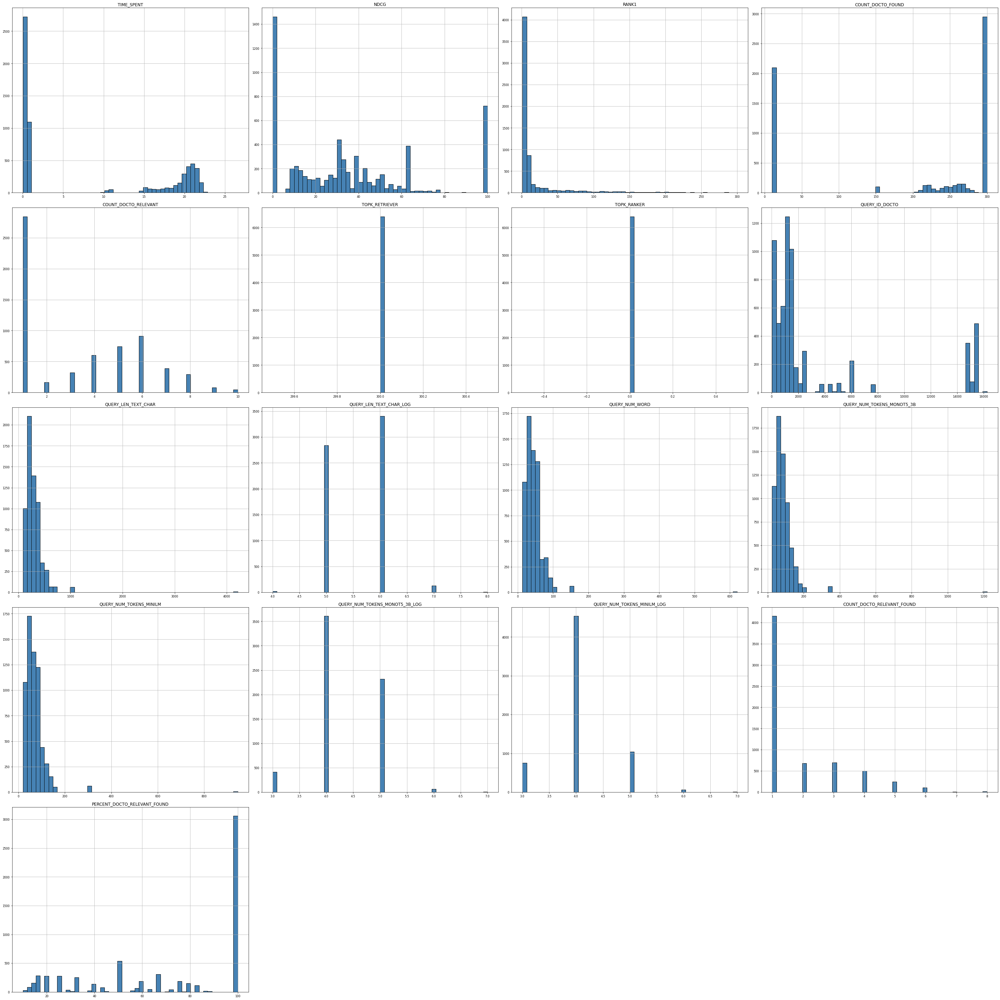

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

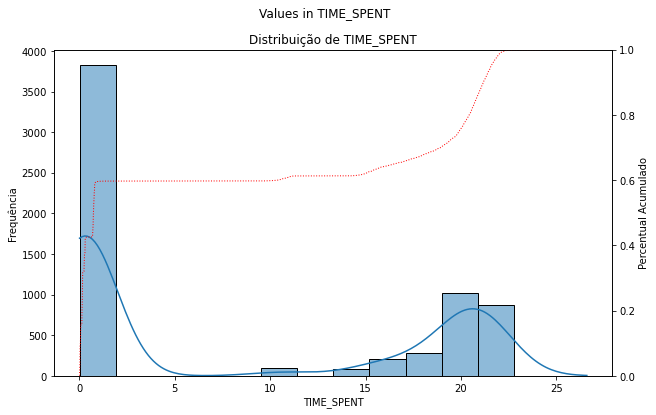

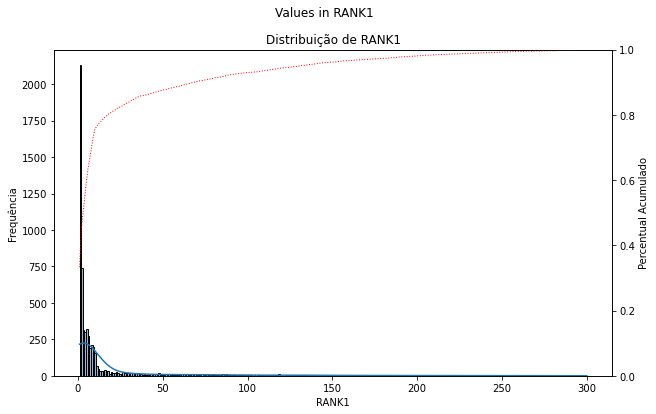

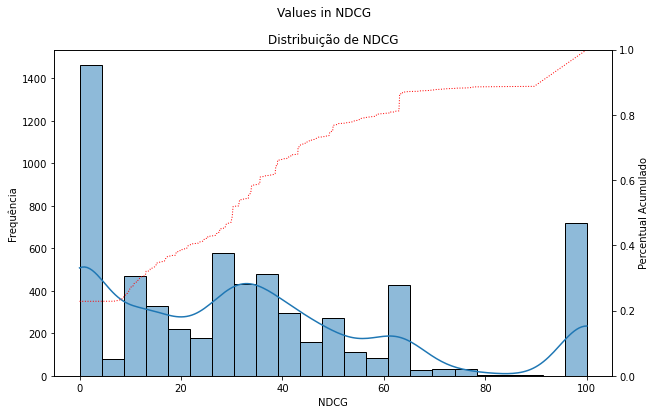

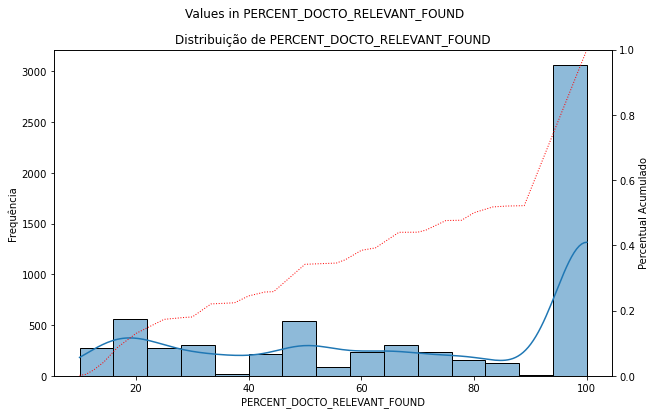

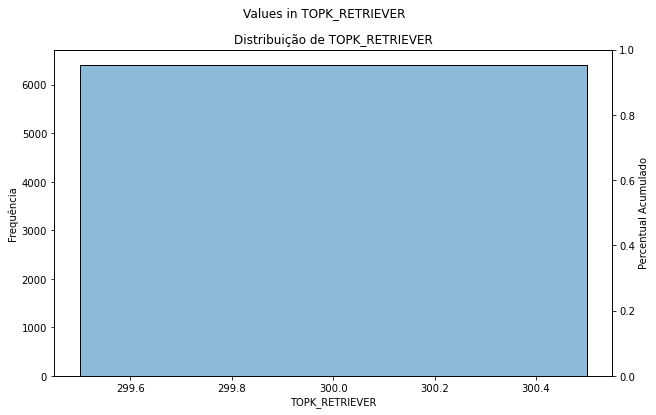

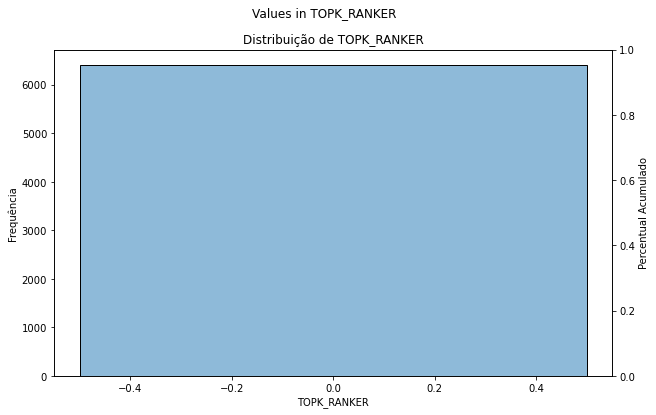

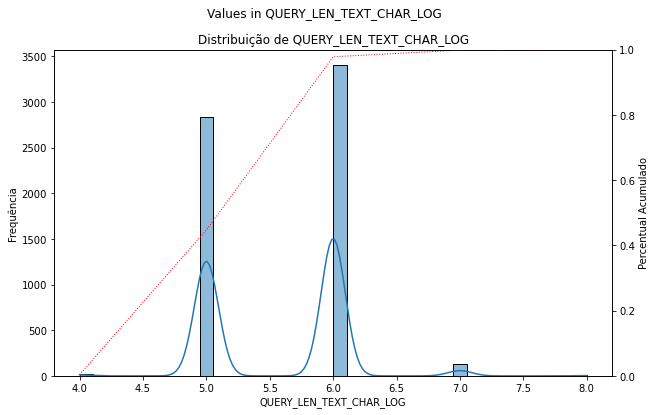

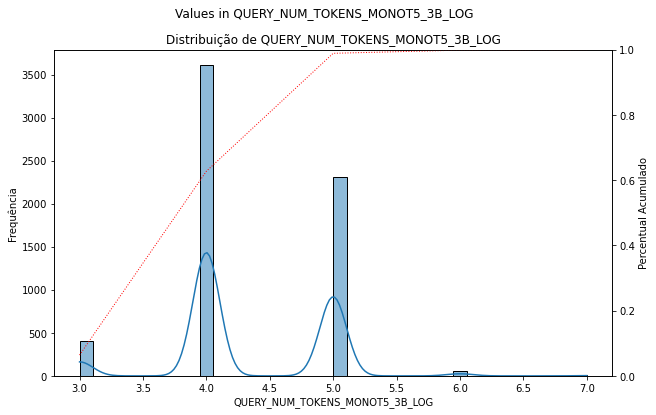

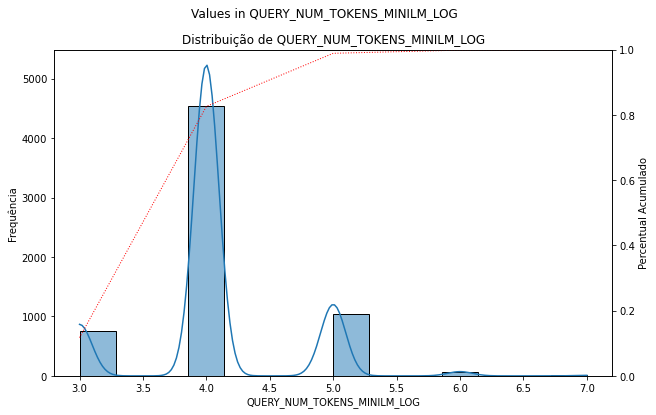

In [52]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

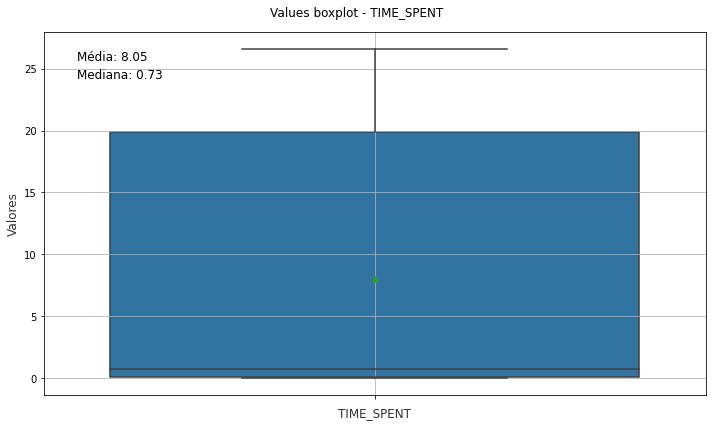

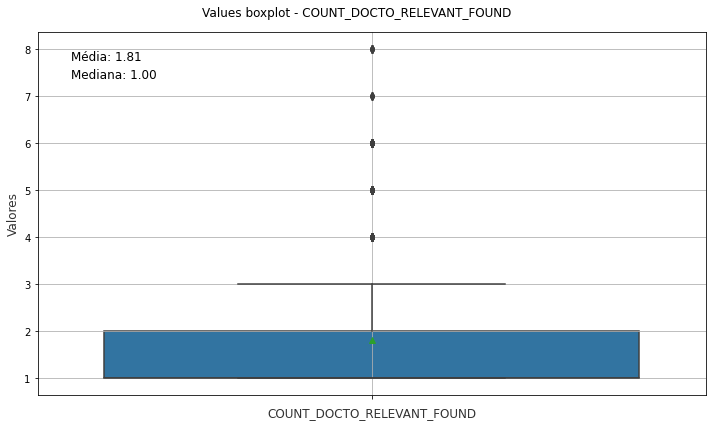

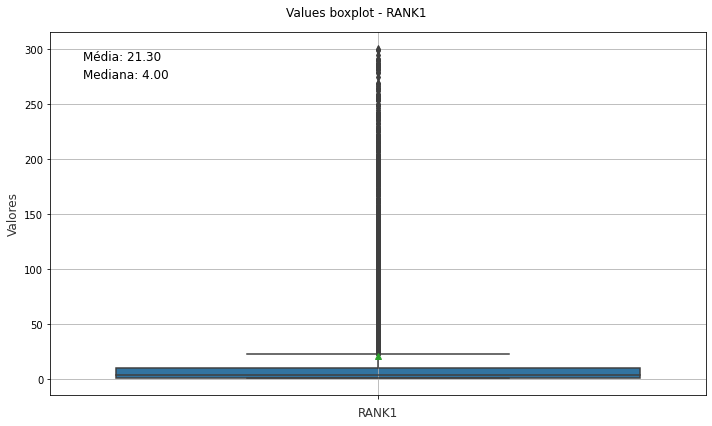

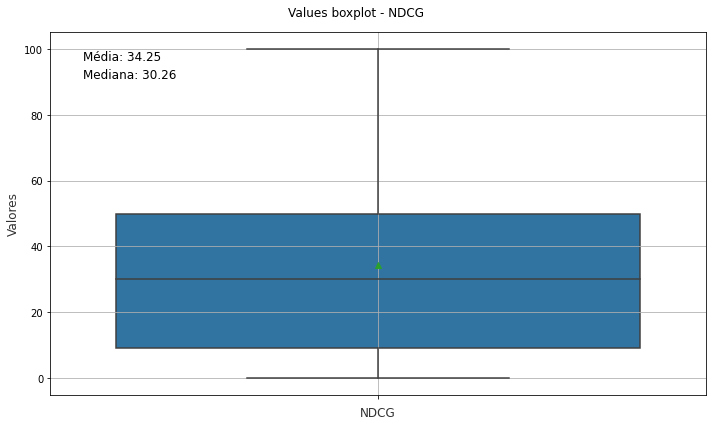

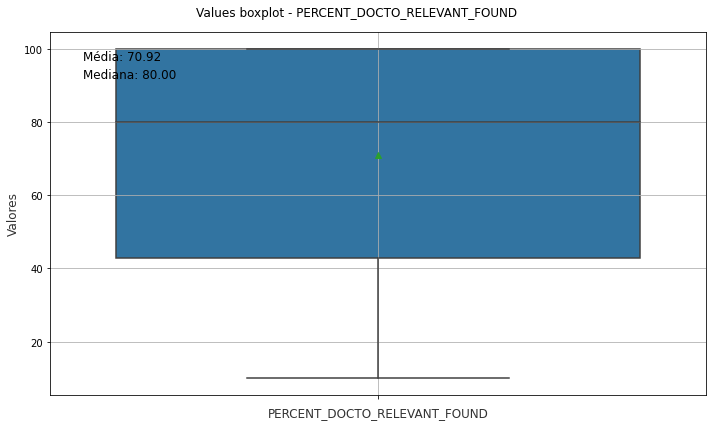

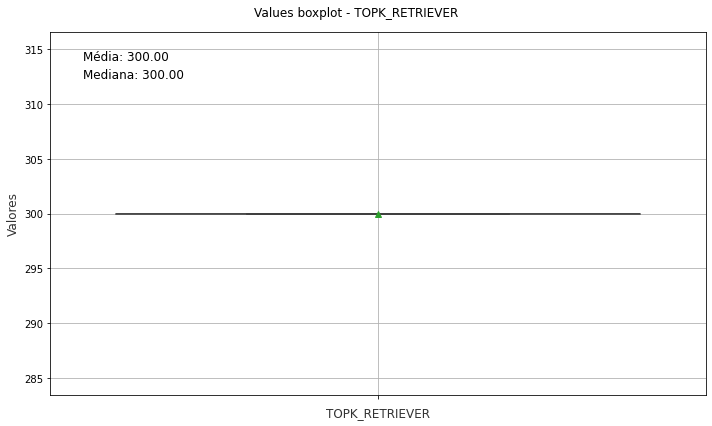

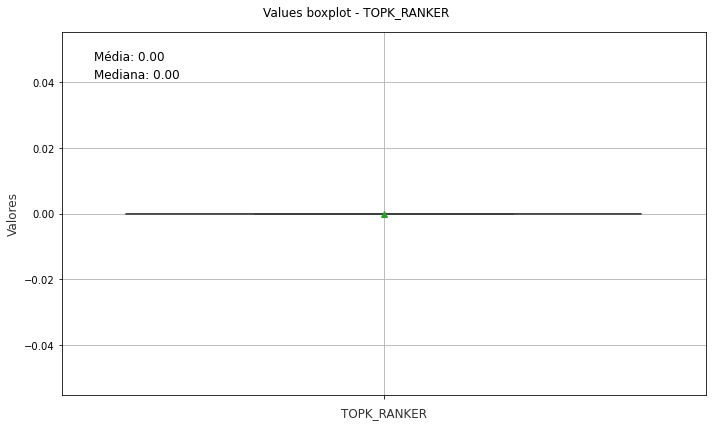

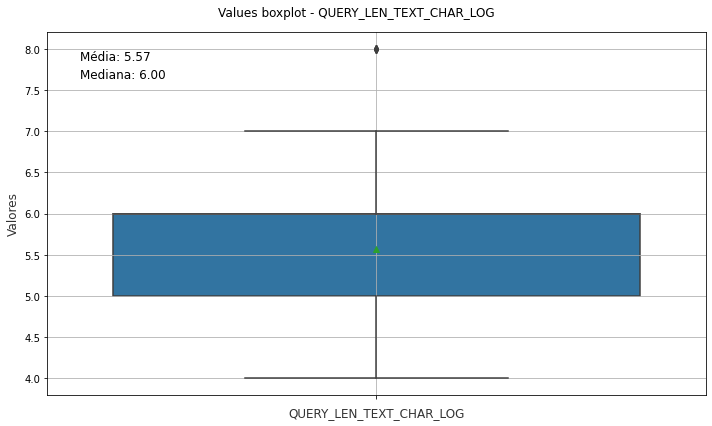

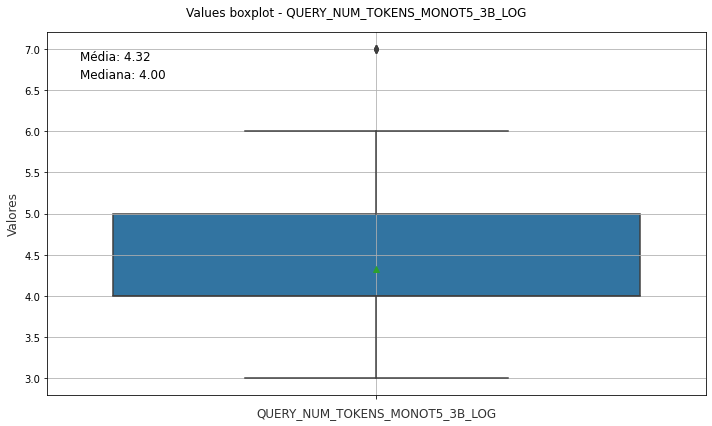

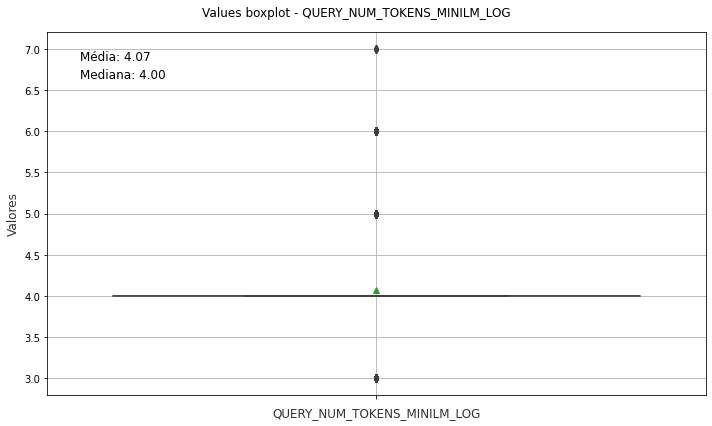

In [53]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [54]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [55]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
9117,0.6998,100.0,1,10,[1],1,{342: 'AREA'},"[342, 5095, 331, 775, 629, 932, 15273, 414, 52...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,15470,"{342: 'AREA', 631: 'INDEXACAO_EXTRA', 2553: 'T...","{'AREA': [342], 'INDEXACAO_EXTRA': [631], 'TEM...",NaN,Convênio,342,266,6,45,71,57,4,4,1,100.0,monot5
9695,0.0242,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9738,0.7222,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12560,20.6935,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",sts_multihop,300,0.0,12,theme,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5
9727,0.0308,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9726,0.0657,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 932, 331, 414, 1131, 342, 775, 528...",join_sts_multihop_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
12569,0.1282,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 506, 295, 1451, 722, 1480, 1100217...",bm25,300,0.0,12,theme,NaN,NaN,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,none
9713,0.7174,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
9712,0.6927,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12584,19.9793,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",bm25,300,0.0,12,theme,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5


In [56]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(1257, 31)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


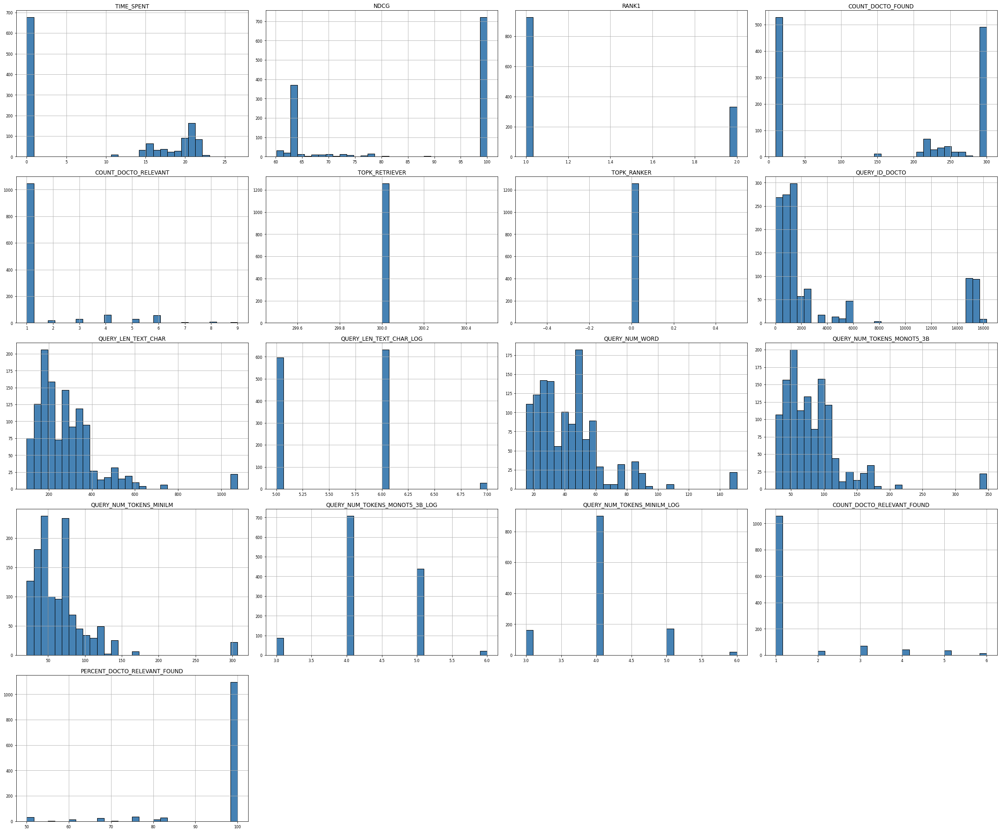

In [57]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

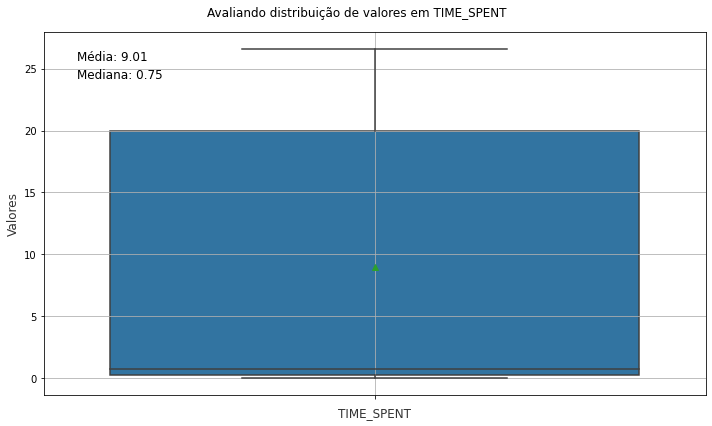

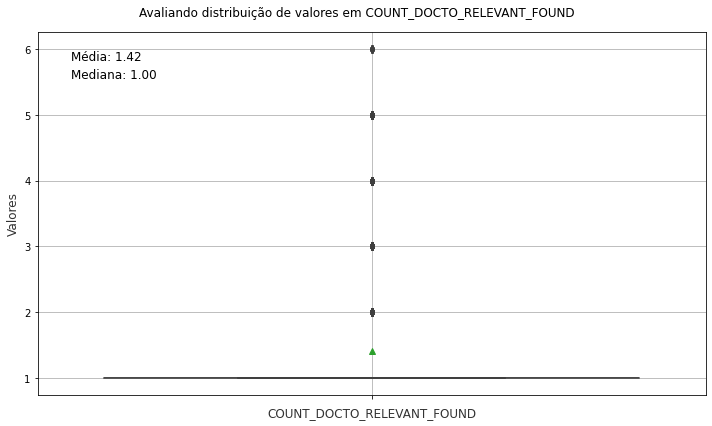

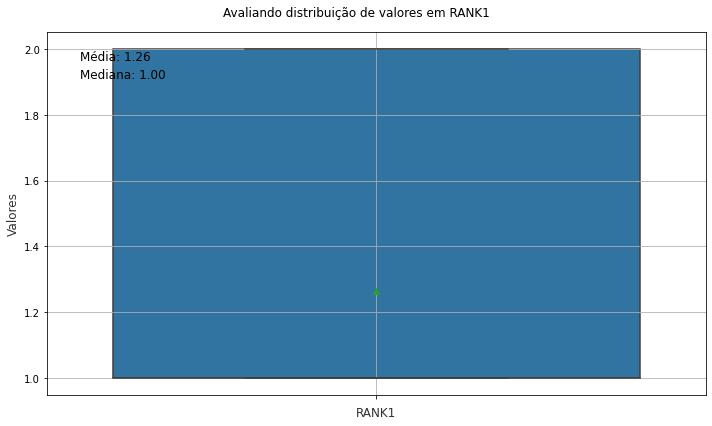

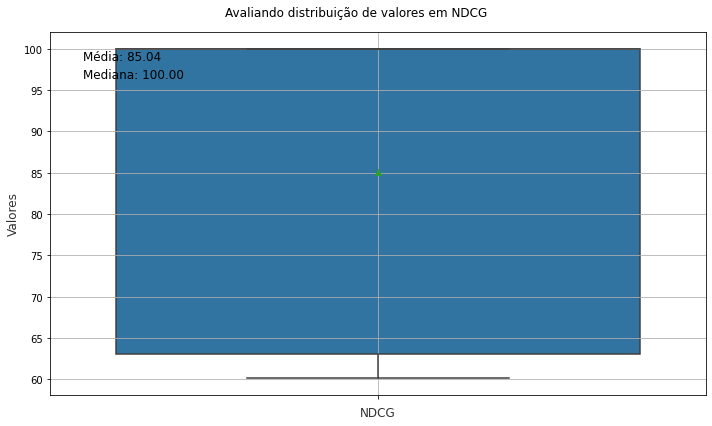

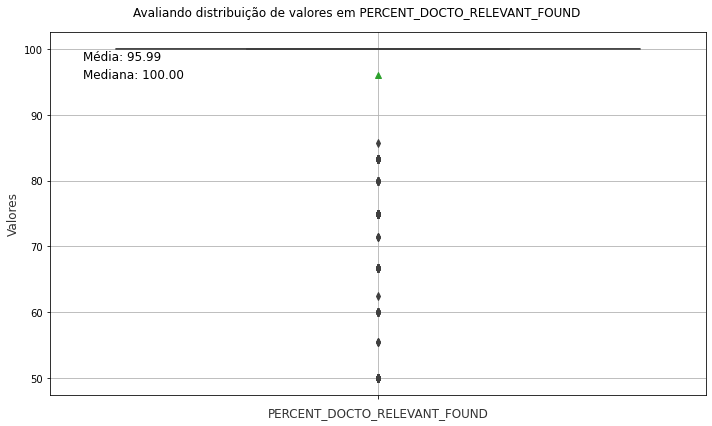

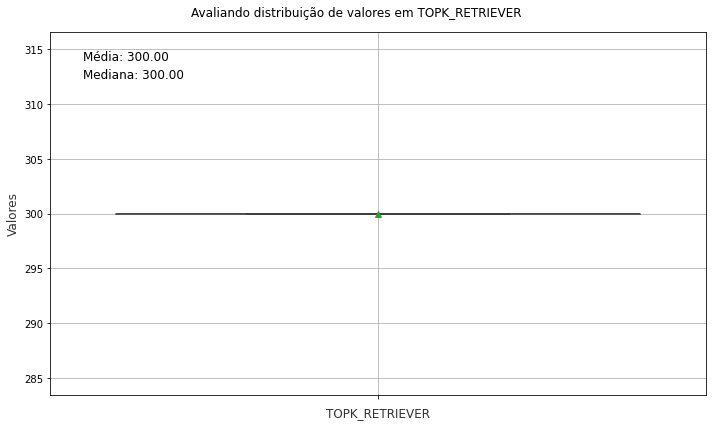

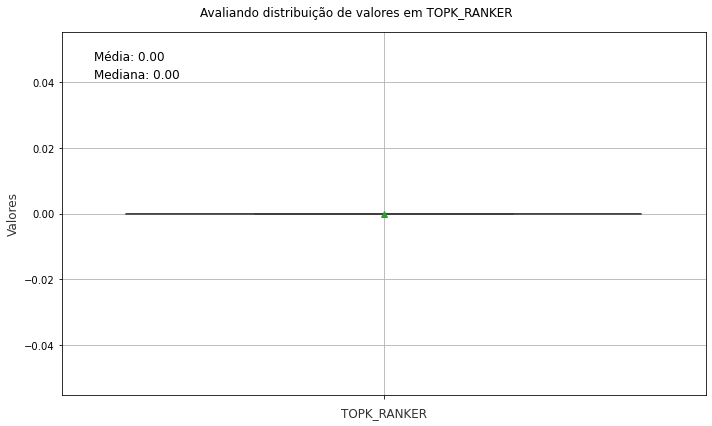

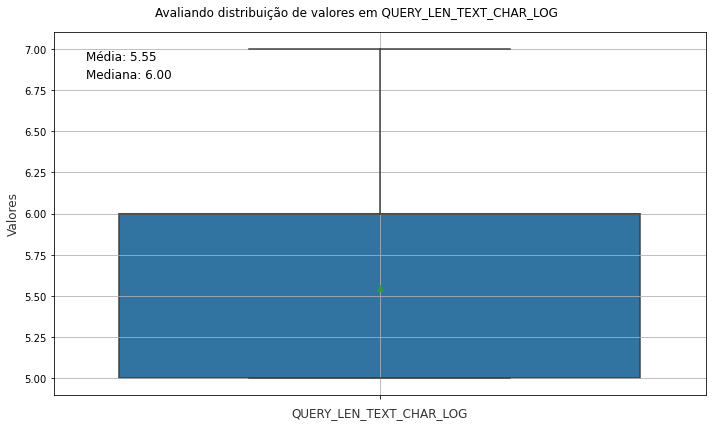

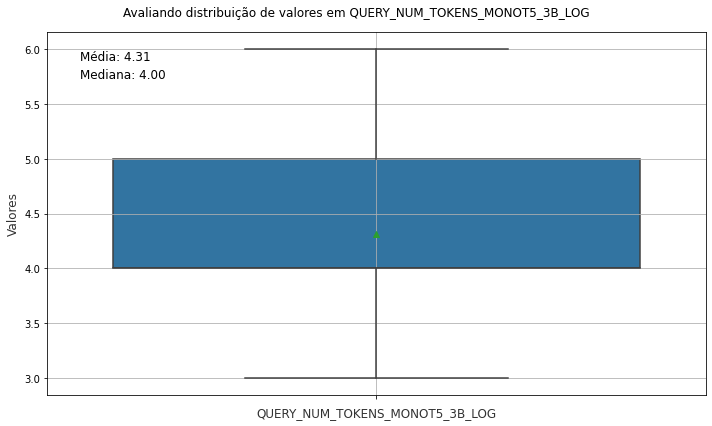

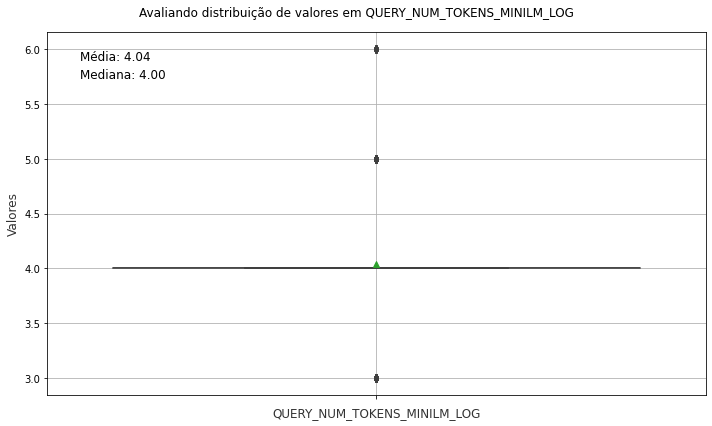

In [58]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

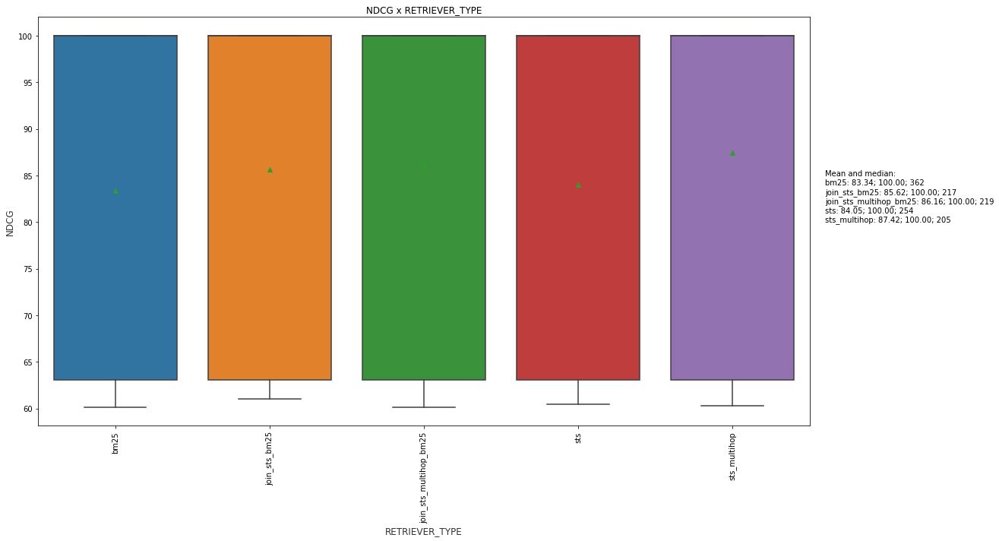

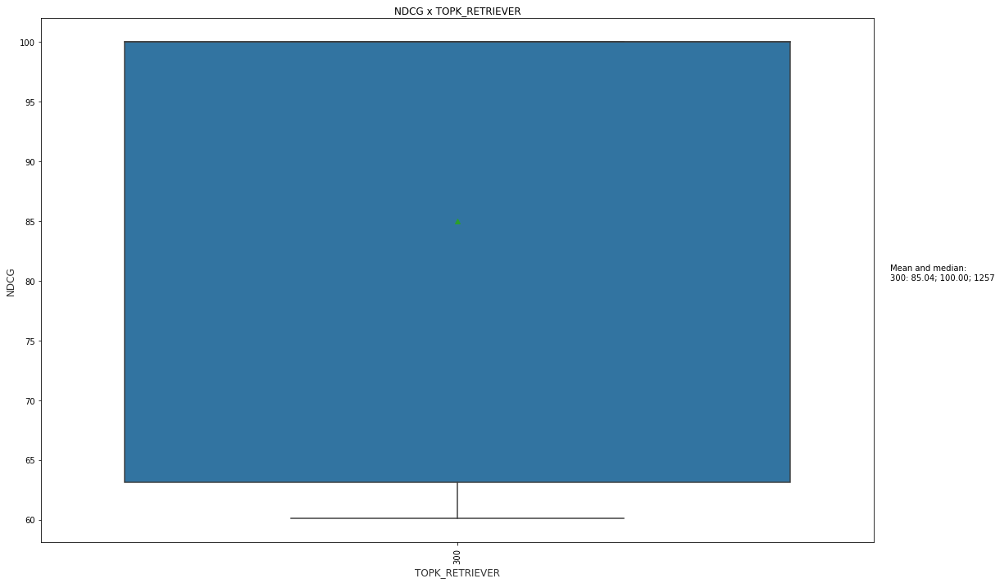

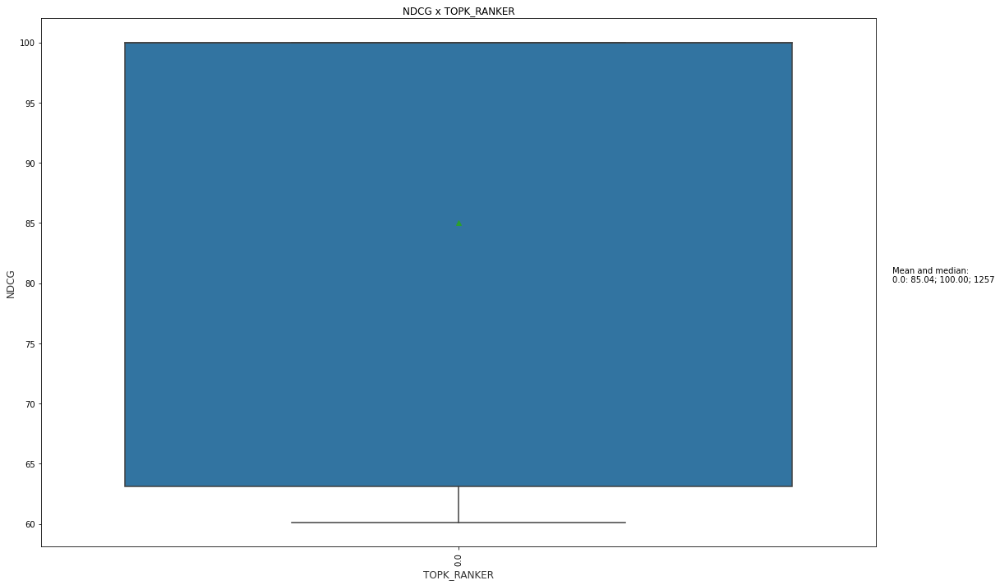

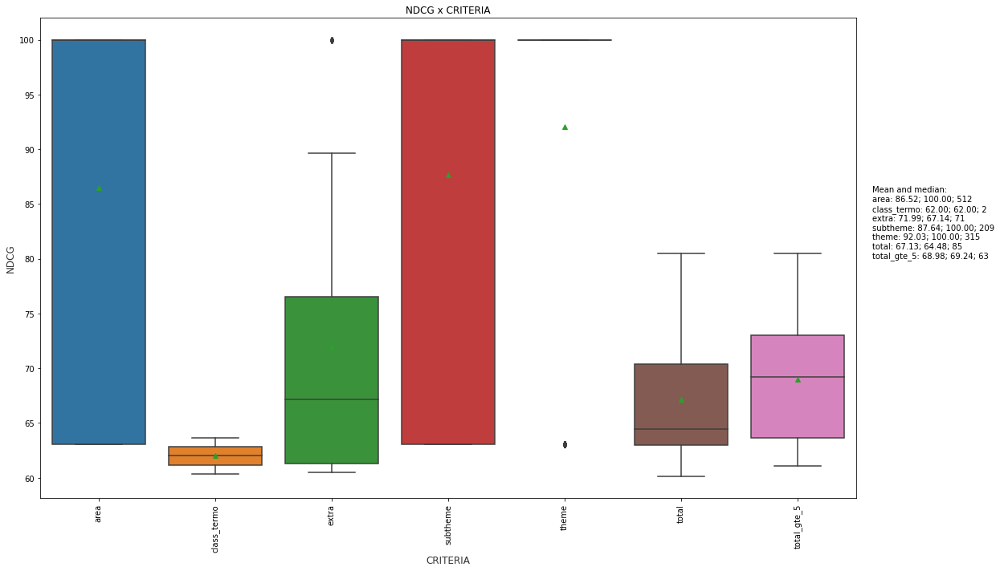

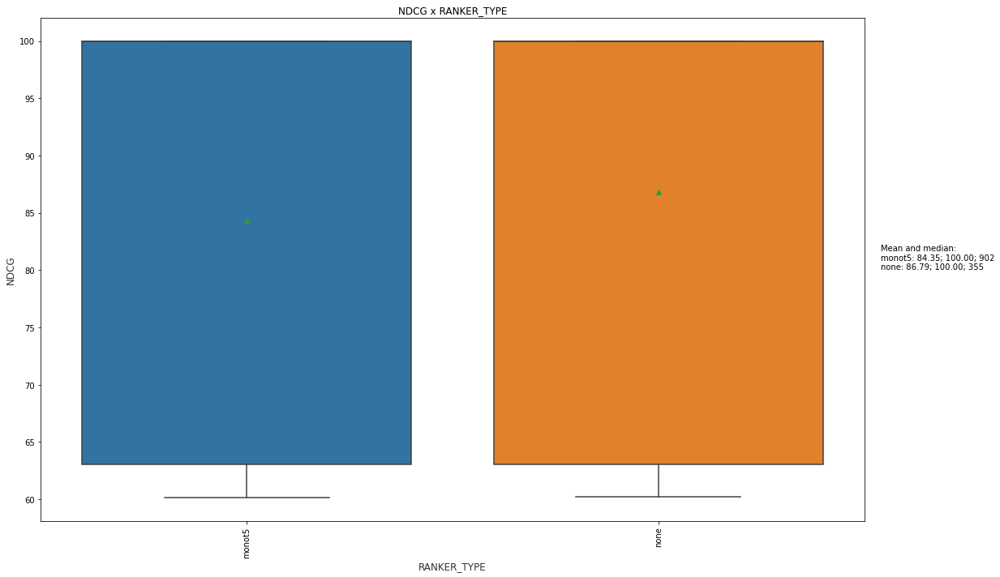

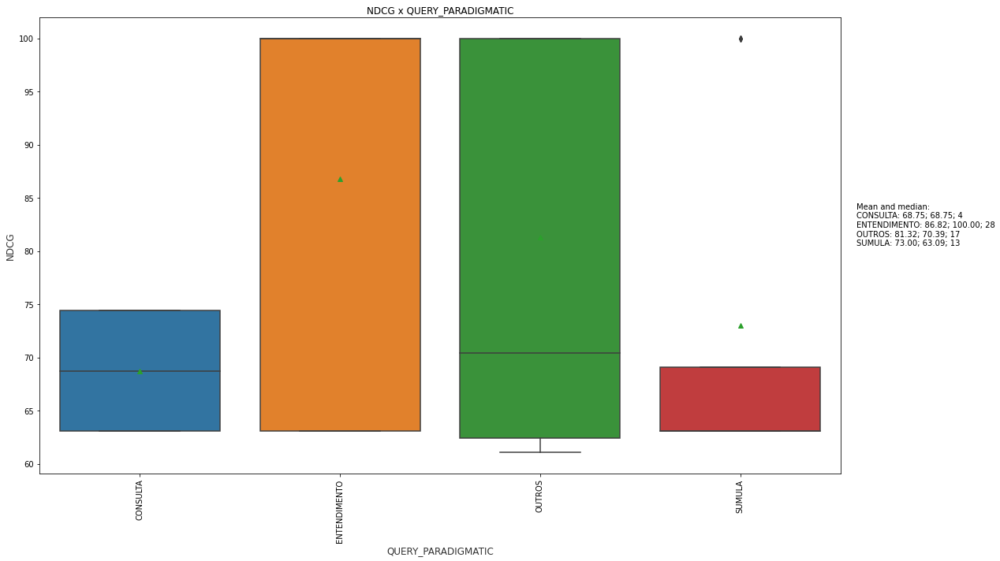

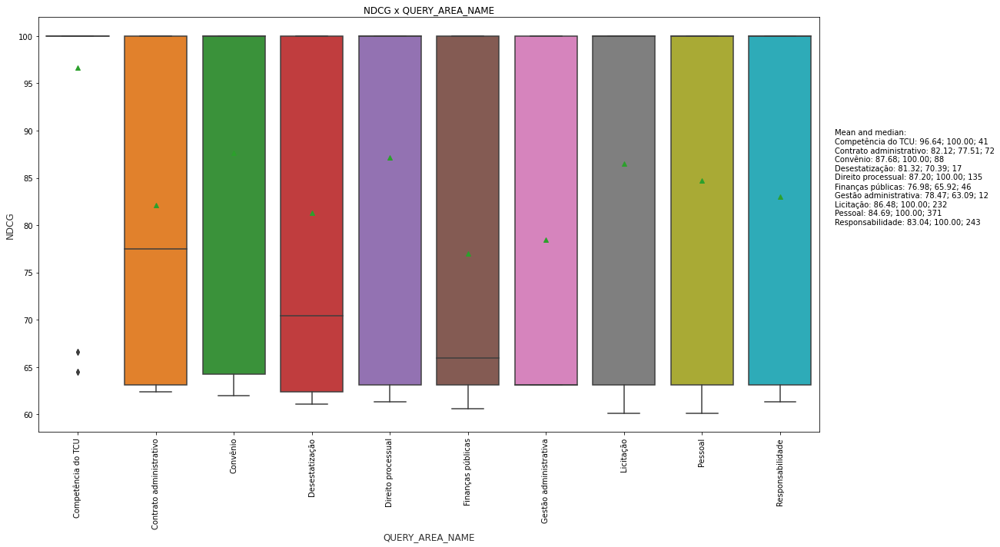

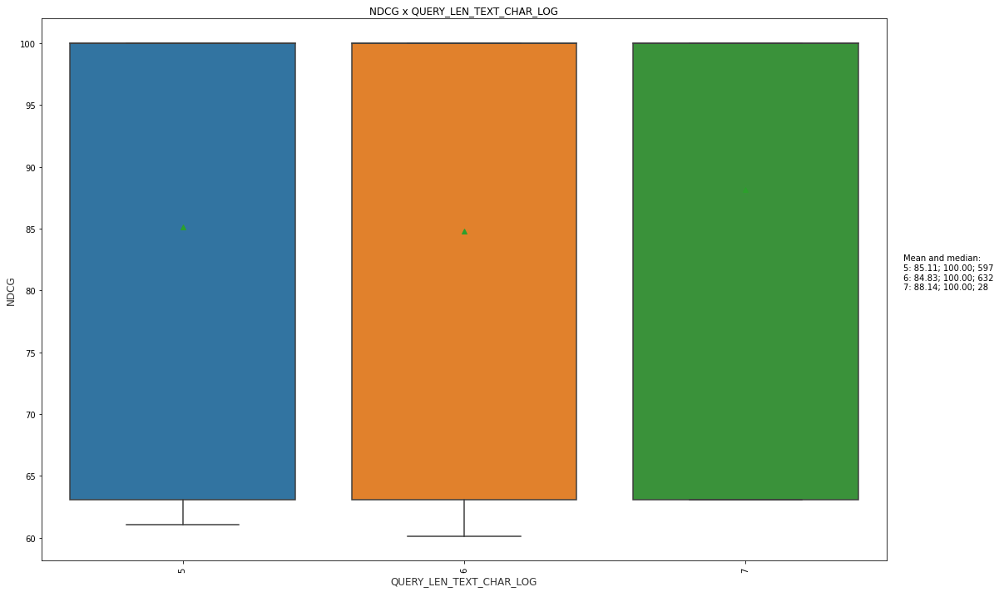

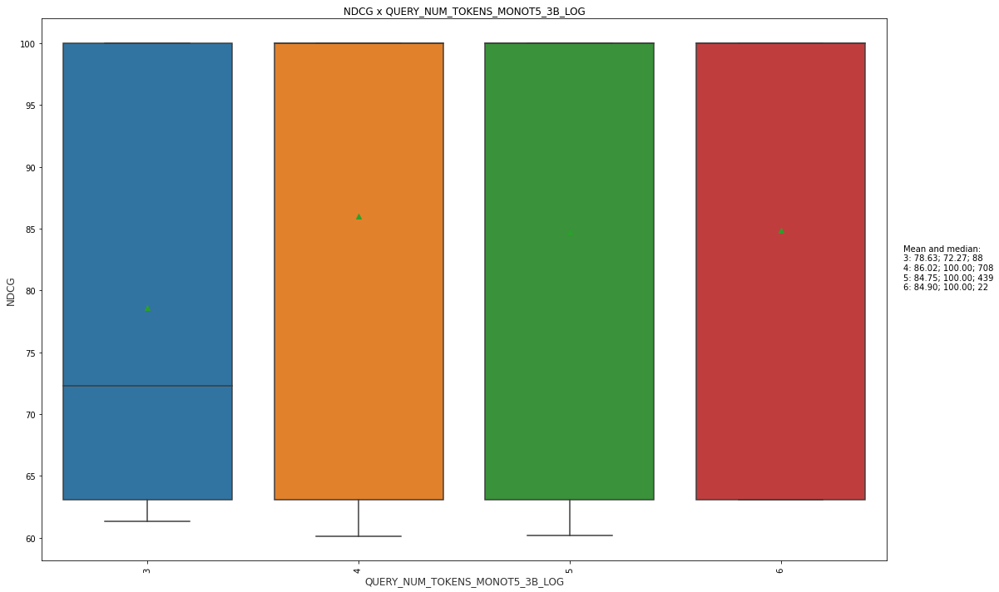

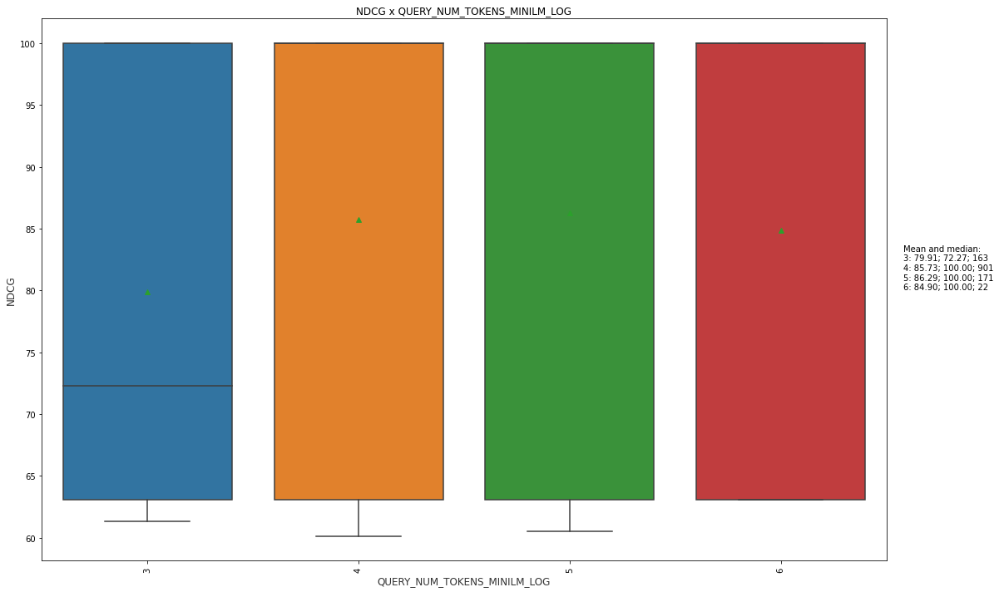

In [59]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Doc - evaluation


In [ ]:
import importlib
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [ ]:
%%time
df_result_doc = util_evaluation.return_result_per_doc(DATASET_NAME)

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


CPU times: user 1min, sys: 136 ms, total: 1min
Wall time: 1min


In [ ]:
df_result_doc.shape

(43560, 54)

In [ ]:
df_result_doc.columns

Index(['COUNT_DOCTO_RELEVANT', 'TIME_SPENT', 'NDCG', 'COUNT_DOCTO_FOUND',
       'RANK1', 'LIST_RANK', 'LIST_DOCTO_FOUND', 'RETRIEVER_TYPE',
       'TOPK_RETRIEVER', 'TOPK_RANKER', 'NDCG_LIMIT', 'CRITERIA',
       'RETRIEVER_MODEL_NAME', 'RANKER_MODEL_NAME', 'QUERY_ID',
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_ID_DOCTO',
       'QUERY_LEN_TEXT_CHAR', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_WORD',
       'QUERY_NUM_TOKENS_MONOT5_3B', 'QUERY_NUM_TOKENS_MINILM',
       'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG',
       'COUNT_DOCTO_RELEVANT_FOUND', 'PERCENT_DOCTO_RELEVANT_FOUND',
       'RANKER_TYPE', 'DOC_ID', 'TYPE_QREL', 'DOC_ID_FOUND', 'DOC_NAME',
       'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_COUNT_INDEX_AREA', 'DOC_COUNT_INDEX_T

In [ ]:
# list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category_doc = [
       # about doc
       'TYPE_QREL', 'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_LEN_TEXT_CHAR_LOG',
       'DOC_NUM_TOKENS_MONOT5_3B_LOG', 'DOC_NUM_TOKENS_MINILM_LOG'
]



## Found x not found

In [ ]:
df_result_doc_found = df_result_doc[df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_not_found = df_result_doc[-df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_found.shape, df_result_doc_not_found.shape

((20645, 54), (22915, 54))

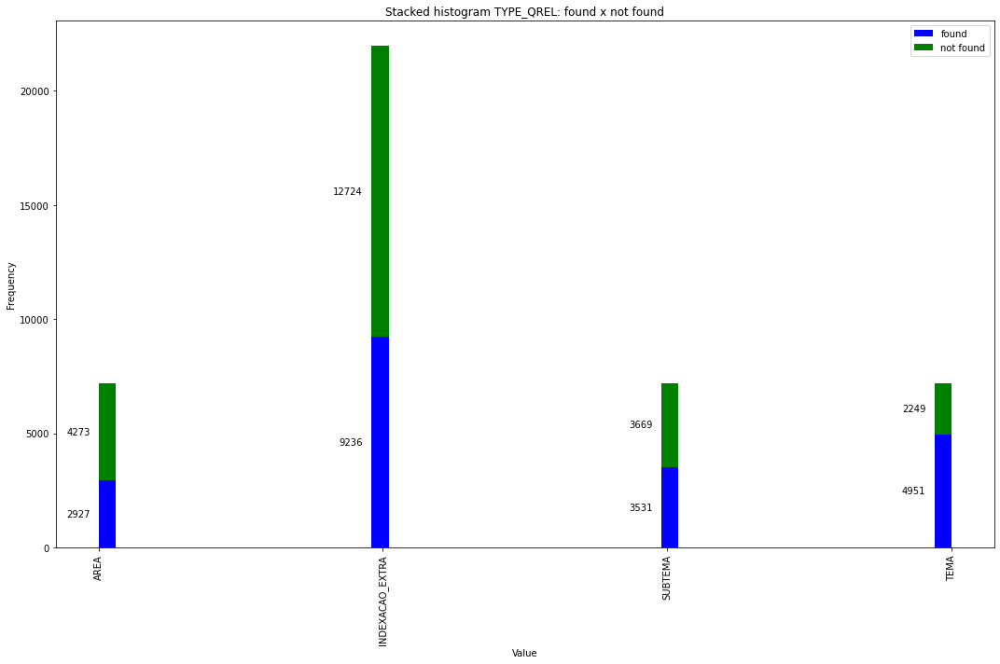

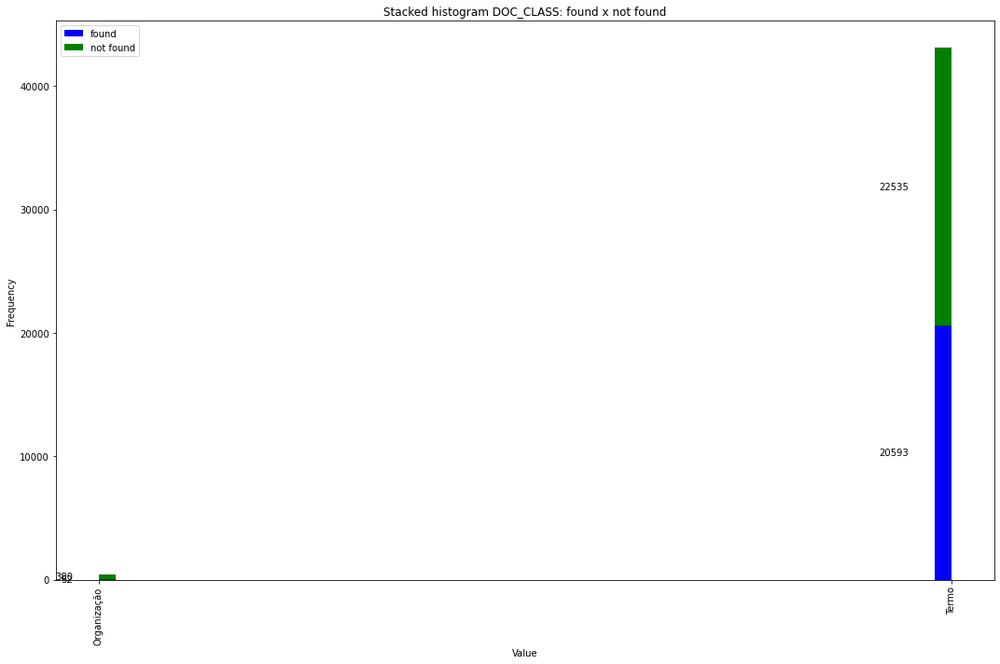

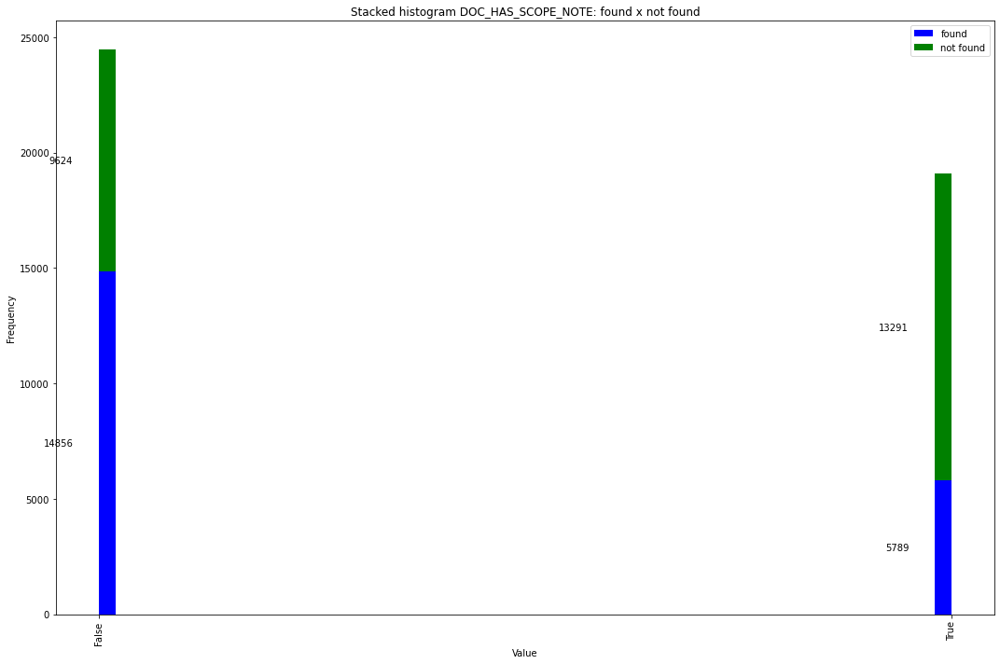

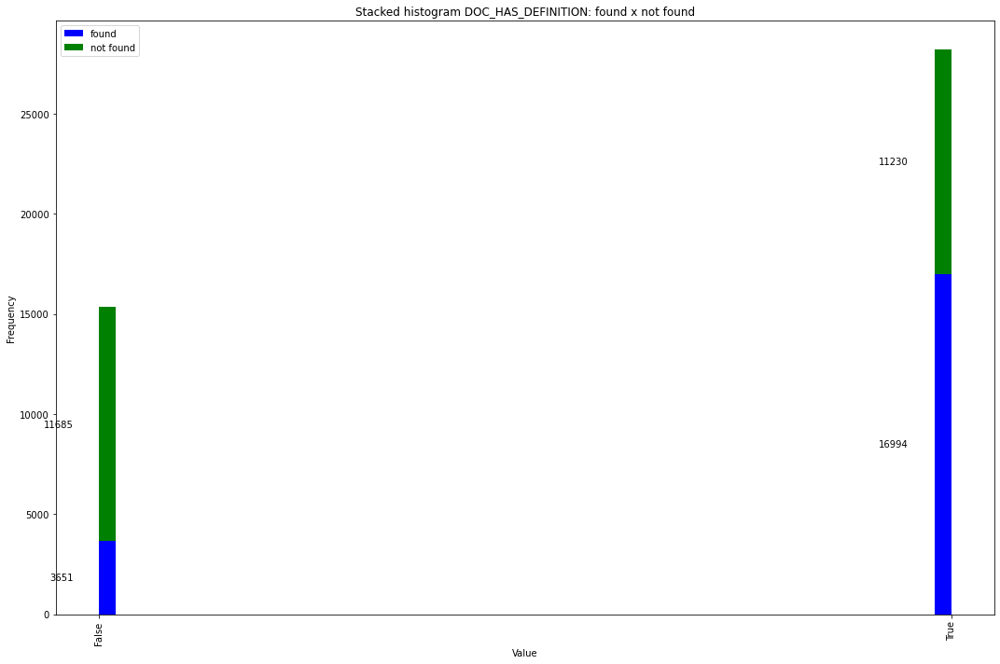

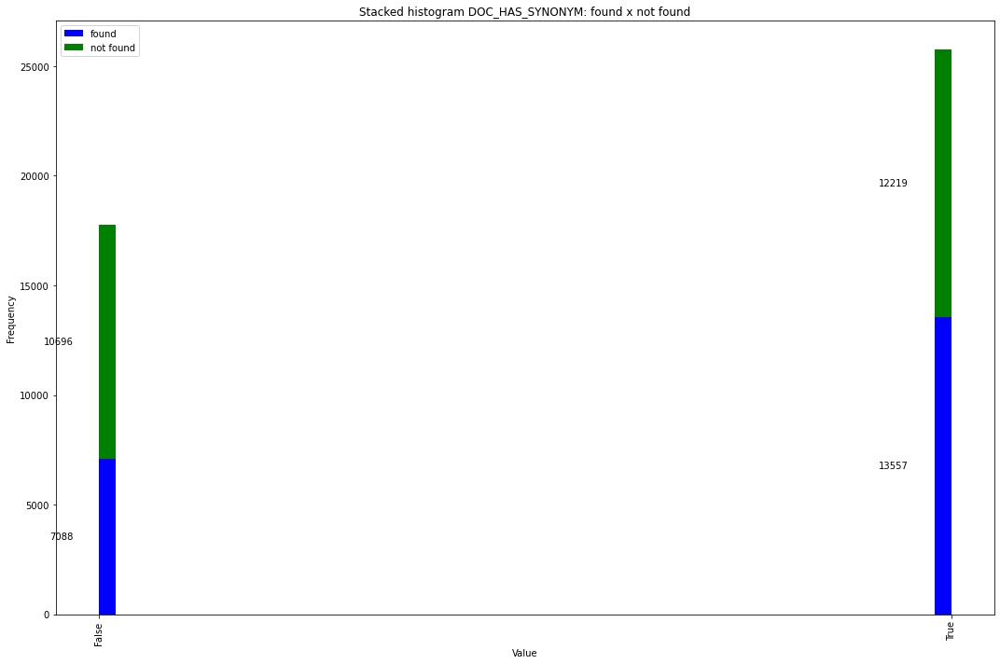

...

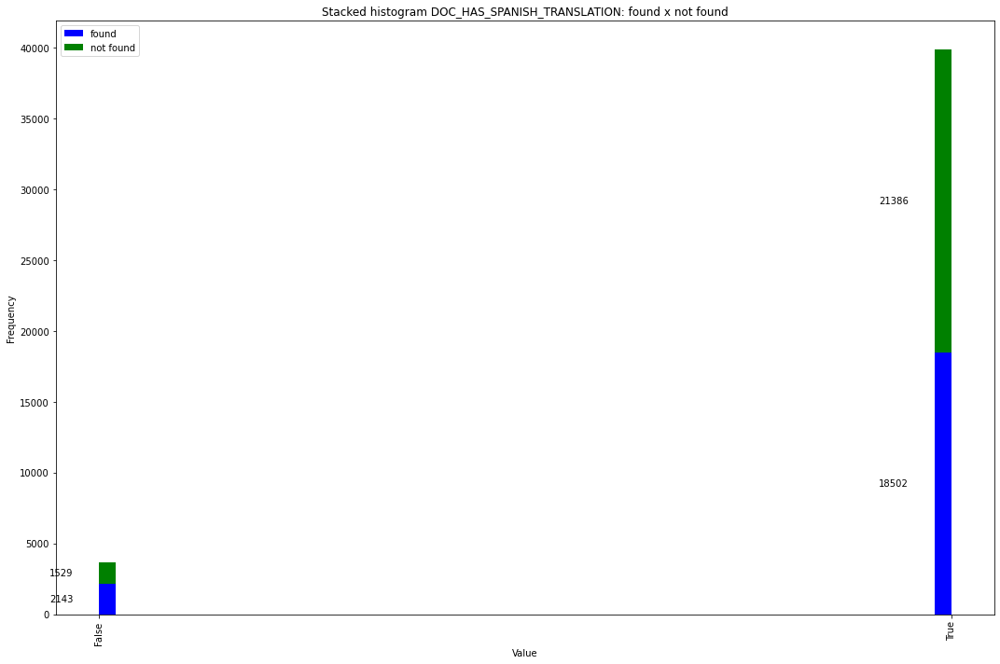

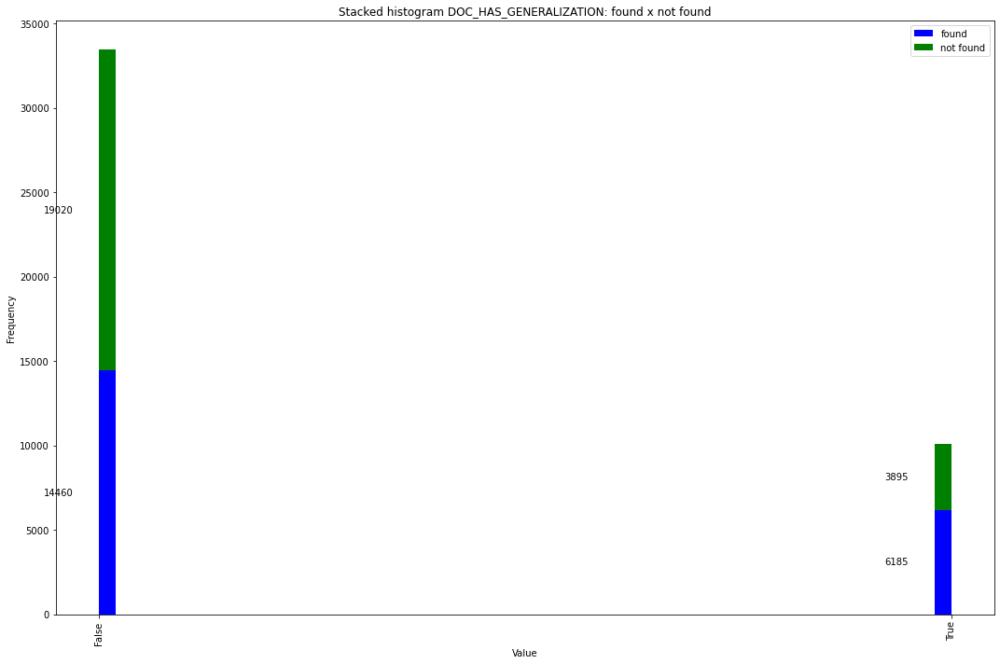

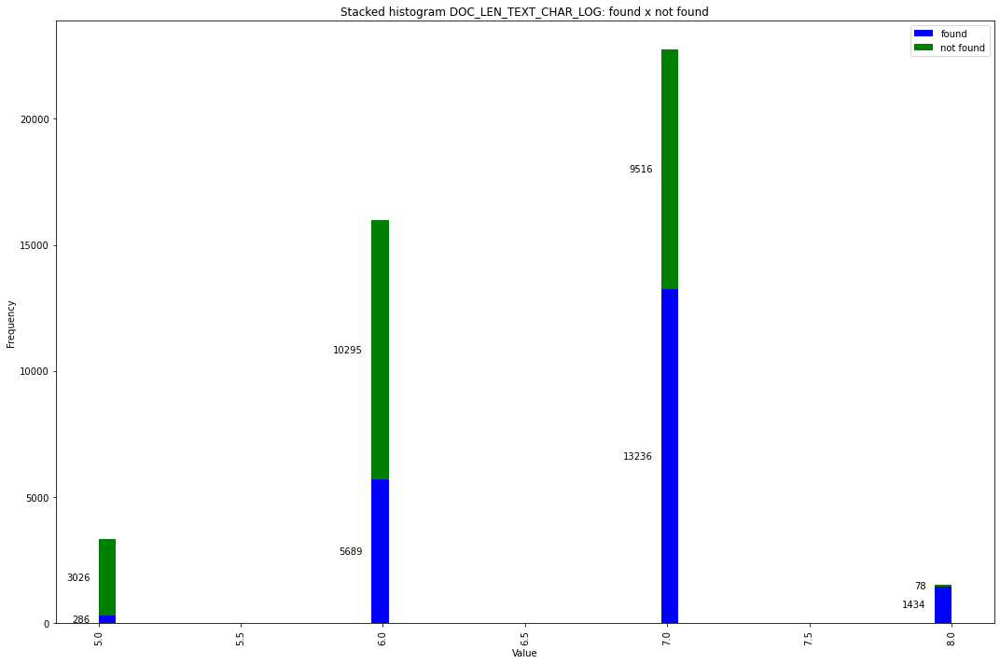

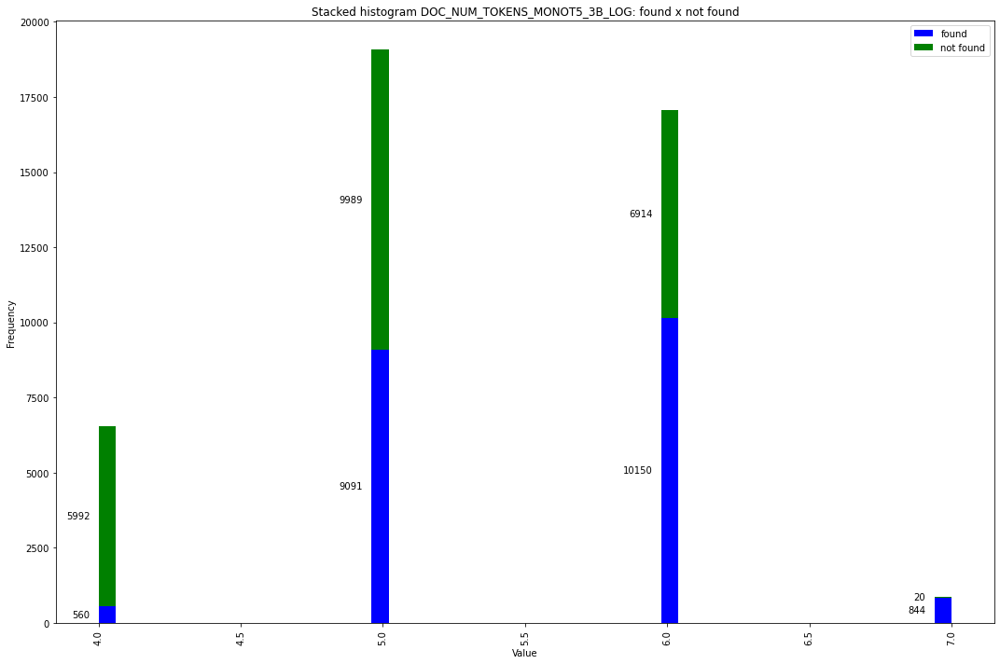

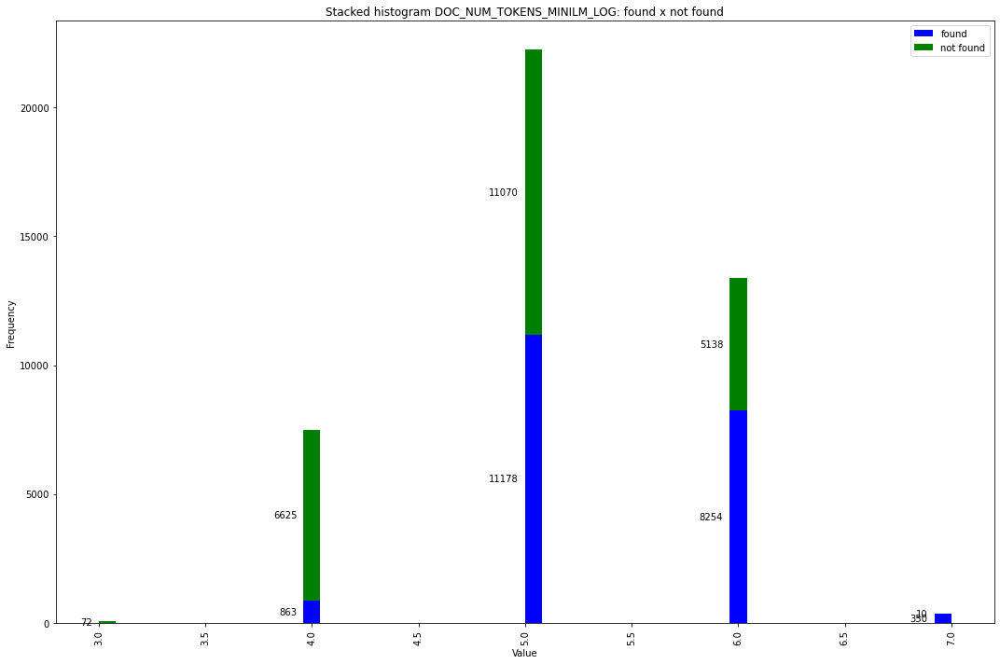

In [ ]:
for column in list_category_doc:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result_doc_found.sort_values(by=column)[column].dropna(), df_result_doc_not_found.sort_values(by=column)[column].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)

    # Definir os rótulos do eixo X para columns booleanas
    if '_HAS_' in column:
        plt.xticks([0, 1], ['False', 'True'])

    for rect in ax.patches:
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        if height > 0:
            # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
            ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {column}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

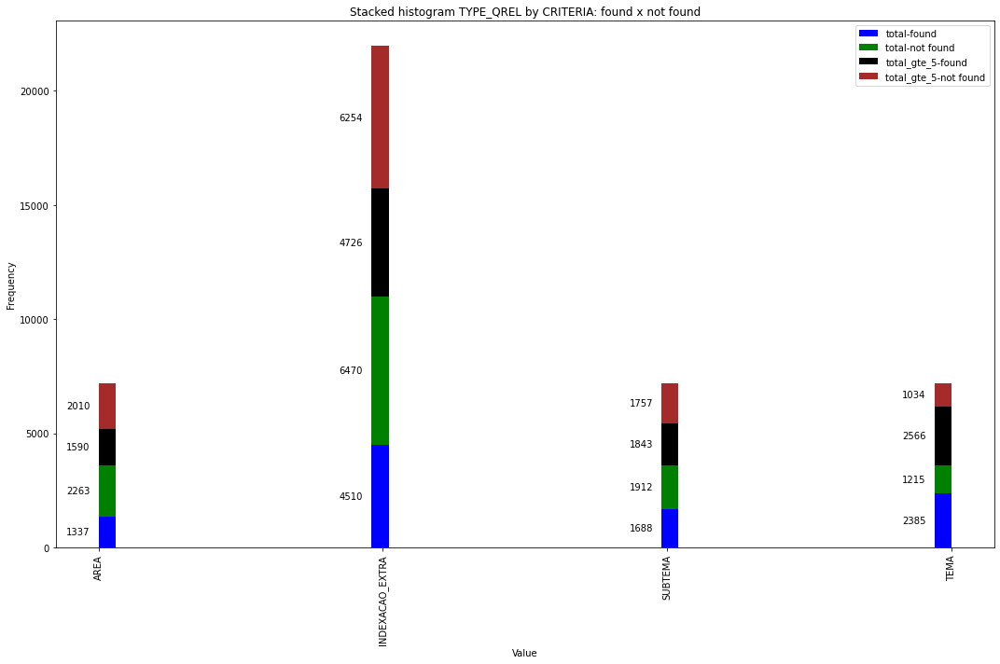

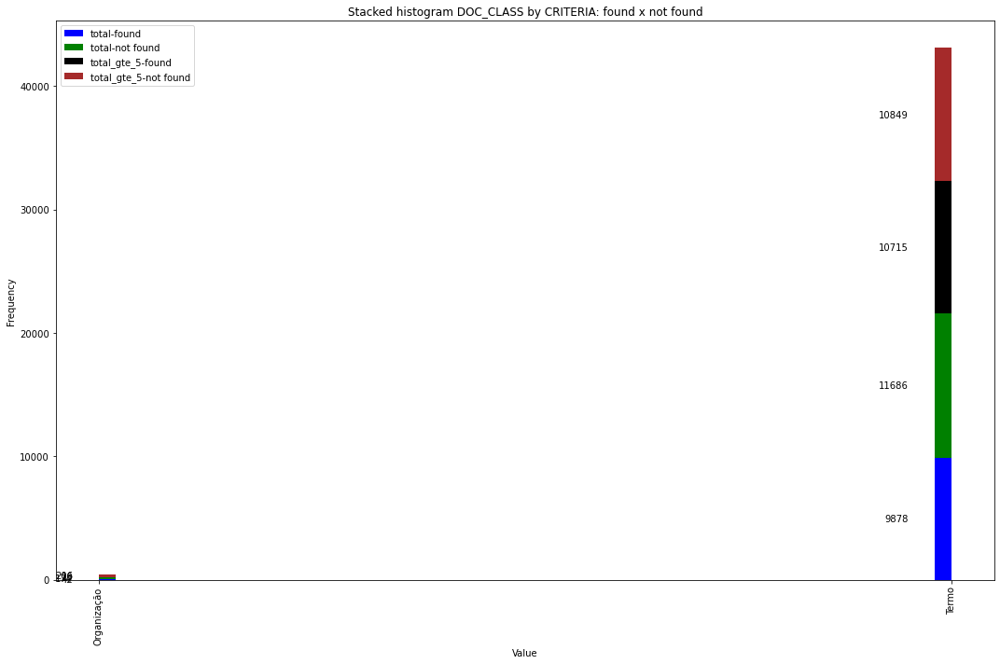

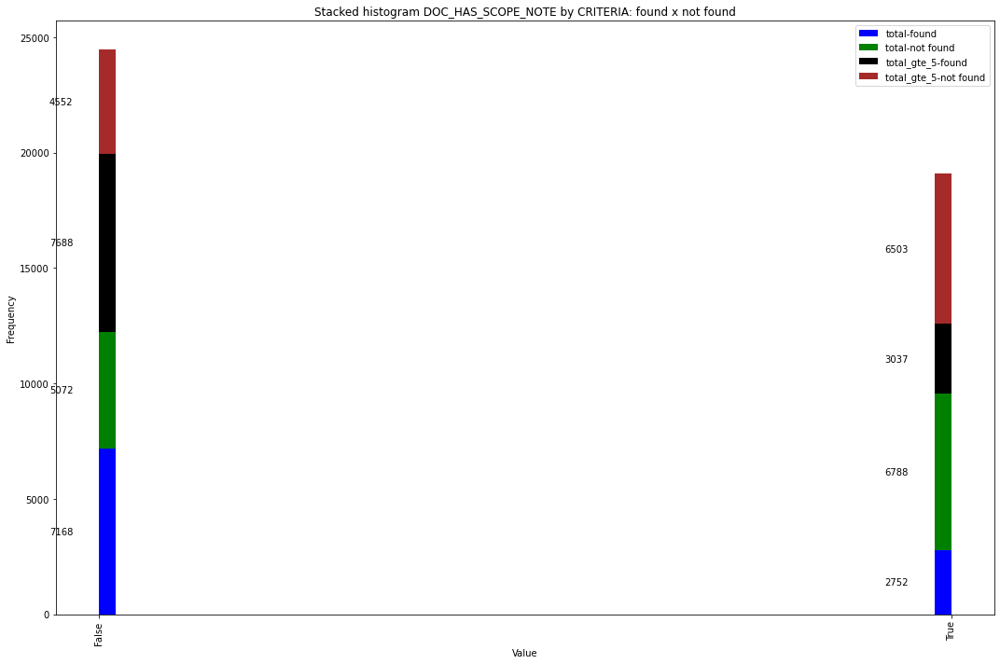

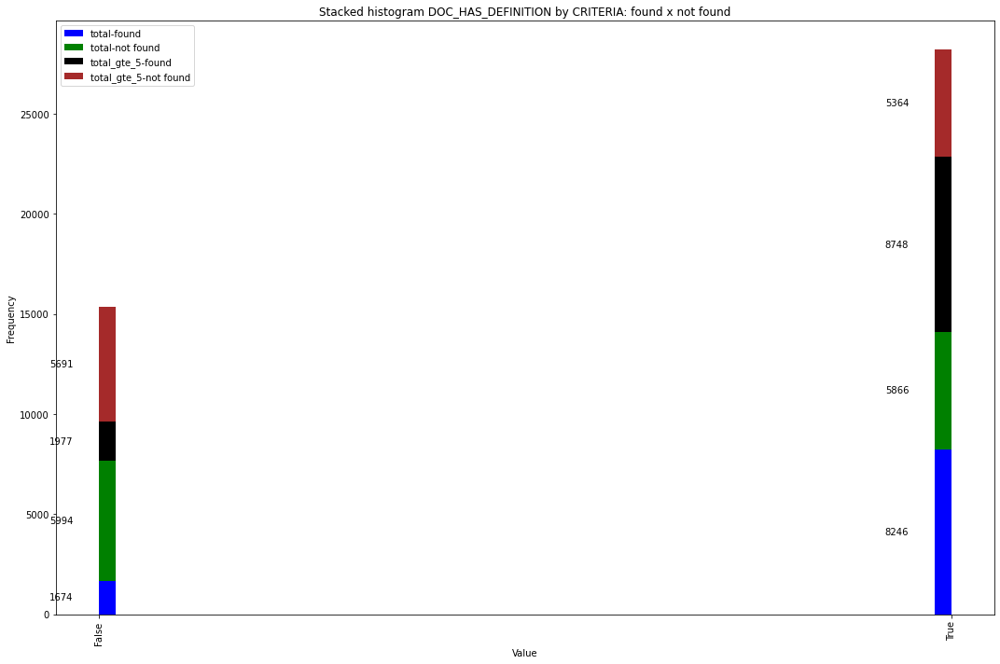

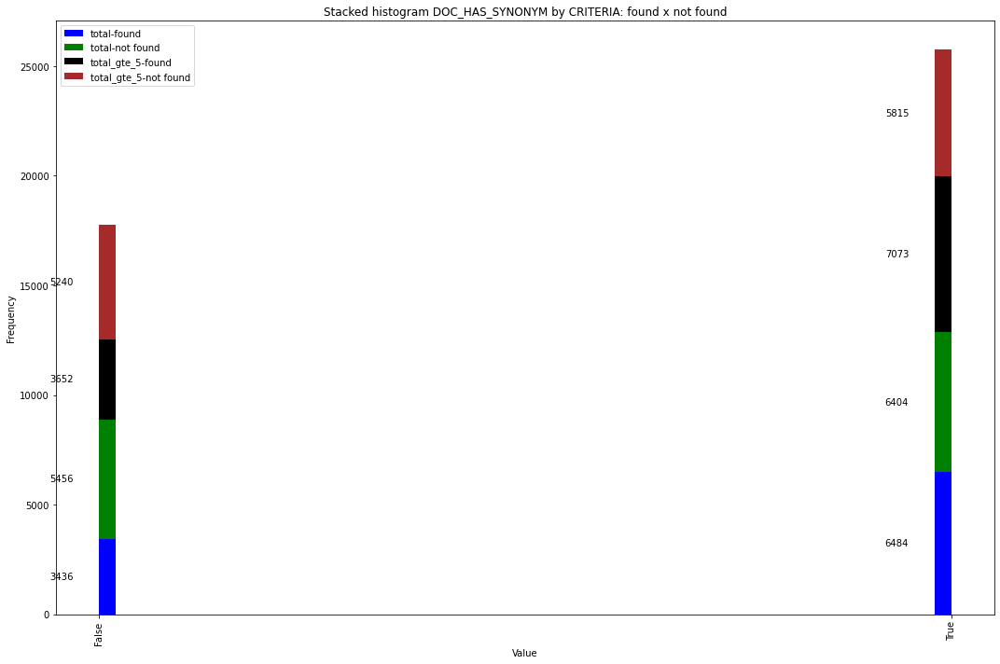

...

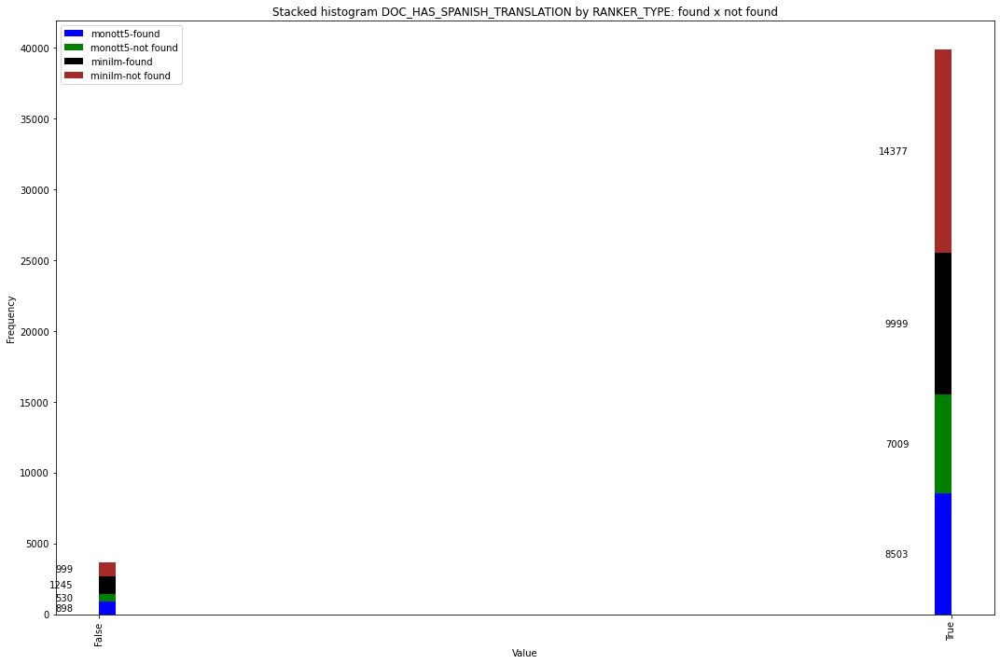

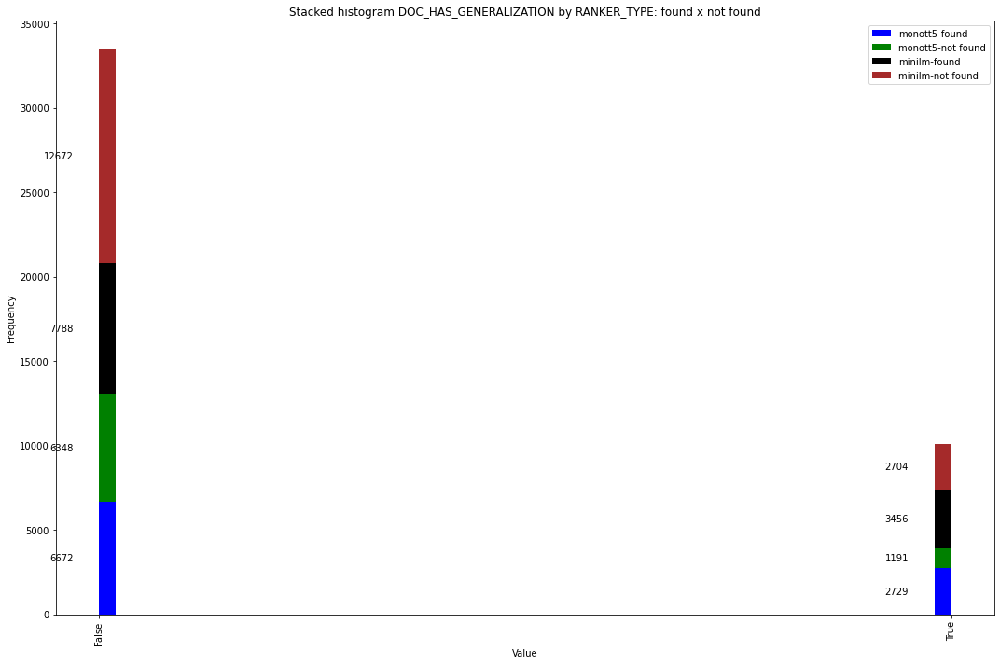

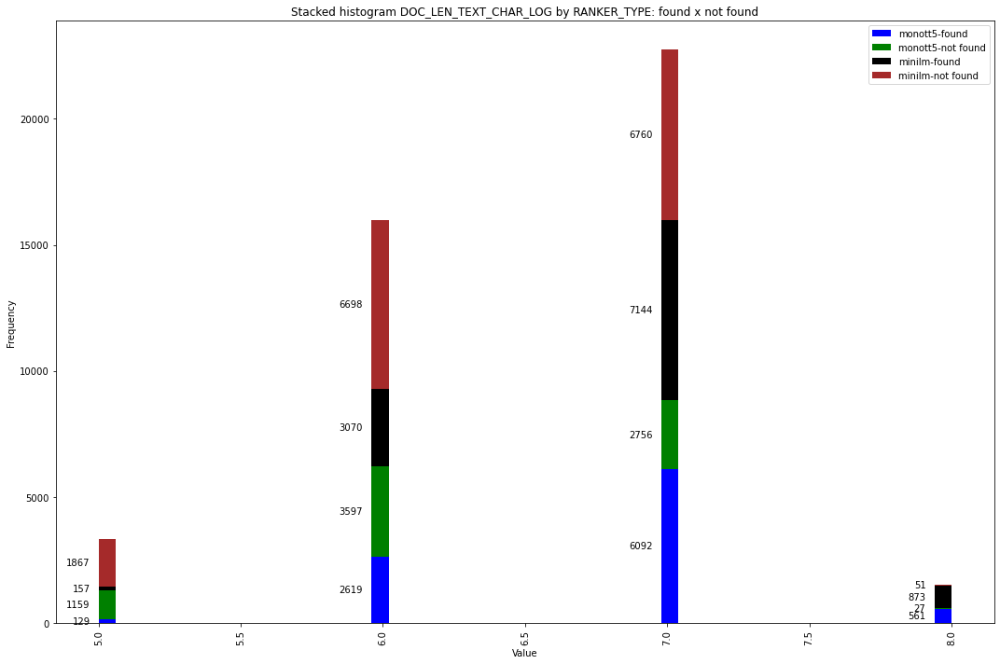

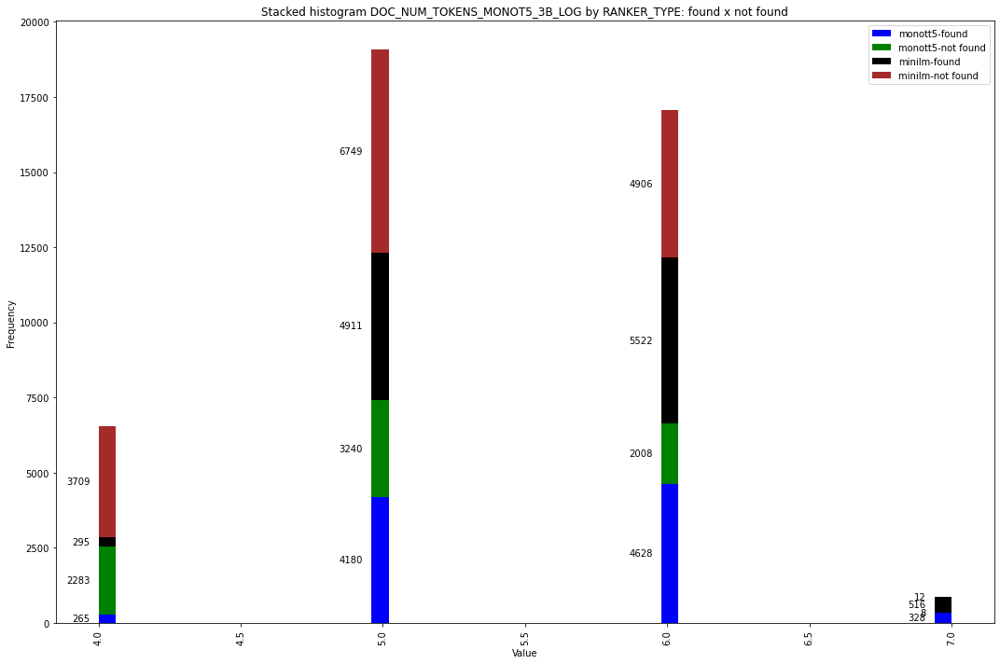

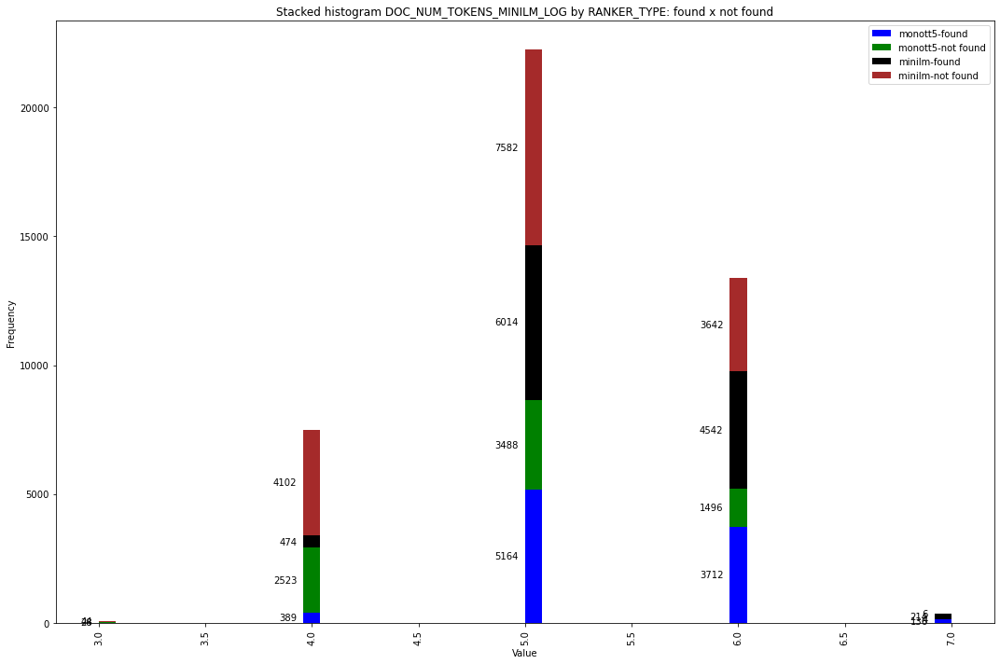

In [ ]:
for hue in ['CRITERIA', 'RETRIEVER_TYPE','RANKER_TYPE']:
    assert len(df_result_doc_found[hue].unique()) == 2, 'It only shows first 2 values'
    value1 = df_result_doc_found[hue].unique()[0]
    value2 = df_result_doc_found[hue].unique()[1]
    for column in list_category_doc:
        f, ax = plt.subplots(1, 1, figsize=(15, 10))
        plt.hist([
            df_result_doc_found[df_result_doc_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_found[df_result_doc_found[hue] == value2].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value2].sort_values(by=column)[column].dropna(),
        ],
            color=['blue', 'green', 'black', 'brown'],
            label=[f'{value1}-found', f'{value1}-not found', f'{value2}-found', f'{value2}-not found'],
            stacked=True, bins=50)

        # Definir os rótulos do eixo X para colunas booleanas
        if '_HAS_' in column:
            plt.xticks([0, 1], ['False', 'True'])

        # Adicionar os valores das barras no topo e no lado esquerdo
        for rect in ax.patches:
            height = rect.get_height()
            width = rect.get_width()
            x = rect.get_x()
            y = rect.get_y()

            if height > 0:
                # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
                ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')

        plt.legend()
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title(f'Stacked histogram {column} by {hue}: found x not found')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


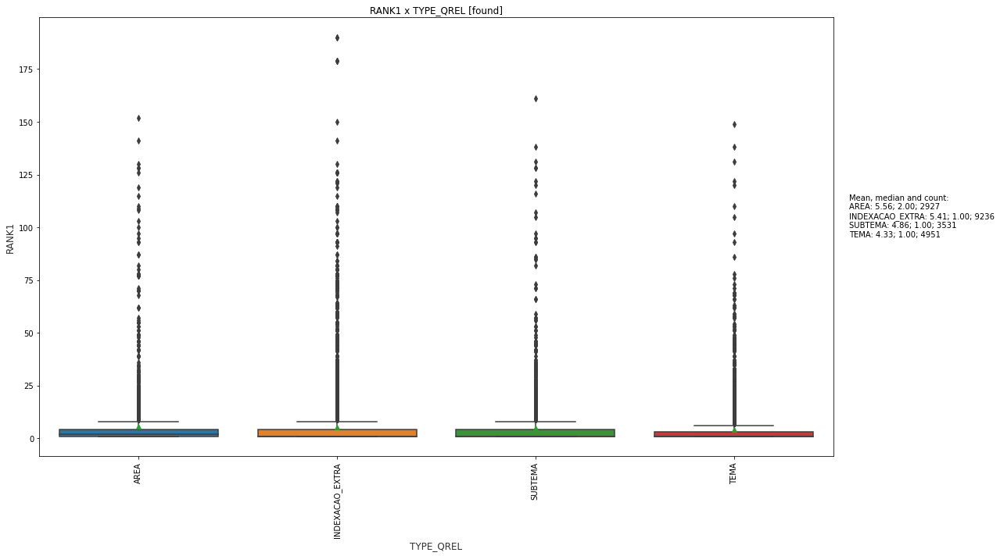

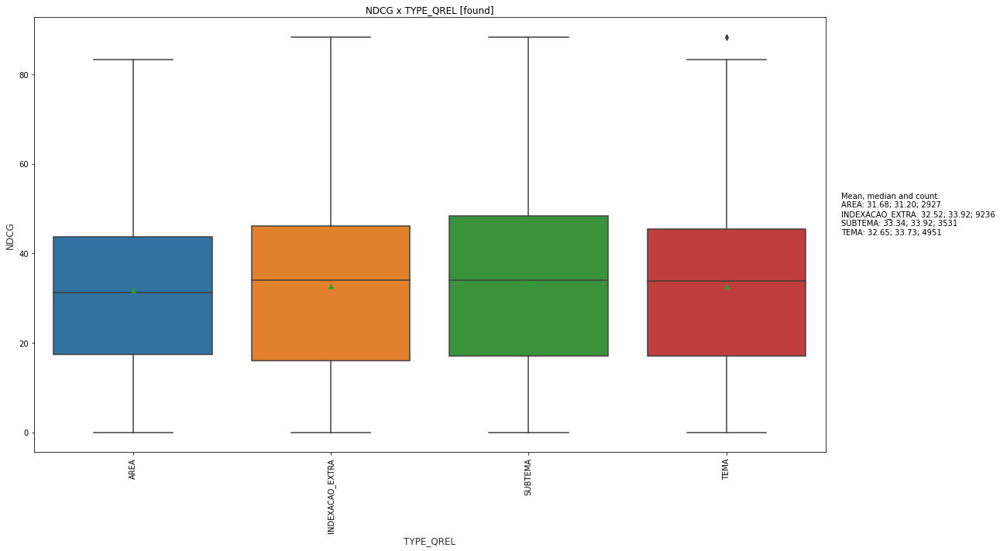

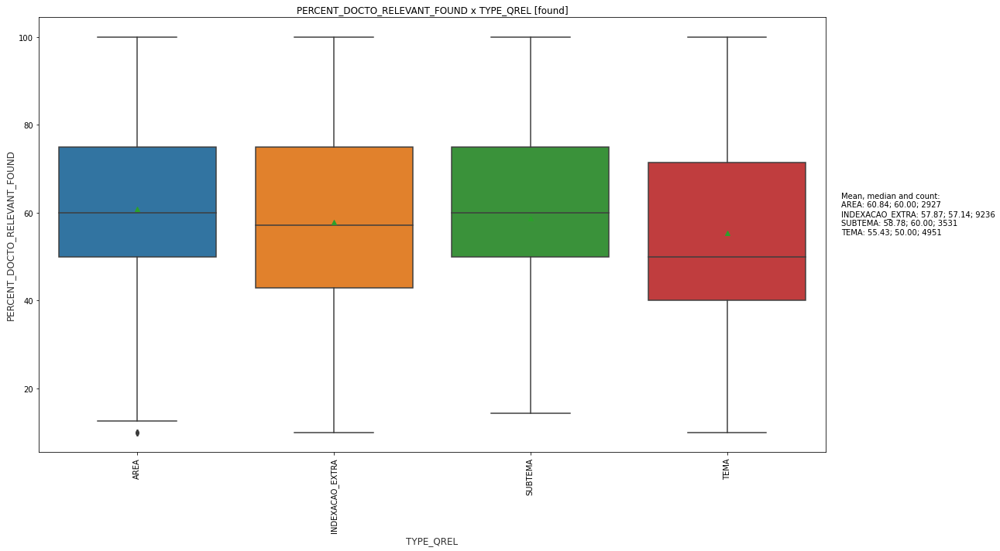

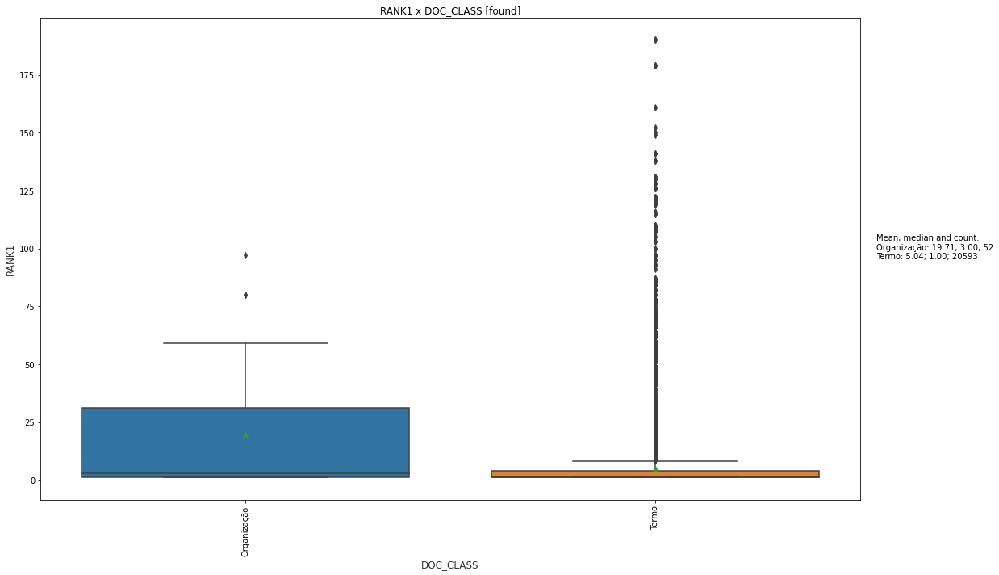

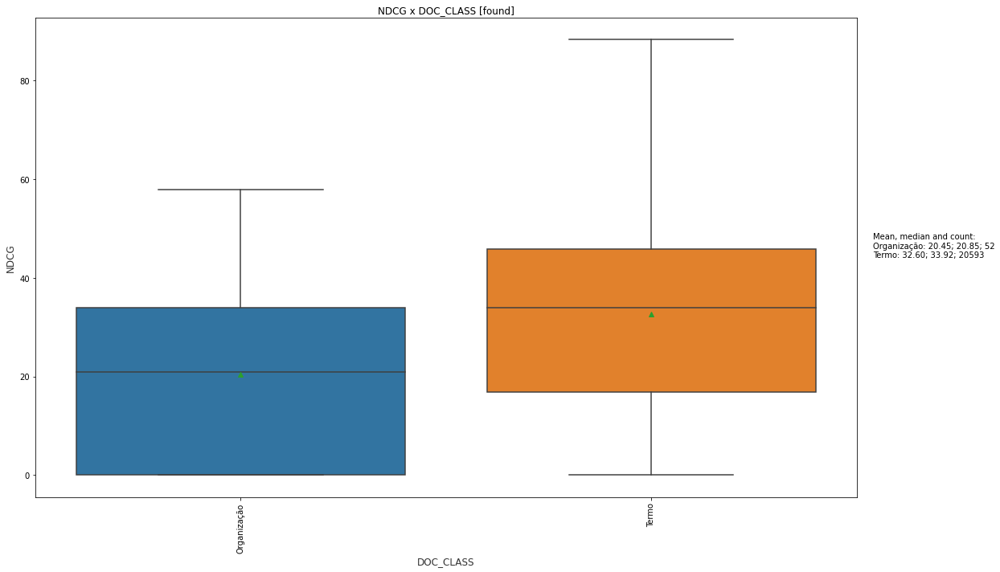

...

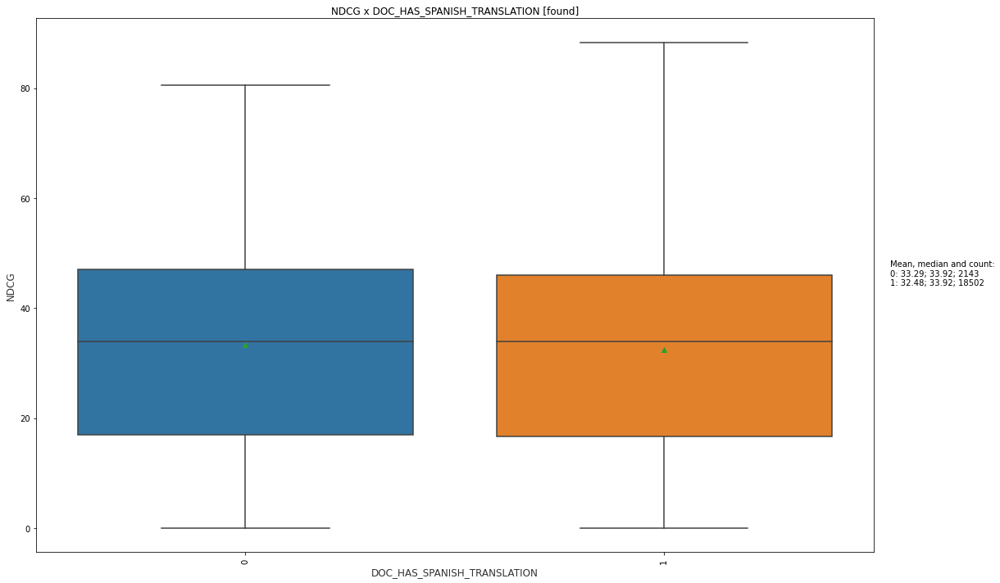

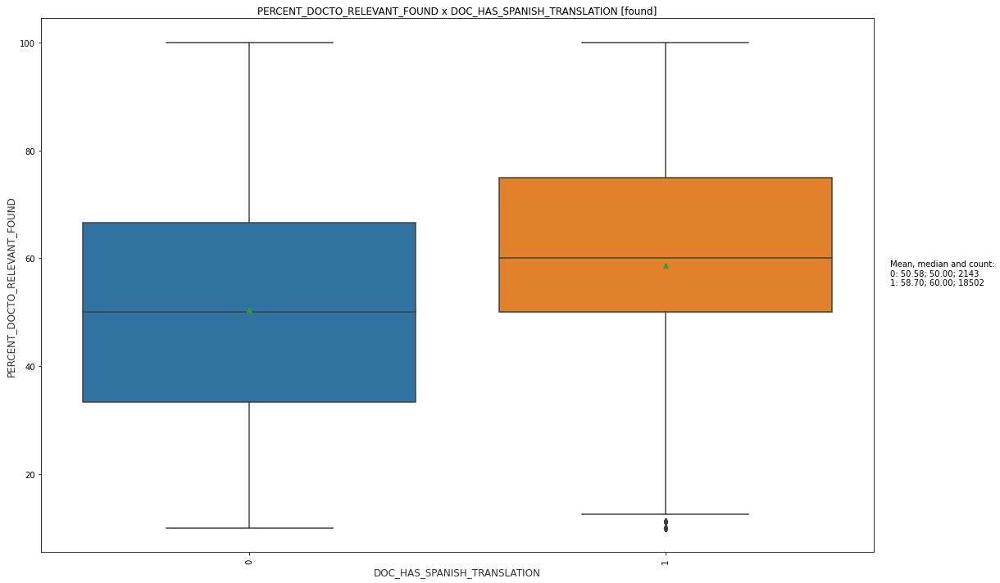

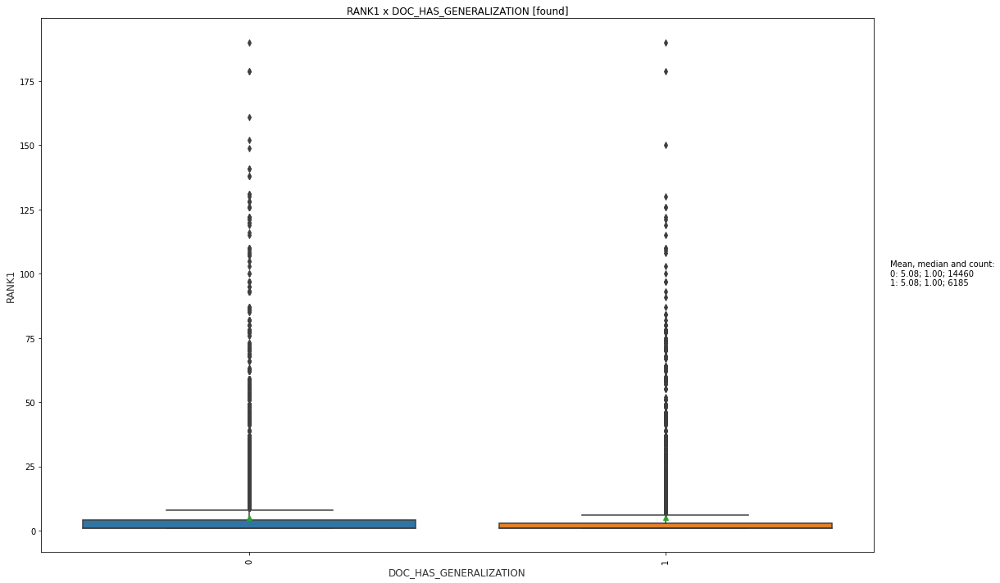

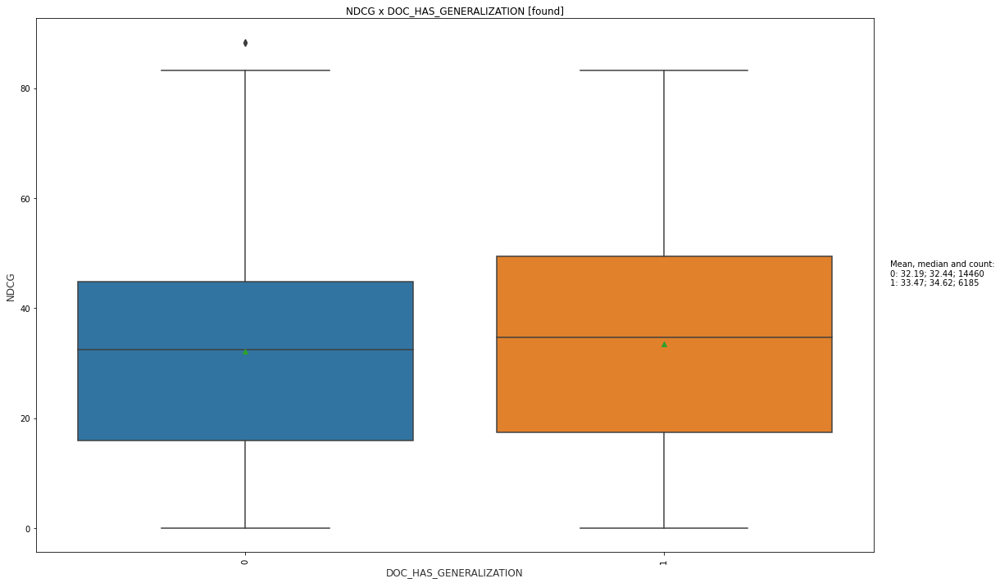

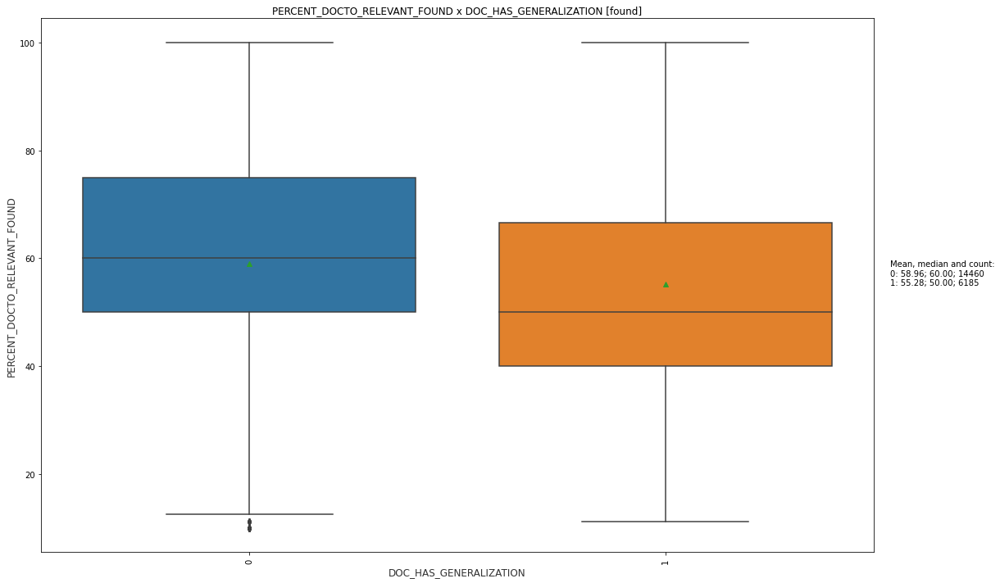

In [ ]:
for context in list_category_doc: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result_doc_found[context].unique())
        
        valores_unicos = sorted(df_result_doc_found[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context} [found]')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result_doc_found.groupby(context)[metric].mean()
        mediana = df_result_doc_found.groupby(context)[metric].median()
        count = df_result_doc_found.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean, median and count:\n{mm_str}", transform=ax.transAxes)

        """
        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()
        """

In [ ]:
len(df_result_doc_found['DOC_ID'].unique())

303